In [ ]:
import numpy as np
import scipy.stats as ss
import matplotlib.pyplot as plt
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier
from sklearn.datasets import make_blobs
from sklearn.model_selection import train_test_split
import tensorflow as tf

04.10.2025

Ансамблевые методы

Bagging

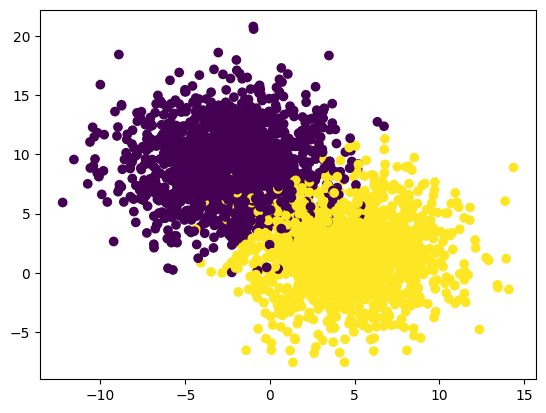

In [ ]:
X, Y = make_blobs(n_samples = 3000, n_features=2, centers = 2,cluster_std=3, random_state =42)
plt.scatter(X[:, 0], X[:, 1], c=Y)

In [ ]:
x = np.linspace(0, 10, 100)
y = np.random.randint(0, 2, 100)
ind = np.array(range(100))
np.random.shuffle(ind)
x2 = x[ind]
y2 = y[ind]
x2 = x.copy()
np.random.shuffle(x2)
print(x2[:50], y2[:50])
print(x2[50:])

[8.08080808 0.4040404  6.66666667 7.97979798 6.86868687 8.88888889
 5.45454545 4.14141414 2.62626263 9.6969697  7.07070707 4.44444444
 1.71717172 6.76767677 2.72727273 4.54545455 5.85858586 4.74747475
 6.26262626 7.67676768 3.13131313 8.28282828 5.35353535 0.
 4.94949495 5.75757576 4.34343434 4.24242424 8.78787879 6.16161616
 6.56565657 2.82828283 6.06060606 2.52525253 0.50505051 1.01010101
 3.03030303 8.38383838 1.51515152 7.47474747 2.32323232 7.87878788
 2.12121212 4.84848485 9.49494949 1.31313131 6.36363636 7.17171717
 8.68686869 0.60606061] [0 1 1 0 1 0 1 0 1 1 0 1 1 1 0 1 1 1 1 0 0 0 0 1 1 0 1 0 1 1 1 0 0 0 1 0 0
 0 1 0 0 0 1 0 1 1 0 0 1 1]
[ 0.1010101   3.63636364  9.5959596   7.27272727  2.92929293 10.
  2.42424242  9.29292929  9.39393939  7.37373737  5.95959596  5.15151515
  6.96969697  0.2020202   6.46464646  5.05050505  7.57575758  1.61616162
  8.98989899  8.58585859  4.04040404  1.11111111  5.65656566  3.33333333
  9.19191919  1.21212121  8.18181818  2.22222222  3.43434343 

In [ ]:
x = np.linspace(0, 10, 100)
y = np.random.randint(0, 2, 100)
xtrain, xtest, ytrain, ytest = train_test_split(x, y)
print(xtrain.shape, xtest.shape)

(75,) (25,)


4 0.9613333333333334


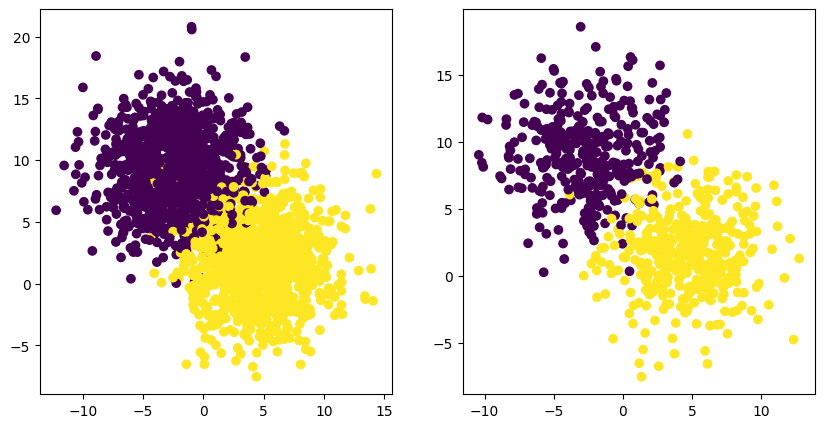

In [ ]:
plt.figure(figsize=(10, 5))
xtrain, xtest, ytrain, ytest = train_test_split(X, Y)
plt.subplot(121)
plt.scatter(xtrain[:, 0], xtrain[:, 1], c=ytrain)
plt.subplot(122)
plt.scatter(xtest[:, 0], xtest[:, 1], c=ytest)
sc_opt, n_opt = -1, -1
for n in range(1, 100):
  clf = DecisionTreeClassifier(max_depth=n)
  clf.fit(xtrain, ytrain)
  sc = clf.score(xtest, ytest)
  if sc>sc_opt:
    sc_opt=sc
    n_opt=n
print(n_opt, sc_opt)

In [ ]:
xt, xtest, yt, ytest = train_test_split(X, Y, test_size=0.2)
xtrain, xval, ytrain, yval = train_test_split(xt, yt, test_size=0.25)
sc_opt, n_opt = -1, -1
for n in range(1, 100):
  clf = DecisionTreeClassifier(max_depth=n)
  clf.fit(xtrain, ytrain)
  sc = clf.score(xval, yval)
  if sc>sc_opt:
    sc_opt=sc
    n_opt=n
print(n_opt, sc_opt)
clf = DecisionTreeClassifier(max_depth=n_opt)
clf.fit(xtrain, ytrain)
sc = clf.score(xtest, ytest)
print(sc)

4 0.9633333333333334
0.9416666666666667


{'fit_time': array([0.00774527, 0.00766349, 0.00859475, 0.00761843, 0.0084753 ,
       0.00899076, 0.0088985 , 0.00804973, 0.00747323, 0.00797462]), 'score_time': array([0.0009923 , 0.00089264, 0.00098014, 0.00094271, 0.00111938,
       0.00116324, 0.00114584, 0.00098515, 0.00092316, 0.00092793]), 'test_score': array([0.93      , 0.94666667, 0.94333333, 0.92666667, 0.93      ,
       0.92      , 0.93666667, 0.96333333, 0.94333333, 0.94      ])}
0.9380000000000001
0.9146761924206188
0.9613238075793813


In [ ]:
from sklearn.model_selection import ShuffleSplit
cvsk = ShuffleSplit()
res = cross_validate(clf, x, y, cv=cvsk)
print(res)
print(res['test_score'].mean())
print(res['test_score'].mean()-2.0*res['test_score'].std())
print(res['test_score'].mean()+2.0*res['test_score'].std())

{'fit_time': array([0.01492548, 0.00885868, 0.01171851, 0.0106914 , 0.01065612,
       0.01070976, 0.01102543, 0.01109529, 0.01326561, 0.01126647]), 'score_time': array([0.00136137, 0.00140572, 0.00134587, 0.00136495, 0.00151181,
       0.00152206, 0.00151992, 0.00140142, 0.00144958, 0.0014739 ]), 'test_score': array([0.93666667, 0.93333333, 0.92666667, 0.94666667, 0.93333333,
       0.94666667, 0.96      , 0.92666667, 0.92666667, 0.94666667])}
0.9383333333333332
0.9169895858752237
0.9596770807914428


In [ ]:
from sklearn.model_selection import cross_validate

x, y = make_blobs(n_samples = 3000, n_features=2, centers=2, cluster_std=3, random_state=42)

clf = DecisionTreeClassifier()
res = cross_validate(clf, x, y, cv=10)
print(res)
print(res['test_score'].mean())
print(res['test_score'].mean()-2.0*res['test_score'].std())
print(res['test_score'].mean()+2.0*res['test_score'].std())

{'fit_time': array([0.01726604, 0.01026535, 0.0313642 , 0.03609562, 0.02492881,
       0.01595569, 0.03167915, 0.03563952, 0.0284543 , 0.02356863]), 'score_time': array([0.00157189, 0.00230145, 0.00325108, 0.00468898, 0.00168586,
       0.00267982, 0.00561357, 0.0055871 , 0.00356984, 0.00131512]), 'test_score': array([0.93666667, 0.94333333, 0.94333333, 0.92666667, 0.92666667,
       0.91666667, 0.93333333, 0.96      , 0.93666667, 0.93333333])}
0.9356666666666668
0.9133457746096225
0.957987558723711


In [ ]:
from sklearn.model_selection import cross_validate, ShuffleSplit
x=np.linspace(1,100,10000)
y=(np.sin(x)+np.random.rand(x.shape[0])*0.3>0.2).astype(int)
cvsk = ShuffleSplit()
x=x[:,np.newaxis]
res = cross_validate(clf, x, y, cv=cvsk)
print(res)
print(res['test_score'].mean())
print(res['test_score'].mean()-2.*res['test_score'].std())
print(res['test_score'].mean()+2.*res['test_score'].std())

{'fit_time': array([0.05609059, 0.07525897, 0.06534791, 0.05543423, 0.04097366,
       0.03451014, 0.03418946, 0.03619027, 0.03445959, 0.05084252]), 'score_time': array([0.00382638, 0.0038929 , 0.00230885, 0.00174069, 0.00109482,
       0.00109982, 0.00109434, 0.00118256, 0.00114346, 0.00175071]), 'test_score': array([0.964, 0.98 , 0.965, 0.97 , 0.968, 0.978, 0.974, 0.971, 0.97 ,
       0.971])}
0.9711000000000001
0.9614067033471579
0.9807932966528422


In [ ]:
from sklearn.model_selection import TimeSeriesSplit
cvsk = TimeSeriesSplit()
res = cross_validate(clf, x, y, cv=cvsk)
print(res)
print(res['test_score'].mean())
print(res['test_score'].mean()-2.*res['test_score'].std())
print(res['test_score'].mean()+2.*res['test_score'].std())

{'fit_time': array([0.00475311, 0.00873303, 0.02607179, 0.06622887, 0.04091024]), 'score_time': array([0.00166535, 0.0015471 , 0.00380731, 0.002002  , 0.00118899]), 'test_score': array([0.4729892 , 0.4057623 , 0.53721489, 0.52761104, 0.44657863])}
0.478031212484994
0.37924518623736725
0.5768172387326207


In [ ]:
from sklearn.model_selection import StratifiedKFold
cvsk = StratifiedKFold()
res = cross_validate(clf, x, y, cv=cvsk)
print(res)
print(res['test_score'].mean())
print(res['test_score'].mean()-2.*res['test_score'].std())
print(res['test_score'].mean()+2.*res['test_score'].std())

{'fit_time': array([0.04487538, 0.06563711, 0.05377436, 0.04272532, 0.04310393]), 'score_time': array([0.00248957, 0.00188875, 0.00210428, 0.0020349 , 0.00211668]), 'test_score': array([0.492 , 0.58  , 0.603 , 0.5805, 0.527 ])}
0.5565
0.47491078502645095
0.638089214973549


Возвращение к ансамблевым методам

In [ ]:
from sklearn.ensemble import BaggingClassifier
from sklearn import tree
x, y = make_blobs(n_samples = 3000, n_features=2, centers=2, cluster_std=3, random_state=42)
xtrain, xval, ytrain, yval = train_test_split(x, y, test_size=0.2)
bagging_clf = BaggingClassifier(tree.DecisionTreeClassifier(max_depth = 2), n_estimators=10)
bagging_clf = bagging_clf.fit(xtrain, ytrain)
print(bagging_clf.score(xval, yval))

0.95


In [ ]:
from sklearn.ensemble import RandomForestClassifier
rc = RandomForestClassifier(max_depth = 2, n_estimators=10)
rc.fit(xtrain, ytrain)
print(rc.score(xval, yval))

0.9466666666666667


In [ ]:
from sklearn.ensemble import StackingClassifier
x, y = make_blobs(n_samples = 3000, n_features=2, centers=2, cluster_std=3, random_state=42)
xtrain, xval, ytrain, yval = train_test_split(x, y, test_size=0.2)
stacking_clf = StackingClassifier(estimators=[('t1', tree.DecisionTreeClassifier(max_depth=5)),('t2', tree.DecisionTreeClassifier(max_depth=2)), ('t3', tree.DecisionTreeClassifier(max_depth=2))], final_estimator=tree.DecisionTreeClassifier(max_depth=1))
stacking_clf = stacking_clf.fit(xtrain, ytrain)
print(stacking_clf.score(xval, yval))

0.96


In [ ]:
from sklearn.ensemble import AdaBoostClassifier
x, y = make_blobs(n_samples = 3000, n_features=2, centers=2, cluster_std=3, random_state=42)
xtrain, xval, ytrain, yval = train_test_split(x, y, test_size=0.2)
clf = AdaBoostClassifier(DecisionTreeClassifier(max_depth=2), n_estimators=10)
clf.fit(xtrain, ytrain)
print(clf.score(xval, yval))

0.9433333333333334


06.10.2025

Метод опорных векторов

Text(0.5, 1.0, 'Preds')

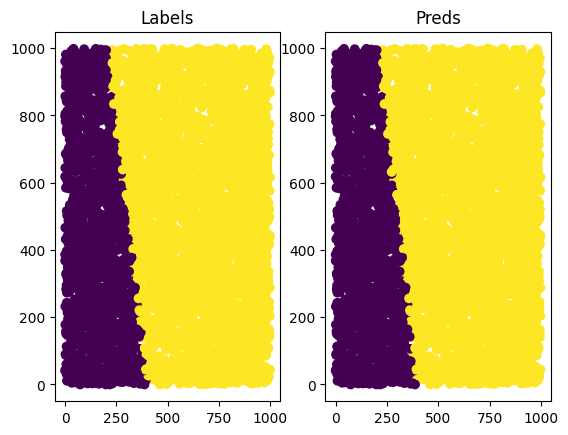

In [ ]:
f = open("source.dat")
d = []
for s in f:
  d.append([float(x) for x in s.split()])
d = np.array(d)
from sklearn.svm import SVC

clf = SVC(kernel="rbf")
X=d[:, :2]
Y = d[:, 2]
clf.fit(X, Y)
yp = clf.predict(X)

fig, axs = plt.subplots(1, 2)
axs[0].scatter(d[:, 0], d[:, 1], c=Y)
axs[0].set_title("Labels")
axs[1].scatter(d[:, 0], d[:, 1], c=yp)
axs[1].set_title("Preds")

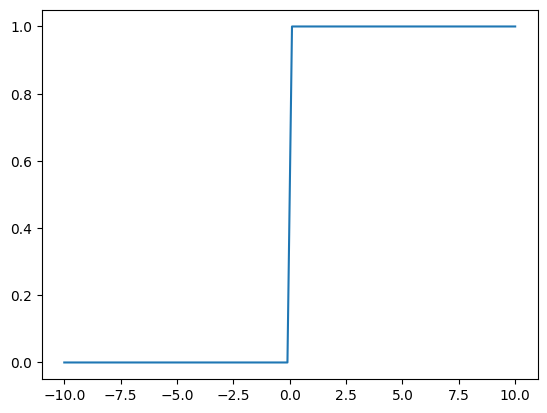

In [ ]:
def act(x):
  return (np.sign(x)+1)/2

x = np.linspace(-10, 10, 100)
plt.plot(x, act(x))


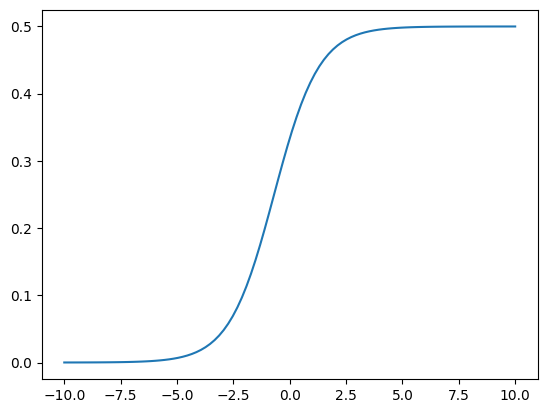

In [ ]:
import math
def act(x):
  return 1 / (1 + np.exp(-x)+1)

x = np.linspace(-10, 10, 100)
plt.plot(x, act(x))

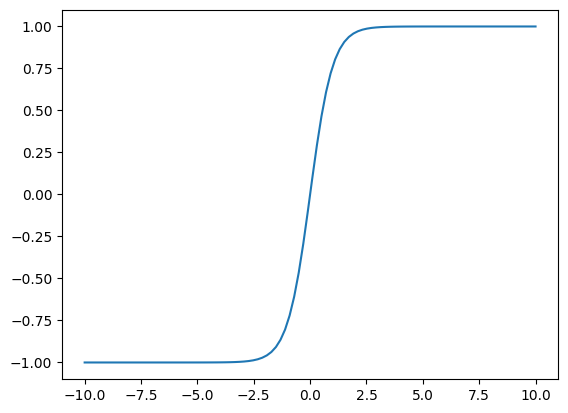

In [ ]:
def act(x):
  return (np.exp(2*x) - 1) / (np.exp(2*x) + 1)

x = np.linspace(-10, 10, 100)
plt.plot(x, act(x))

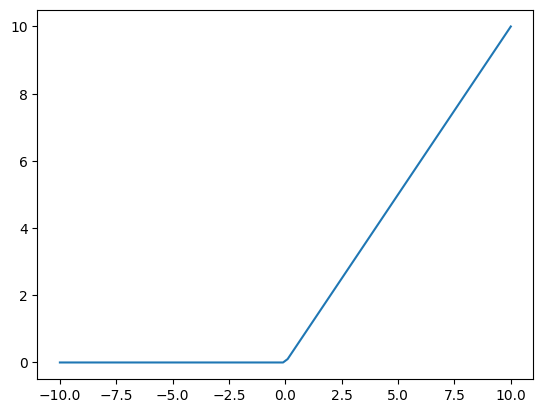

In [ ]:
def act(x):
  c=x.copy()
  c[c<0]=0
  return c
x = np.linspace(-10, 10, 100)
plt.plot(x, act(x))

In [ ]:
def f(x):
  return (np.sign(x) + 1) / 2
s = [0, 1]
w0, w1 = 1.5, -1.5
b = -1
for x in s:
  for y in s:
    print(x, y, f(x * w0 + y * w1 + b))

0 0 0.0
0 1 0.0
1 0 1.0
1 1 0.0


11.10.2025

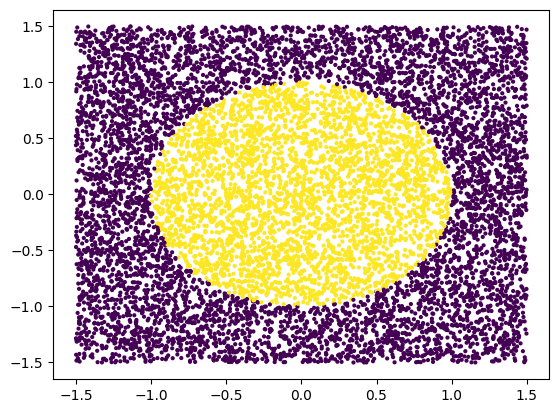

In [ ]:
def c(x, y):
  return x**2+y**2<1
X = (np.random.rand(10000, 2)-0.5)*3
plt.scatter(X[:, 0], X[:, 1], c=c(X[:, 0], X[:, 1]), s=4)

18.10.2025

D = Max(class) / Min(class)

Если дисбаланс равна 1.1, то ошибка в Accuracy будет примерно 10%

Градиентный спуск

In [ ]:
import torch

t = torch.Tensor([1., 2., 3., 4.])
t.requires_grad=True
t

tensor([1., 2., 3., 4.], requires_grad=True)

Одномерный градиентный спуск

In [ ]:
w = torch.Tensor([10.0])
w.requires_grad = True
#w.data[0] = np.random.rand() * 10
alpha = 0.01
for step in range(2000):
  foo = 5*(w[0]) ** 2 + 3
  foo.backward()
  w.data = w.data - alpha * w.grad
  w.grad.zero_()
  if abs(w.data[0] - 0) <1e-4:
    break
print(w, step)

tensor([9.2614e-05], requires_grad=True) 109


Двумерный градиентный спуск

In [ ]:
w = torch.Tensor([[10.0], [9.0]])
w.requires_grad = True
alpha = 0.1
for step in range(2000):
  foo = 5*(w[0])**2 + 7*(w[1] - 3) ** 2 + 4
  foo.backward()
  w.data = w.data - alpha * w.grad
  w.grad.zero_()
  if abs(w.data[0] - 0) <1e-4 and abs(w.data[1] - 3) <1e-4:
    break
print(w, step)

tensor([[0.0000],
        [3.0000]], requires_grad=True) 12


Adam

In [ ]:
w = torch.Tensor([[10.0], [9.0]])
w.requires_grad = True
alpha = 0.01
optimizer = torch.optim.SGD([w], lr=alpha)
for step in range(10000):
  foo = 5*(w[0])**2 + 7*(w[1] - 3) ** 2 + 4
  foo.backward()
  optimizer.step()
  optimizer.zero_grad()
  if abs(w.data[0] - 0) <1e-4 and abs(w.data[1] - 3) <1e-4:
    break
print(w, step)

tensor([[9.2614e-05],
        [3.0000e+00]], requires_grad=True) 109


oval

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense (Dense)                   │ (None, 1)              │             3 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3 (12.00 B)

 Trainable params: 3 (12.00 B)

 Non-trainable params: 0 (0.00 B)

Epoch 1/10
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4964 - loss: 86.0068
Epoch 2/10
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4947 - loss: 85.9788
Epoch 3/10
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4970 - loss: 87.5799
Epoch 4/10
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5025 - loss: 83.8668
Epoch 5/10
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4813 - loss: 89.2004
Epoch 6/10
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4993 - loss: 85.8594
Epoch 7/10
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5038 - loss: 81.9070
Epoch 8/10
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4873 - loss: 82.2444
Epoch 9/10
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4937 - loss: 83.7668
Epoch 10/10
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5077 - loss: 79.1103
30000/30000 ━━━━━━━━━━━━━━━━━━━━ 33s 1ms/step


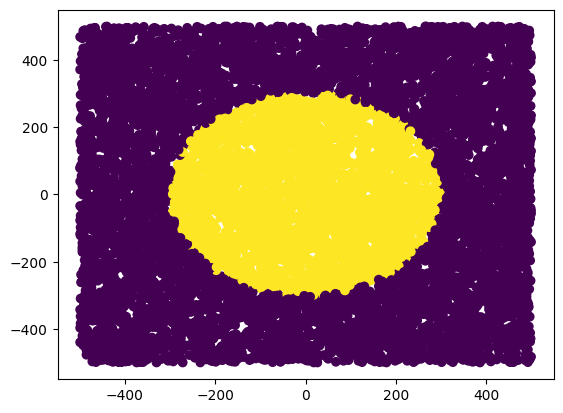

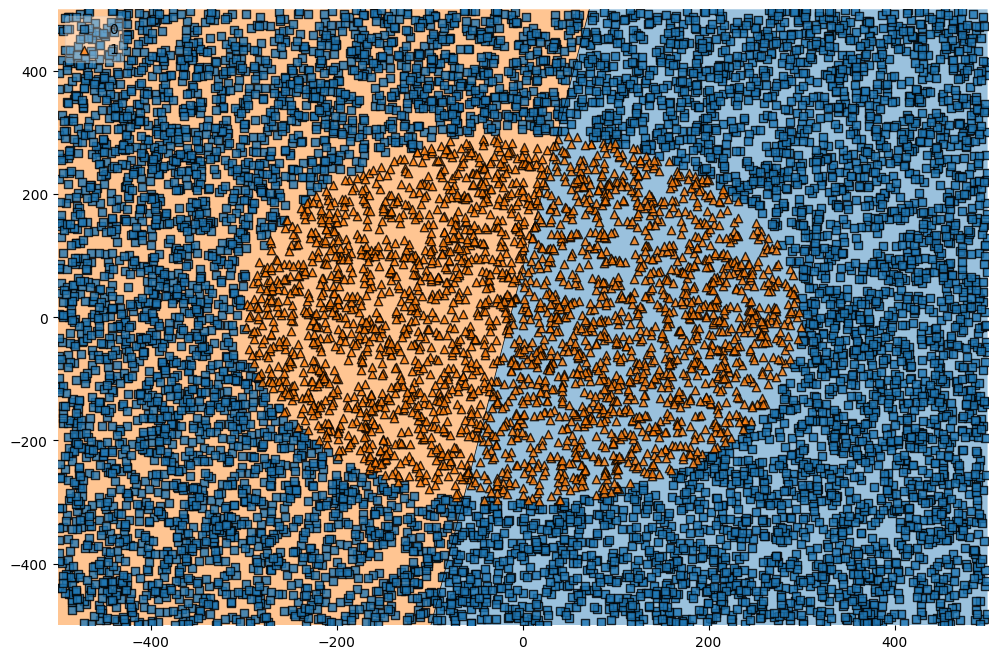

In [ ]:
f = open('res_oval.dat')
d = []
for s in f:
  d.append([float(x) for x in s.split()])
d = np.array(d)
plt.scatter(d[:, 0], d[:, 1], c=d[:, 2])


import tensorflow as tf
model = tf.keras.models.Sequential()
model.add(tf.keras.layers.Input(shape=(2,)))
model.add(tf.keras.layers.Dense(1, activation='sigmoid'))
model.summary()

tf.keras.utils.plot_model(model, show_layer_activations=True, show_shapes=True)

model.compile(optimizer="sgd", loss='binary_crossentropy', metrics=["accuracy"])
model.fit(d[:, :2], d[:, 2], epochs=10)

from mlxtend.plotting import plot_decision_regions
plt.figure(figsize=(12,8))
plot_decision_regions(d[:, :2], d[:, 2].astype(int), clf=model, legend=2)
plt.show()

20.10.2025

Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_6 (Dense)                 │ (None, 5)              │            15 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 5)              │            30 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 1)              │             6 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 51 (204.00 B)

 Trainable params: 51 (204.00 B)

 Non-trainable params: 0 (0.00 B)

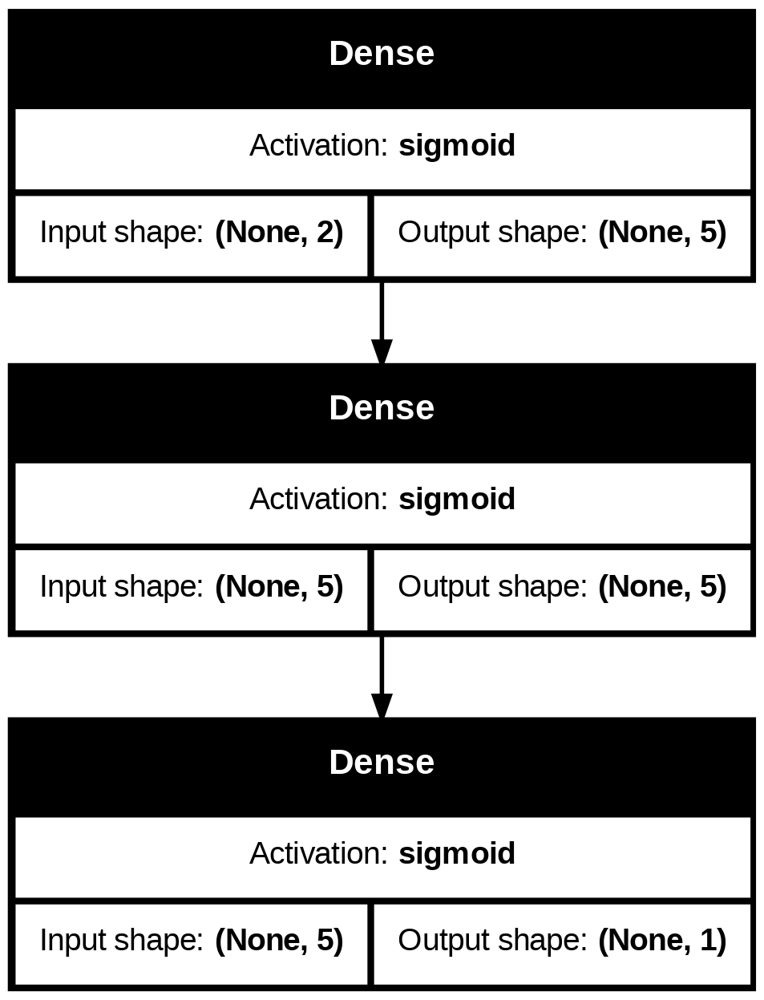

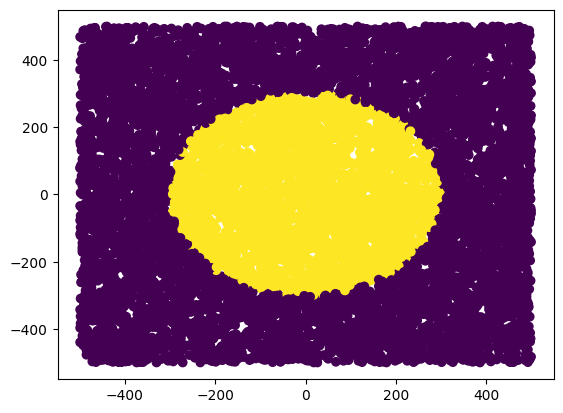

In [ ]:
f = open('res_oval.dat')
d = []
for s in f:
  d.append([float(x) for x in s.split()])
d = np.array(d)
plt.scatter(d[:, 0], d[:, 1], c=d[:, 2])


import tensorflow as tf
model = tf.keras.models.Sequential()
model.add(tf.keras.layers.Input(shape=(2,)))
model.add(tf.keras.layers.Dense(5, activation='sigmoid'))
model.add(tf.keras.layers.Dense(5, activation='sigmoid'))
model.add(tf.keras.layers.Dense(1, activation='sigmoid'))
model.summary()

tf.keras.utils.plot_model(model, show_layer_activations=True, show_shapes=True)

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense (Dense)                   │ (None, 5)              │            15 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1)              │             6 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 21 (84.00 B)

 Trainable params: 21 (84.00 B)

 Non-trainable params: 0 (0.00 B)

Epoch 1/10000
188/188 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.5056 - aucpr: 0.2964 - loss: 0.7792 - val_accuracy: 0.6247 - val_aucpr: 0.2987 - val_loss: 0.6462
Epoch 2/10000
188/188 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.6433 - aucpr: 0.2839 - loss: 0.6337 - val_accuracy: 0.7013 - val_aucpr: 0.3013 - val_loss: 0.6201
Epoch 3/10000
188/188 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.7167 - aucpr: 0.2714 - loss: 0.6101 - val_accuracy: 0.7053 - val_aucpr: 0.3126 - val_loss: 0.6104
Epoch 4/10000
188/188 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.7184 - aucpr: 0.2729 - loss: 0.6013 - val_accuracy: 0.7053 - val_aucpr: 0.3239 - val_loss: 0.6106
Epoch 5/10000
188/188 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.7180 - aucpr: 0.2867 - loss: 0.6000 - val_accuracy: 0.7053 - val_aucpr: 0.3244 - val_loss: 0.6081
Epoch 6/10000
188/188 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.7182 - aucpr: 0.2866 - loss: 0.5979 - val_accuracy: 0.7053 - val_aucpr: 0.3214 - val_loss: 0.607

KeyboardInterrupt: 

Error in callback <function _draw_all_if_interactive at 0x79b8a7030c20> (for post_execute):


KeyboardInterrupt: 

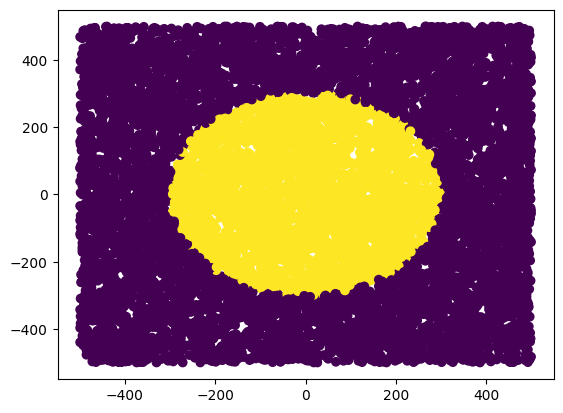

In [ ]:
f = open('res_oval.dat')
d = []
for s in f:
  d.append([float(x) for x in s.split()])
d = np.array(d)
plt.scatter(d[:, 0], d[:, 1], c=d[:, 2])


import tensorflow as tf
model = tf.keras.models.Sequential()
model.add(tf.keras.layers.Input(shape=(2,)))
model.add(tf.keras.layers.Dense(5, activation='sigmoid'))
model.add(tf.keras.layers.Dense(1, activation='sigmoid'))
model.summary()
tf.keras.utils.plot_model(model, to_file='a.png', show_layer_activations = True, show_shapes= True)

model.compile(optimizer="sgd", loss='binary_crossentropy', metrics=["accuracy", tf.keras.metrics.AUC(curve="PR", name="aucpr")])

"""
hist = model.fit(d[:,:2], d[:,2], epochs = 20)
plt.plot(hist.history['accuracy'], label='Acc')
plt.plot(hist.history['aucpr'], label='Auc-PR')
plt.show()

from mlxtend.plotting import plot_decision_regions
#plt.figure(figsize=(12,8))
plot_decision_regions(d[:, :2], d[:, 2].astype(int), clf=model, legend=2)
plt.savefig('c.jpg')
"""

from sklearn.model_selection import train_test_split
Xtr, Xt, Ytr, Yt = train_test_split(d[:,:2], d[:,2])

es = tf.keras.callbacks.EarlyStopping(monitor='val_loss', mode="min", patience=5, restore_best_weights=True)
hist=model.fit(Xtr, Ytr, validation_split=0.2, shuffle=True, epochs=10000)
'''plt.plot(hist.history['loss'], label='Auc-PR@train')
plt.plot(hist.history['val_loss'], label='loss@val')'''
model.evaluate(Xt, Yt)
yprob = model.predict(xt)
yp=(yprob>0.5).astype(int)

from sklearn.metrics import classification_report
print(classification_report(yt, yp))


Epoch 1/20
313/313 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.9457 - aucpr: 0.9780 - loss: 0.1370
Epoch 2/20
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9469 - aucpr: 0.9751 - loss: 0.1388
Epoch 3/20
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9448 - aucpr: 0.9729 - loss: 0.1401
Epoch 4/20
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9437 - aucpr: 0.9704 - loss: 0.1454
Epoch 5/20
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9475 - aucpr: 0.9714 - loss: 0.1437
Epoch 6/20
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9420 - aucpr: 0.9729 - loss: 0.1395
Epoch 7/20
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9482 - aucpr: 0.9772 - loss: 0.1347
Epoch 8/20
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9471 - aucpr: 0.9745 - loss: 0.1374
Epoch 9/20
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9459 - aucpr: 0.9721 - loss: 0.1408
Epoch 10/20
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9444 - aucpr: 0

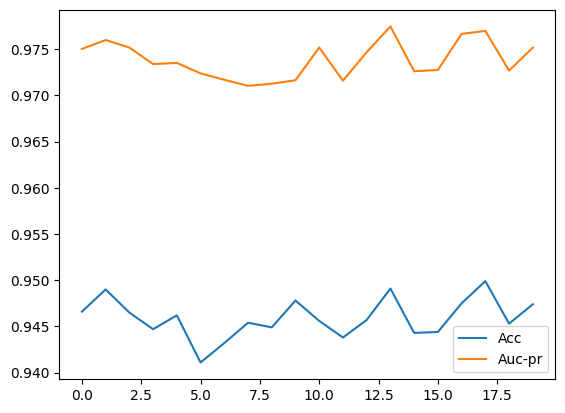

In [ ]:
model.compile(optimizer='sgd', loss='binary_crossentropy', metrics=['accuracy', tf.keras.metrics.AUC(curve='PR', name='aucpr')])
hist = model.fit(d[:, :2], d[:, 2], epochs=20)
plt.plot(hist.history["accuracy"], label="Acc")
plt.plot(hist.history["aucpr"], label="Auc-PR")
plt.legend()

In [ ]:
f = open('test_add_short.dat')
d = []
for s in f:
  d.append([float(x) for x in s.split()])
d = np.array(d)


import tensorflow as tf
model = tf.keras.models.Sequential()
model.add(tf.keras.layers.Input(shape=(2,)))
model.add(tf.keras.layers.Dense(5, activation='sigmoid'))
model.add(tf.keras.layers.Dense(1, activation='sigmoid'))
model.summary()
tf.keras.utils.plot_model(model, to_file='a.png', show_layer_activations = True, show_shapes= True)

model.compile(optimizer="sgd", loss='binary_crossentropy', metrics=["accuracy", tf.keras.metrics.AUC(curve="PR", name="aucpr")])


25.10.2025

Элементы глубоких сетей

(10000, 3)


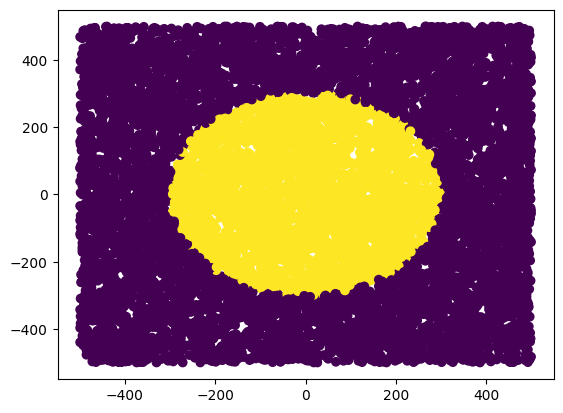

Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_23 (Dense)                │ (None, 5)              │            15 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_24 (Dense)                │ (None, 5)              │            30 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_25 (Dense)                │ (None, 5)              │            30 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_26 (Dense)                │ (None, 5)              │            30 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_27 (Dense)                │ (None, 5)              │            30 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_28 (Dense)                │ (None, 1)              │             6 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 141 (564.00 B)

 Trainable params: 141 (564.00 B)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
175/175 ━━━━━━━━━━━━━━━━━━━━ 7s 13ms/step - accuracy: 0.7012 - aucpr: 0.2794 - loss: 1.1237 - val_accuracy: 0.7007 - val_aucpr: 0.2990 - val_loss: 0.6324
Epoch 2/50
175/175 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.7092 - aucpr: 0.2962 - loss: 0.6194 - val_accuracy: 0.7007 - val_aucpr: 0.3016 - val_loss: 0.6161
Epoch 3/50
175/175 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7356 - aucpr: 0.2653 - loss: 0.5888 - val_accuracy: 0.7007 - val_aucpr: 0.3018 - val_loss: 0.6075
Epoch 4/50
175/175 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.7171 - aucpr: 0.2909 - loss: 0.5932 - val_accuracy: 0.7007 - val_aucpr: 0.2985 - val_loss: 0.6081
Epoch 5/50
175/175 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.7189 - aucpr: 0.2892 - loss: 0.5861 - val_accuracy: 0.7007 - val_aucpr: 0.2997 - val_loss: 0.6021
Epoch 6/50
175/175 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.7197 - aucpr: 0.2874 - loss: 0.5814 - val_accuracy: 0.7007 - val_aucpr: 0.3021 - val_loss: 0.6037
Epoch 7/50
175/

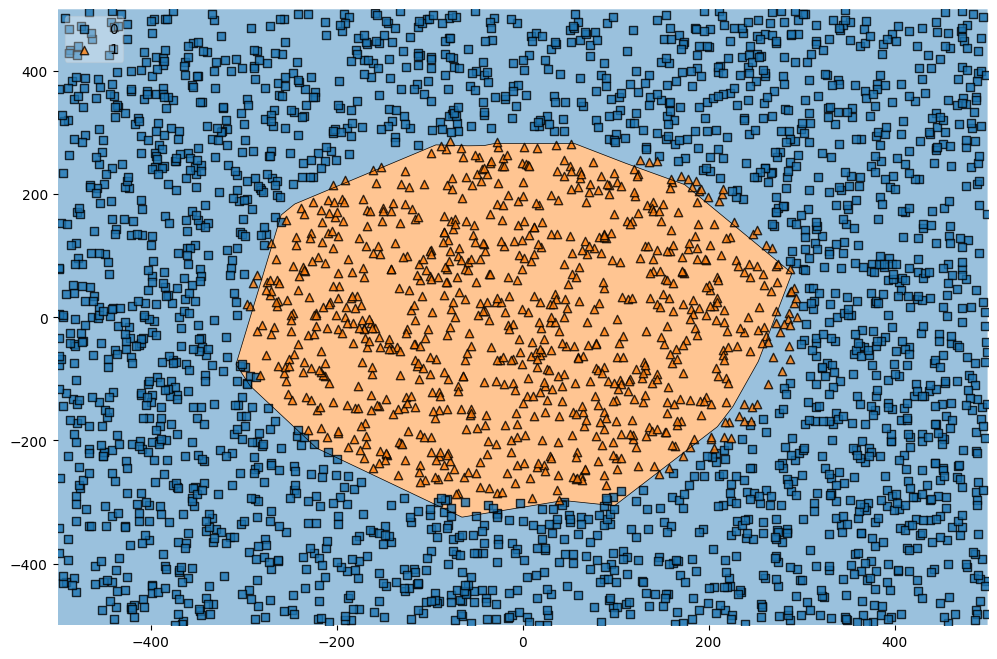

In [ ]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from mlxtend.plotting import plot_decision_regions

f = open('res_oval.dat')
d = []
for s in f:
    d.append([float(x) for x in s.split()])
d = np.array(d)
print(d.shape)
plt.scatter(d[:, 0], d[:, 1], c=d[:, 2])
plt.show()

model = tf.keras.models.Sequential()
model.add(tf.keras.layers.Input(shape=(2,)))
model.add(tf.keras.layers.Dense(5, activation='relu'))
model.add(tf.keras.layers.Dense(5, activation='relu'))
model.add(tf.keras.layers.Dense(5, activation='relu'))
model.add(tf.keras.layers.Dense(5, activation='relu'))
model.add(tf.keras.layers.Dense(5, activation='relu'))
model.add(tf.keras.layers.Dense(1, activation='sigmoid'))
model.summary()

Xtr, Xt, Ytr, Yt = train_test_split(d[:, :2], d[:, 2], test_size=0.3, random_state=42)

model.compile(optimizer='sgd', loss='binary_crossentropy', metrics=['accuracy', tf.keras.metrics.AUC(curve='PR', name='aucpr')])
es = tf.keras.callbacks.EarlyStopping(monitor='val_loss', mode='min', patience=5, restore_best_weights=True)

hist = model.fit(Xtr, Ytr, validation_split=0.2, shuffle=True, epochs=50, callbacks=[es])

plt.figure(figsize=(12, 8))
plot_decision_regions(Xt, Yt.astype(int), clf=model, legend=2)
plt.show()

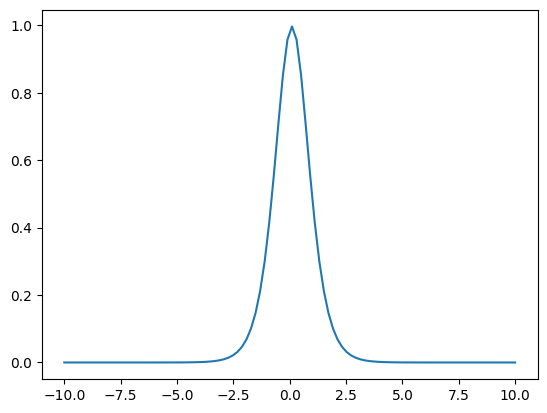

In [ ]:
import math
def a(x):
  return (np.exp(x) - np.exp(-x)) / (np.exp(x) + np.exp(-x))

x = np.linspace(-10, 10, 100)
dx=x[1] - x[0]
plt.plot(x, (a(x) - a(x-dx)) / dx)


01.11.2025

Блок распремления

(1797, 64) (1797,) (1797, 8, 8)


Text(0.5, 1.0, '5')

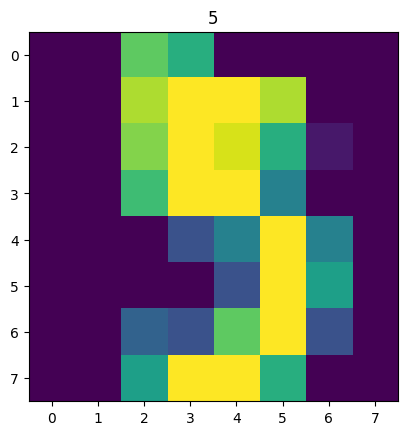

In [ ]:
from sklearn.datasets import load_digits
data = load_digits()
print(data.data.shape, data.target.shape, data.images.shape)

plt.imshow(data.images[5])
plt.title(str(data.target[5]))

Model: "sequential_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ flatten_4 (Flatten)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 10)             │           650 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 650 (2.54 KB)

 Trainable params: 650 (2.54 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/10000
34/34 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - accuracy: 0.0325 - aucpr: 0.0892 - loss: 14.0647 - val_accuracy: 0.1148 - val_aucpr: 0.1023 - val_loss: 8.5678
Epoch 2/10000
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.1267 - aucpr: 0.1205 - loss: 7.2831 - val_accuracy: 0.1556 - val_aucpr: 0.1327 - val_loss: 6.0612
Epoch 3/10000
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.1930 - aucpr: 0.1677 - loss: 5.1178 - val_accuracy: 0.2333 - val_aucpr: 0.2076 - val_loss: 4.1998
Epoch 4/10000
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.3011 - aucpr: 0.2707 - loss: 3.5680 - val_accuracy: 0.3481 - val_aucpr: 0.3280 - val_loss: 2.9199
Epoch 5/10000
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.4536 - aucpr: 0.4245 - loss: 2.4585 - val_accuracy: 0.4741 - val_aucpr: 0.4842 - val_loss: 2.0973
Epoch 6/10000
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5604 - aucpr: 0.5698 - loss: 1.7911 - val_accuracy: 0.6185 - val_aucpr: 0.6236 - val_loss: 1.5857
Epoch 7

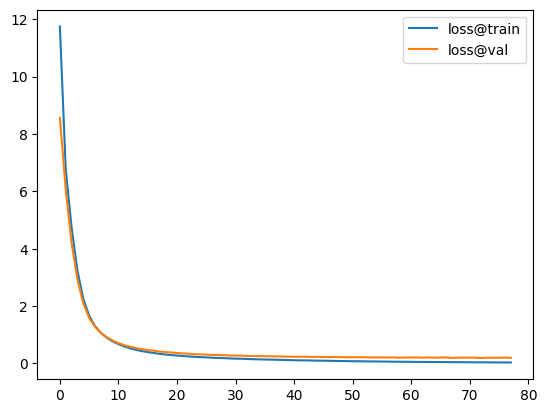

In [ ]:
import tensorflow as tf
model = tf.keras.models.Sequential()
model.add(tf.keras.layers.Input(shape=(8,8, )))
model.add(tf.keras.layers.Flatten())
model.add(tf.keras.layers.Dense(10, activation='softmax'))
tf.keras.utils.plot_model(model, show_layer_activations = True, show_shapes= True)
model.summary()
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy', tf.keras.metrics.AUC(curve='PR', name='aucpr')])

X = data.images
Y = tf.keras.utils.to_categorical(data.target)

from sklearn.model_selection import train_test_split
Xtr, Xt, Ytr, Yt = train_test_split(X, Y, stratify=Y)

es = tf.keras.callbacks.EarlyStopping(monitor='val_loss', mode='min', patience=5, restore_best_weights=True)
hist = model.fit(Xtr, Ytr, validation_split=0.2, shuffle=True, epochs=10000, callbacks=[es])

plt.plot(hist.history['loss'], label='loss@train')
plt.plot(hist.history['val_loss'], label='loss@val')
plt.legend()
plt.show()

Категориальное преобразование

In [ ]:
yprob = model.predict(Xt)
Yp = np.argmax(yprob, axis=-1)
Y0 = np.argmax(Yt, axis=-1)
from sklearn.metrics import classification_report
print(classification_report(Y0, Yp))

15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
              precision    recall  f1-score   support

           0       0.98      1.00      0.99        45
           1       0.93      0.87      0.90        46
           2       0.93      0.98      0.96        44
           3       0.96      0.96      0.96        46
           4       0.98      0.93      0.95        45
           5       0.96      0.98      0.97        46
           6       0.91      0.96      0.93        45
           7       1.00      1.00      1.00        45
           8       0.80      0.86      0.83        43
           9       0.95      0.87      0.91        45

    accuracy                           0.94       450
   macro avg       0.94      0.94      0.94       450
weighted avg       0.94      0.94      0.94       450



Model: "sequential_7"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ flatten_5 (Flatten)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 10)             │           650 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 650 (2.54 KB)

 Trainable params: 650 (2.54 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/10000
34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.0958 - aucpr: 0.0963 - loss: 21.3594 - val_accuracy: 0.1111 - val_aucpr: 0.1111 - val_loss: 11.3983
Epoch 2/10000
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.0936 - aucpr: 0.0977 - loss: 15.3410 - val_accuracy: 0.1852 - val_aucpr: 0.1361 - val_loss: 7.8933
Epoch 3/10000
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.1232 - aucpr: 0.1135 - loss: 11.7930 - val_accuracy: 0.2593 - val_aucpr: 0.1888 - val_loss: 5.8957
Epoch 4/10000
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.1675 - aucpr: 0.1343 - loss: 9.8918 - val_accuracy: 0.3370 - val_aucpr: 0.2726 - val_loss: 4.6077
Epoch 5/10000
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.2218 - aucpr: 0.1806 - loss: 8.0598 - val_accuracy: 0.3963 - val_aucpr: 0.3668 - val_loss: 3.5039
Epoch 6/10000
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.2819 - aucpr: 0.2148 - loss: 6.3384 - val_accuracy: 0.4778 - val_aucpr: 0.4585 - val_loss: 2.7147
Epoch

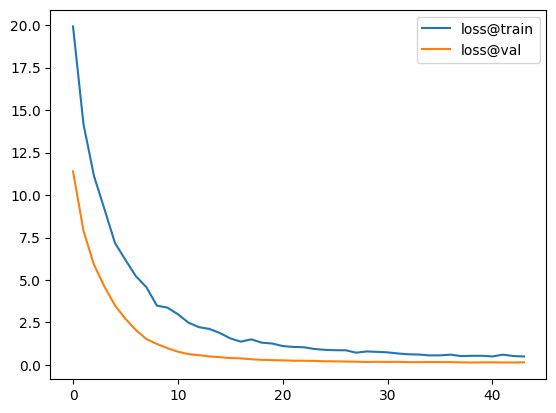

15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
              precision    recall  f1-score   support

           0       0.98      1.00      0.99        45
           1       0.85      0.96      0.90        46
           2       0.98      0.91      0.94        44
           3       0.98      0.96      0.97        46
           4       0.98      0.93      0.95        45
           5       1.00      0.98      0.99        46
           6       1.00      0.98      0.99        45
           7       1.00      0.98      0.99        45
           8       0.93      0.93      0.93        43
           9       0.91      0.96      0.93        45

    accuracy                           0.96       450
   macro avg       0.96      0.96      0.96       450
weighted avg       0.96      0.96      0.96       450



In [ ]:
import tensorflow as tf
model = tf.keras.models.Sequential()
model.add(tf.keras.layers.Input(shape=(8,8, )))
model.add(tf.keras.layers.Flatten())
model.add(tf.keras.layers.Dropout(0.3))
model.add(tf.keras.layers.Dense(10, activation='softmax'))
tf.keras.utils.plot_model(model, show_layer_activations = True, show_shapes= True)
model.summary()
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy', tf.keras.metrics.AUC(curve='PR', name='aucpr')])

X = data.images
Y = tf.keras.utils.to_categorical(data.target)

from sklearn.model_selection import train_test_split
Xtr, Xt, Ytr, Yt = train_test_split(X, Y, stratify=Y)

es = tf.keras.callbacks.EarlyStopping(monitor='val_loss', mode='min', patience=5, restore_best_weights=True)
hist = model.fit(Xtr, Ytr, validation_split=0.2, shuffle=True, epochs=10000, callbacks=[es])

plt.plot(hist.history['loss'], label='loss@train')
plt.plot(hist.history['val_loss'], label='loss@val')
plt.legend()
plt.show()

yprob = model.predict(Xt)
Yp = np.argmax(yprob, axis=-1)
Y0 = np.argmax(Yt, axis=-1)
from sklearn.metrics import classification_report
print(classification_report(Y0, Yp))

Model: "sequential_8"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ flatten_6 (Flatten)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 64)             │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 10)             │           650 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 906 (3.54 KB)

 Trainable params: 778 (3.04 KB)

 Non-trainable params: 128 (512.00 B)

Epoch 1/10000
34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - accuracy: 0.1245 - aucpr: 0.1271 - loss: 2.4862 - val_accuracy: 0.2630 - val_aucpr: 0.2085 - val_loss: 2.8924
Epoch 2/10000
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.3178 - aucpr: 0.2996 - loss: 1.9483 - val_accuracy: 0.4444 - val_aucpr: 0.3956 - val_loss: 1.8476
Epoch 3/10000
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.5296 - aucpr: 0.5565 - loss: 1.4852 - val_accuracy: 0.5778 - val_aucpr: 0.5759 - val_loss: 1.3824
Epoch 4/10000
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.6412 - aucpr: 0.7110 - loss: 1.2046 - val_accuracy: 0.6667 - val_aucpr: 0.7110 - val_loss: 1.1048
Epoch 5/10000
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.7557 - aucpr: 0.8152 - loss: 1.0039 - val_accuracy: 0.7407 - val_aucpr: 0.7938 - val_loss: 0.9239
Epoch 6/10000
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8142 - aucpr: 0.8914 - loss: 0.7984 - val_accuracy: 0.7963 - val_aucpr: 0.8478 - val_loss: 0.7977
Epoch 7/1

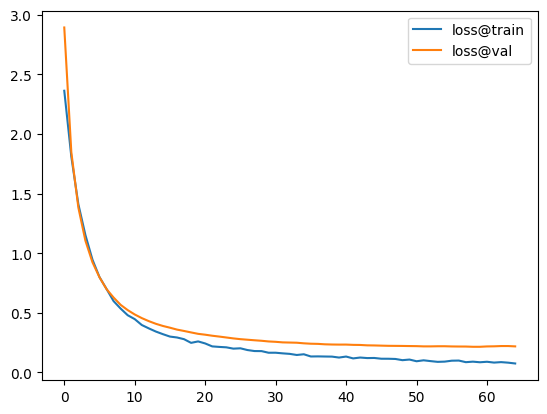

15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
              precision    recall  f1-score   support

           0       0.98      1.00      0.99        45
           1       0.92      0.98      0.95        46
           2       1.00      1.00      1.00        44
           3       0.95      0.89      0.92        46
           4       1.00      0.98      0.99        45
           5       0.98      0.91      0.94        46
           6       0.96      0.98      0.97        45
           7       0.96      1.00      0.98        45
           8       0.86      0.88      0.87        43
           9       0.91      0.89      0.90        45

    accuracy                           0.95       450
   macro avg       0.95      0.95      0.95       450
weighted avg       0.95      0.95      0.95       450



In [ ]:
import tensorflow as tf
model = tf.keras.models.Sequential()
model.add(tf.keras.layers.Input(shape=(8,8, )))
model.add(tf.keras.layers.Flatten())
model.add(tf.keras.layers.BatchNormalization())
model.add(tf.keras.layers.Dense(10, activation='softmax'))
tf.keras.utils.plot_model(model, show_layer_activations = True, show_shapes= True)
model.summary()
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy', tf.keras.metrics.AUC(curve='PR', name='aucpr')])

X = data.images
Y = tf.keras.utils.to_categorical(data.target)

from sklearn.model_selection import train_test_split
Xtr, Xt, Ytr, Yt = train_test_split(X, Y, stratify=Y)

es = tf.keras.callbacks.EarlyStopping(monitor='val_loss', mode='min', patience=5, restore_best_weights=True)
hist = model.fit(Xtr, Ytr, validation_split=0.2, shuffle=True, epochs=10000, callbacks=[es])

plt.plot(hist.history['loss'], label='loss@train')
plt.plot(hist.history['val_loss'], label='loss@val')
plt.legend()
plt.show()

yprob = model.predict(Xt)
Yp = np.argmax(yprob, axis=-1)
Y0 = np.argmax(Yt, axis=-1)
from sklearn.metrics import classification_report
print(classification_report(Y0, Yp))

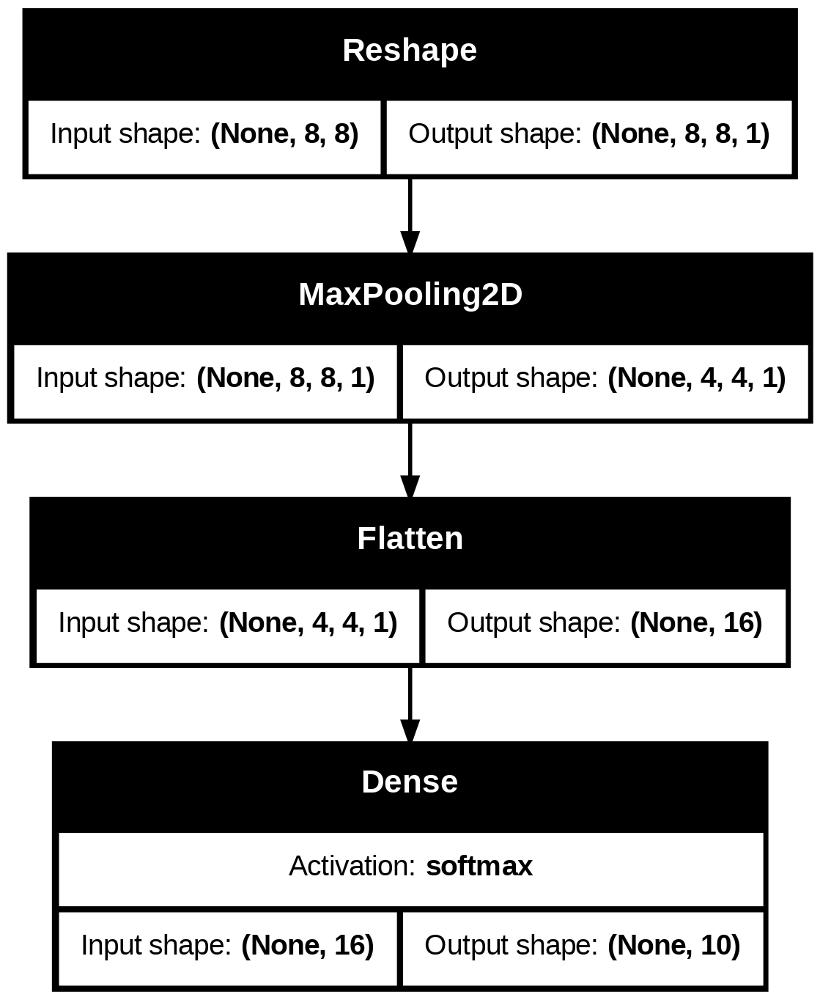

In [ ]:
import tensorflow as tf
model = tf.keras.models.Sequential()
model.add(tf.keras.layers.Input(shape=(8,8, )))
model.add(tf.keras.layers.Reshape((8,8,1, )))
model.add(tf.keras.layers.MaxPool2D(2))
model.add(tf.keras.layers.Flatten())
model.add(tf.keras.layers.Dense(10, activation='softmax'))
tf.keras.utils.plot_model(model, show_layer_activations = True, show_shapes= True)





In [ ]:
model.summary()

Model: "sequential_13"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ reshape_2 (Reshape)             │ (None, 8, 8, 1)        │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 4, 4, 1)        │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_9 (Flatten)             │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_9 (Dense)                 │ (None, 10)             │           170 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 170 (680.00 B)

 Trainable params: 170 (680.00 B)

 Non-trainable params: 0 (0.00 B)

In [ ]:
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy', tf.keras.metrics.AUC(curve='PR', name='aucpr')])

X = data.images
Y = tf.keras.utils.to_categorical(data.target)
from sklearn.model_selection import train_test_split
Xtr, Xt, Ytr, Yt = train_test_split(X, Y, stratify=Y)

es = tf.keras.callbacks.EarlyStopping(monitor='val_loss', mode='min', patience=5, restore_best_weights=True)
hist = model.fit(Xtr, Ytr, validation_split=0.2, shuffle=True, epochs=10000, callbacks=[es])

plt.plot(hist.history['loss'], label='loss@train')
plt.plot(hist.history['val_loss'], label='loss@val')
plt.legend()
plt.show()

yprob = model.predict(Xt)
Yp = np.argmax(yprob, axis=-1)
Y0 = np.argmax(Yt, axis=-1)
from sklearn.metrics import classification_report
print(classification_report(Y0, Yp))

Блоки свертки

In [ ]:
!pip install tensorflow

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 620.7/620.7 MB 781.3 kB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.5/57.5 kB 6.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.5/24.5 MB 106.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 153.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.6/6.6 MB 141.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 224.5/224.5 kB 22.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 72.5/72.5 kB 7.9 MB/s eta 0:00:00


In [ ]:
!pip install pydot

In [ ]:
import tensorflow as tf
import matplotlib.pyplot as plt
import tensorflow.keras as keras
import numpy as np

(x_all,y_all),(x_test,y_test) = tf.keras.datasets.mnist.load_data()
x_train = tf.expand_dims(x_all, axis=3, name=None)
x_test = tf.expand_dims(x_test, axis=3, name=None)

print(x_train.shape)

(60000, 28, 28, 1)


In [ ]:
from sklearn.metrics import confusion_matrix
model = tf.keras.models.Sequential()
model.add(tf.keras.layers.InputLayer(input_shape=(28,28,1)))
model.add(tf.keras.layers.Conv2D(8, 3, activation='tanh'))
model.add(tf.keras.layers.Conv2D(16, 3, activation='tanh'))
model.add(tf.keras.layers.Conv2D(32, 3, activation='tanh'))
model.add(tf.keras.layers.Flatten())
model.add(tf.keras.layers.Dense(10, activation='softmax'))
model.summary()

mymetric = tf.keras.metrics.AUC(curve='PR', name='aucpr')
model.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy', mymetric])

model.summary()

y_all_c = tf.keras.utils.to_categorical(y_all)
y_test_c = tf.keras.utils.to_categorical(y_test)

es = tf.keras.callbacks.EarlyStopping(monitor='val_loss',
                                      mode='min', patience=3, restore_best_weights=True)

model.fit(x_train, y_all_c, validation_split=0.2,
          callbacks=[es], epochs=1000)

model.evaluate(x_test, y_test_c)

y_pred = model.predict(x_test)
y_pred = y_pred.argmax(axis=1)
print(confusion_matrix(y_test, y_pred))

/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/input_layer.py:27: UserWarning: Argument `input_shape` is deprecated. Use `shape` instead.
  warnings.warn(


Model: "sequential_7"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_21 (Conv2D)              │ (None, 26, 26, 8)      │            80 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_22 (Conv2D)              │ (None, 24, 24, 16)     │         1,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_23 (Conv2D)              │ (None, 22, 22, 32)     │         4,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_7 (Flatten)             │ (None, 15488)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 10)             │       154,890 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 160,778 (628.04 KB)

 Trainable params: 160,778 (628.04 KB)

 Non-trainable params: 0 (0.00 B)

Model: "sequential_7"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_21 (Conv2D)              │ (None, 26, 26, 8)      │            80 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_22 (Conv2D)              │ (None, 24, 24, 16)     │         1,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_23 (Conv2D)              │ (None, 22, 22, 32)     │         4,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_7 (Flatten)             │ (None, 15488)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 10)             │       154,890 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 160,778 (628.04 KB)

 Trainable params: 160,778 (628.04 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/1000
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 21s 14ms/step - accuracy: 0.9046 - aucpr: 0.9569 - loss: 0.3132 - val_accuracy: 0.9662 - val_aucpr: 0.9897 - val_loss: 0.1245
Epoch 2/1000
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 20s 13ms/step - accuracy: 0.9722 - aucpr: 0.9922 - loss: 0.0970 - val_accuracy: 0.9715 - val_aucpr: 0.9890 - val_loss: 0.1288
Epoch 3/1000
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 22s 15ms/step - accuracy: 0.9759 - aucpr: 0.9942 - loss: 0.0765 - val_accuracy: 0.9696 - val_aucpr: 0.9864 - val_loss: 0.1386
Epoch 4/1000
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 20s 14ms/step - accuracy: 0.9795 - aucpr: 0.9945 - loss: 0.0698 - val_accuracy: 0.9742 - val_aucpr: 0.9867 - val_loss: 0.1326
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9613 - aucpr: 0.9882 - loss: 0.1359
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
[[ 972    1    1    0    0    0    6    0    0    0]
 [   0 1121    3    2    0    0    4    0    5    0]
 [   2    7  994    1    1    0    4    5   17    1]
 [   1    0   10  981    1   

Компьютерная лингвистика и анализ естественного языка

In [ ]:
import re
f = open('text.txt')
text = f.read()
pattern = r'[\!\?\.]+\s+'
res = re.findall(pattern, text, re.IGNORECASE | re.MULTILINE)
print(len(res))

9271


03.11.2025

Мешок слов

In [ ]:
import re
f=open('text.txt')
s=f.read()
wa=re.split(r'[\W]+',s)
idx=0
D,I={},{}
for w in wa:
    if w not in D:
        D[w]=idx
        I[idx]=w
        idx+=1
print(idx-1,I[idx-1])

import numpy as np
k=0
for ch in s.split('CHAPTER '):
    vec=np.zeros(idx)
    words=re.split(r'[\W]+',ch)
    for w in words:
        vec[D[w]]+=1
    if k == 200:
      for i in vec:
        print(i)
    k+=1

19382 
4.0
0.0
0.0
0.0
37.0
1.0
1.0
0.0
0.0
1.0
0.0
1.0
11.0
106.0
0.0
0.0
0.0
31.0
0.0
0.0
47.0
2.0
1.0
0.0
0.0
11.0
4.0
0.0
10.0
3.0
0.0
0.0
1.0
1.0
0.0
16.0
0.0
1.0
7.0
0.0
1.0
0.0
0.0
0.0
10.0
0.0
0.0
0.0
0.0
0.0
2.0
1.0
5.0
0.0
0.0
3.0
28.0
0.0
0.0
0.0
1.0
8.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
1.0
0.0
0.0
0.0
0.0
9.0
26.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
1.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
5.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
2.0
0.0
0.0
1.0
1.0
1.0
1.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0

Всего уникальных слов: 19382
Последнее слово в словаре: newsletter

=== Количество слов в главах ===
Глава 0: 154 слов
Глава 1: 2 слов
Глава 2: 4 слов
Глава 3: 4 слов
Глава 4: 3 слов
Глава 5: 2 слов
Глава 6: 3 слов
Глава 7: 3 слов
Глава 8: 3 слов
Глава 9: 3 слов
Глава 10: 4 слов
Глава 11: 2 слов
Глава 12: 2 слов
Глава 13: 2 слов
Глава 14: 2 слов
Глава 15: 2 слов
Глава 16: 3 слов
Глава 17: 3 слов
Глава 18: 3 слов
Глава 19: 3 слов
Глава 20: 3 слов
Глава 21: 3 слов
Глава 22: 3 слов
Глава 23: 4 слов
Глава 24: 3 слов
Глава 25: 2 слов
Глава 26: 4 слов
Глава 27: 4 слов
Глава 28: 2 слов
Глава 29: 6 слов
Глава 30: 3 слов
Глава 31: 3 слов
Глава 32: 2 слов
Глава 33: 3 слов
Глава 34: 4 слов
Глава 35: 4 слов
Глава 36: 4 слов
Глава 37: 2 слов
Глава 38: 2 слов
Глава 39: 4 слов
Глава 40: 3 слов
Глава 41: 3 слов
Глава 42: 6 слов
Глава 43: 2 слов
Глава 44: 3 слов
Глава 45: 3 слов
Глава 46: 2 слов
Глава 47: 4 слов
Глава 48: 4 слов
Глава 49: 3 слов
Глава 50: 7 слов
Глава 51: 4 слов
Глава 52: 3 слов
Глава 

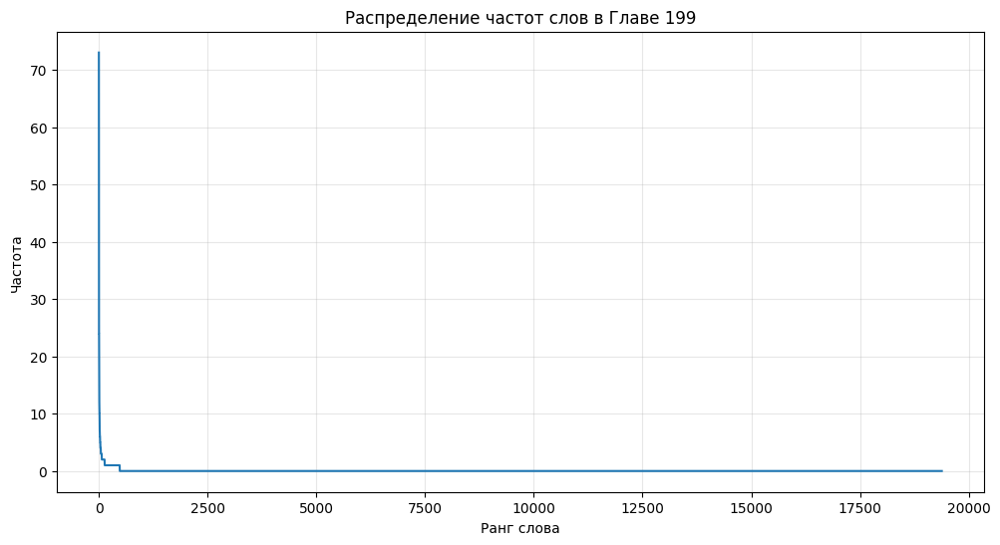

Топ-10 самых частых слов в главе 199:
1. 'the': 73 раз
2. 'of': 37 раз
3. 'in': 29 раз
4. 'a': 24 раз
5. 'and': 24 раз
6. 'to': 23 раз
7. 'that': 20 раз
8. 'it': 16 раз
9. 'his': 14 раз
10. 'with': 13 раз


In [ ]:
import re
import numpy as np
import matplotlib.pyplot as plt

# Чтение файла с правильной кодировкой
with open('text.txt', 'r', encoding='utf-8') as f:
    s = f.read()

# Разделение на слова (улучшенная версия)
wa = re.findall(r'\b\w+\b', s)  # лучше чем split, избегает пустых строк

idx = 0
D, I = {}, {}
for w in wa:
    if w not in D:
        D[w] = idx
        I[idx] = w
        idx += 1

print(f"Всего уникальных слов: {idx}")
print(f"Последнее слово в словаре: {I[idx-1]}")

# Анализ частот по главам
print("\n=== Количество слов в главах ===")
k = 0
res = None
chapters = s.split('CHAPTER ')

for ch in chapters:
    if not ch.strip():  # пропускаем пустые главы
        continue

    vec = np.zeros(idx)
    words = re.findall(r'\b\w+\b', ch)  # улучшенное разделение

    for w in words:
        if w in D:  # проверка на существование в словаре
            vec[D[w]] += 1

    total_words = vec.sum()
    print(f"Глава {k}: {int(total_words)} слов")

    if k == 200:
        res = vec
    k += 1

# Самые частые слова по главам
print("\n=== Самое частое слово в каждой главе ===")
k = 0
for ch in chapters:
    if not ch.strip():
        continue

    vec = np.zeros(idx)
    words = re.findall(r'\b\w+\b', ch)

    for w in words:
        if w in D:
            vec[D[w]] += 1

    if vec.sum() > 0:  # только для непустых глав
        widx = np.argmax(vec)
        print(f"Глава {k}: '{I[widx]}' (встречается {int(vec[widx])} раз)")
    k += 1

# Визуализация распределения частот для главы 199
print("\n=== Визуализация распределения частот (Глава 199) ===")
k = 0
for ch in chapters:
    if not ch.strip():
        continue

    vec = np.zeros(idx)
    words = re.findall(r'\b\w+\b', ch)

    for w in words:
        if w in D:
            vec[D[w]] += 1

    if k == 199:
        # Сортируем частоты по убыванию
        sorted_indices = np.argsort(vec)
        sorted_frequencies = vec[sorted_indices][::-1]

        # Строим график
        plt.figure(figsize=(12, 6))
        plt.plot(sorted_frequencies)
        plt.title('Распределение частот слов в Главе 199')
        plt.xlabel('Ранг слова')
        plt.ylabel('Частота')
        plt.grid(True, alpha=0.3)
        plt.show()

        # Дополнительная информация
        top_words_indices = np.argsort(vec)[-10:][::-1]  # топ-10 слов
        print("Топ-10 самых частых слов в главе 199:")
        for i, word_idx in enumerate(top_words_indices):
            print(f"{i+1}. '{I[word_idx]}': {int(vec[word_idx])} раз")
        break

    k += 1

Всего уникальных слов: 19382
Последнее слово в словаре: newsletter

=== Количество слов в главах ===
Глава 0: 154 слов
Глава 1: 2 слов
Глава 2: 4 слов
Глава 3: 4 слов
Глава 4: 3 слов
Глава 5: 2 слов
Глава 6: 3 слов
Глава 7: 3 слов
Глава 8: 3 слов
Глава 9: 3 слов
Глава 10: 4 слов
Глава 11: 2 слов
Глава 12: 2 слов
Глава 13: 2 слов
Глава 14: 2 слов
Глава 15: 2 слов
Глава 16: 3 слов
Глава 17: 3 слов
Глава 18: 3 слов
Глава 19: 3 слов
Глава 20: 3 слов
Глава 21: 3 слов
Глава 22: 3 слов
Глава 23: 4 слов
Глава 24: 3 слов
Глава 25: 2 слов
Глава 26: 4 слов
Глава 27: 4 слов
Глава 28: 2 слов
Глава 29: 6 слов
Глава 30: 3 слов
Глава 31: 3 слов
Глава 32: 2 слов
Глава 33: 3 слов
Глава 34: 4 слов
Глава 35: 4 слов
Глава 36: 4 слов
Глава 37: 2 слов
Глава 38: 2 слов
Глава 39: 4 слов
Глава 40: 3 слов
Глава 41: 3 слов
Глава 42: 6 слов
Глава 43: 2 слов
Глава 44: 3 слов
Глава 45: 3 слов
Глава 46: 2 слов
Глава 47: 4 слов
Глава 48: 4 слов
Глава 49: 3 слов
Глава 50: 7 слов
Глава 51: 4 слов
Глава 52: 3 слов
Глава 

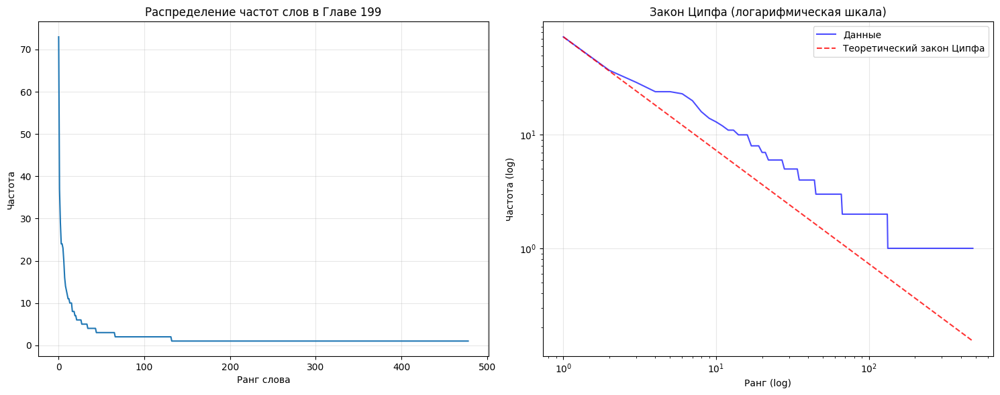

Топ-10 самых частых слов в главе 199:
1. 'the': 73 раз
2. 'of': 37 раз
3. 'in': 29 раз
4. 'a': 24 раз
5. 'and': 24 раз
6. 'to': 23 раз
7. 'that': 20 раз
8. 'it': 16 раз
9. 'his': 14 раз
10. 'with': 13 раз

Проверка закона Ципфа (ранг × частота ≈ const):
Ранг 1: 73.0 × 1 = 73.0
Ранг 2: 37.0 × 2 = 74.0
Ранг 3: 29.0 × 3 = 87.0
Ранг 4: 24.0 × 4 = 96.0
Ранг 5: 24.0 × 5 = 120.0
Ранг 6: 23.0 × 6 = 138.0
Ранг 7: 20.0 × 7 = 140.0
Ранг 8: 16.0 × 8 = 128.0
Ранг 9: 14.0 × 9 = 126.0
Ранг 10: 13.0 × 10 = 130.0

=== Закон Ципфа для всего текста ===


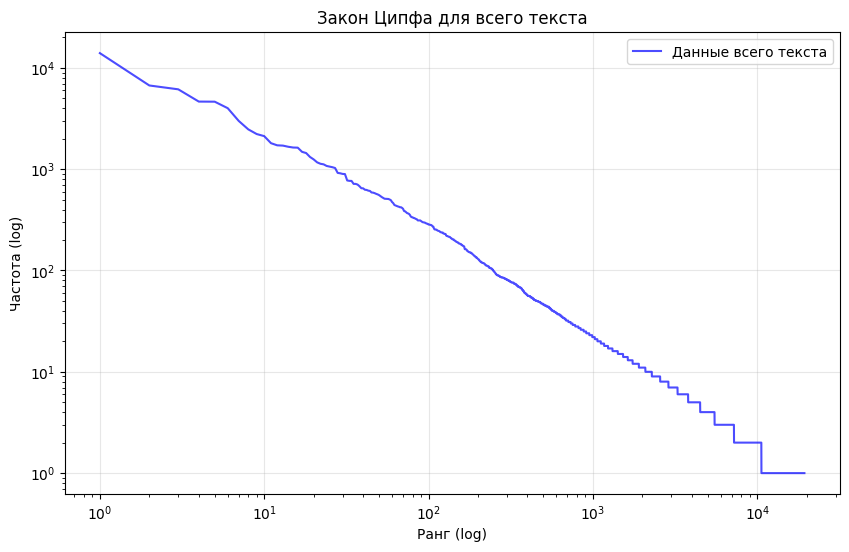

Всего уникальных слов в тексте: 19382
Самое частое слово: 'the' (13983 раз)


In [ ]:
import re
import numpy as np
import matplotlib.pyplot as plt


with open('text.txt', 'r', encoding='utf-8') as f:
    s = f.read()

wa = re.findall(r'\b\w+\b', s)
idx = 0
D, I = {}, {}
for w in wa:
    if w not in D:
        D[w] = idx
        I[idx] = w
        idx += 1

print(f"Всего уникальных слов: {idx}")
print(f"Последнее слово в словаре: {I[idx-1]}")

print("\n=== Количество слов в главах ===")
k = 0
res = None
chapters = s.split('CHAPTER ')

for ch in chapters:
    if not ch.strip():
        continue

    vec = np.zeros(idx)
    words = re.findall(r'\b\w+\b', ch)

    for w in words:
        if w in D:
            vec[D[w]] += 1

    total_words = vec.sum()
    print(f"Глава {k}: {int(total_words)} слов")

    if k == 200:
        res = vec
    k += 1

print("\n=== Самое частое слово в каждой главе ===")
k = 0
for ch in chapters:
    if not ch.strip():
        continue

    vec = np.zeros(idx)
    words = re.findall(r'\b\w+\b', ch)

    for w in words:
        if w in D:
            vec[D[w]] += 1

    if vec.sum() > 0:
        widx = np.argmax(vec)
        print(f"Глава {k}: '{I[widx]}' (встречается {int(vec[widx])} раз)")
    k += 1

print("\n=== Визуализация распределения частот (Глава 199) и закон Ципфа ===")
k = 0
for ch in chapters:
    if not ch.strip():
        continue

    vec = np.zeros(idx)
    words = re.findall(r'\b\w+\b', ch)

    for w in words:
        if w in D:
            vec[D[w]] += 1

    if k == 199:
        sorted_indices = np.argsort(vec)[::-1]
        sorted_frequencies = vec[sorted_indices]

        non_zero_freq = sorted_frequencies[sorted_frequencies > 0]

        ranks = np.arange(1, len(non_zero_freq) + 1)

        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))

        ax1.plot(non_zero_freq)
        ax1.set_title('Распределение частот слов в Главе 199')
        ax1.set_xlabel('Ранг слова')
        ax1.set_ylabel('Частота')
        ax1.grid(True, alpha=0.3)

        ax2.loglog(ranks, non_zero_freq, 'b-', alpha=0.7, label='Данные')
        ax2.set_title('Закон Ципфа (логарифмическая шкала)')
        ax2.set_xlabel('Ранг (log)')
        ax2.set_ylabel('Частота (log)')
        ax2.grid(True, alpha=0.3)

        max_freq = non_zero_freq[0]
        zipf_law = max_freq / ranks
        ax2.legend()

        plt.tight_layout()
        plt.show()

        top_words_indices = sorted_indices[:10]  # топ-10 слов
        print("Топ-10 самых частых слов в главе 199:")
        for i, word_idx in enumerate(top_words_indices):
            print(f"{i+1}. '{I[word_idx]}': {int(vec[word_idx])} раз")

        print("\nПроверка закона Ципфа (ранг × частота ≈ const):")
        for i in range(min(10, len(non_zero_freq))):
            rank = i + 1
            frequency = non_zero_freq[i]
            product = rank * frequency
            print(f"Ранг {rank}: {frequency} × {rank} = {product:.1f}")

        break

    k += 1

print("\n=== Закон Ципфа для всего текста ===")
total_vec = np.zeros(idx)
for w in wa:
    if w in D:
        total_vec[D[w]] += 1
total_sorted_indices = np.argsort(total_vec)[::-1]
total_sorted_freq = total_vec[total_sorted_indices]
non_zero_total = total_sorted_freq[total_sorted_freq > 0]

total_ranks = np.arange(1, len(non_zero_total) + 1)

plt.figure(figsize=(10, 6))
plt.loglog(total_ranks, non_zero_total, 'b-', alpha=0.7, label='Данные всего текста')
plt.title('Закон Ципфа для всего текста')
plt.xlabel('Ранг (log)')
plt.ylabel('Частота (log)')
plt.grid(True, alpha=0.3)
plt.legend()
plt.show()

print(f"Всего уникальных слов в тексте: {len(non_zero_total)}")
print(f"Самое частое слово: '{I[total_sorted_indices[0]]}' ({int(non_zero_total[0])} раз)")

Всего уникальных слов: 19382
Последнее слово в словаре: newsletter

=== Количество слов в главах ===
Глава 0: 154 слов
Глава 1: 2 слов
Глава 2: 4 слов
Глава 3: 4 слов
Глава 4: 3 слов
Глава 5: 2 слов
Глава 6: 3 слов
Глава 7: 3 слов
Глава 8: 3 слов
Глава 9: 3 слов
Глава 10: 4 слов
Глава 11: 2 слов
Глава 12: 2 слов
Глава 13: 2 слов
Глава 14: 2 слов
Глава 15: 2 слов
Глава 16: 3 слов
Глава 17: 3 слов
Глава 18: 3 слов
Глава 19: 3 слов
Глава 20: 3 слов
Глава 21: 3 слов
Глава 22: 3 слов
Глава 23: 4 слов
Глава 24: 3 слов
Глава 25: 2 слов
Глава 26: 4 слов
Глава 27: 4 слов
Глава 28: 2 слов
Глава 29: 6 слов
Глава 30: 3 слов
Глава 31: 3 слов
Глава 32: 2 слов
Глава 33: 3 слов
Глава 34: 4 слов
Глава 35: 4 слов
Глава 36: 4 слов
Глава 37: 2 слов
Глава 38: 2 слов
Глава 39: 4 слов
Глава 40: 3 слов
Глава 41: 3 слов
Глава 42: 6 слов
Глава 43: 2 слов
Глава 44: 3 слов
Глава 45: 3 слов
Глава 46: 2 слов
Глава 47: 4 слов
Глава 48: 4 слов
Глава 49: 3 слов
Глава 50: 7 слов
Глава 51: 4 слов
Глава 52: 3 слов
Глава 

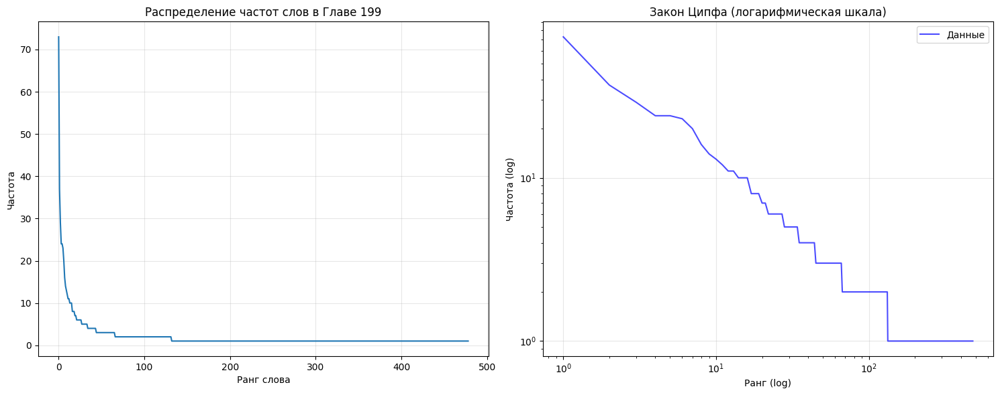

Топ-10 самых частых слов в главе 199:
1. 'the': 73 раз
2. 'of': 37 раз
3. 'in': 29 раз
4. 'a': 24 раз
5. 'and': 24 раз
6. 'to': 23 раз
7. 'that': 20 раз
8. 'it': 16 раз
9. 'his': 14 раз
10. 'with': 13 раз

Проверка закона Ципфа (ранг × частота ≈ const):
Ранг 1: 73.0 × 1 = 73.0
Ранг 2: 37.0 × 2 = 74.0
Ранг 3: 29.0 × 3 = 87.0
Ранг 4: 24.0 × 4 = 96.0
Ранг 5: 24.0 × 5 = 120.0
Ранг 6: 23.0 × 6 = 138.0
Ранг 7: 20.0 × 7 = 140.0
Ранг 8: 16.0 × 8 = 128.0
Ранг 9: 14.0 × 9 = 126.0
Ранг 10: 13.0 × 10 = 130.0

=== Закон Ципфа для всего текста ===


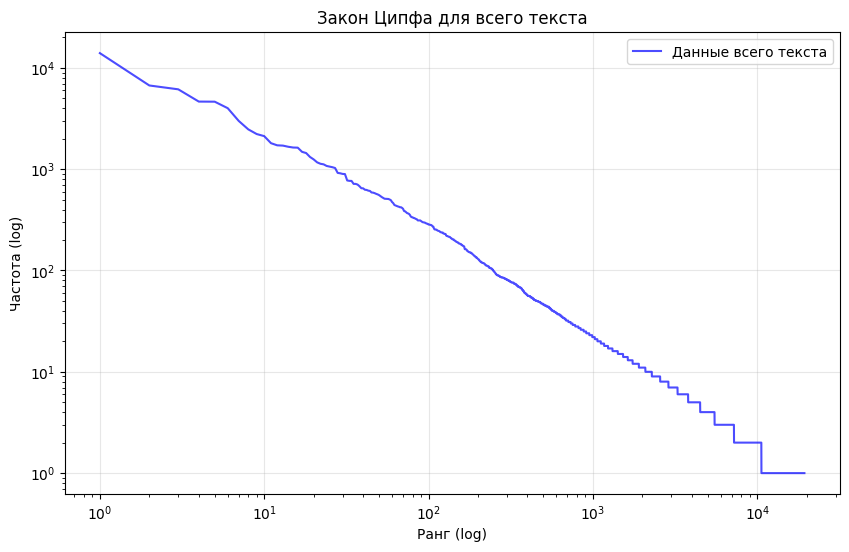

Всего уникальных слов в тексте: 19382
Самое частое слово: 'the' (13983 раз)


In [ ]:
import re
import numpy as np
import matplotlib.pyplot as plt


with open('text.txt', 'r', encoding='utf-8') as f:
    s = f.read()

wa = re.findall(r'\b\w+\b', s)
idx = 0
D, I = {}, {}
for w in wa:
    if w not in D:
        D[w] = idx
        I[idx] = w
        idx += 1

print(f"Всего уникальных слов: {idx}")
print(f"Последнее слово в словаре: {I[idx-1]}")

print("\n=== Количество слов в главах ===")
k = 0
res = None
chapters = s.split('CHAPTER ')

for ch in chapters:
    if not ch.strip():
        continue

    vec = np.zeros(idx)
    words = re.findall(r'\b\w+\b', ch)

    for w in words:
        if w in D:
            vec[D[w]] += 1

    total_words = vec.sum()
    print(f"Глава {k}: {int(total_words)} слов")

    if k == 200:
        res = vec
    k += 1

print("\n=== Самое частое слово в каждой главе ===")
k = 0
for ch in chapters:
    if not ch.strip():
        continue

    vec = np.zeros(idx)
    words = re.findall(r'\b\w+\b', ch)

    for w in words:
        if w in D:
            vec[D[w]] += 1

    if vec.sum() > 0:
        widx = np.argmax(vec)
        print(f"Глава {k}: '{I[widx]}' (встречается {int(vec[widx])} раз)")
    k += 1

# ДОБАВЛЕНО: Расчет и печать TF вектора для главы 199
print("\n=== TF (Term Frequency) вектор для главы 199 ===")
k = 0
for ch in chapters:
    if not ch.strip():
        continue

    if k == 199:
        vec = np.zeros(idx)
        words = re.findall(r'\b\w+\b', ch)

        for w in words:
            if w in D:
                vec[D[w]] += 1

        # Расчет TF (частоты слов)
        total_words_in_chapter = len(words)
        tf_vector = vec / total_words_in_chapter  # Нормализация по общему количеству слов

        print(f"Длина TF вектора: {len(tf_vector)}")
        print(f"Общее количество слов в главе: {total_words_in_chapter}")
        print(f"Размерность вектора: {tf_vector.shape}")

        # Печатаем TF для топ-20 слов
        print("\nTF для топ-20 слов в главе 199:")
        sorted_indices_tf = np.argsort(tf_vector)[::-1]
        for i in range(min(20, len(sorted_indices_tf))):
            word_idx = sorted_indices_tf[i]
            if tf_vector[word_idx] > 0:
                print(f"'{I[word_idx]}': TF = {tf_vector[word_idx]:.6f} (частота: {int(vec[word_idx])})")

        # Печатаем первые 50 элементов TF вектора
        print(f"\nПервые 50 элементов TF вектора:")
        for i in range(min(50, len(tf_vector))):
            if tf_vector[i] > 0:
                print(f"Индекс {i} ('{I[i]}'): TF = {tf_vector[i]:.6f}")

        # Также можно распечатать весь вектор (будет много данных)
        print(f"\nПолный TF вектор (первые 100 элементов):")
        print("[" + ", ".join(f"{tf:.4f}" for tf in tf_vector[:100]) + ", ...]")

        break
    k += 1

print("\n=== Визуализация распределения частот (Глава 199) и закон Ципфа ===")
k = 0
for ch in chapters:
    if not ch.strip():
        continue

    vec = np.zeros(idx)
    words = re.findall(r'\b\w+\b', ch)

    for w in words:
        if w in D:
            vec[D[w]] += 1

    if k == 199:
        sorted_indices = np.argsort(vec)[::-1]
        sorted_frequencies = vec[sorted_indices]

        non_zero_freq = sorted_frequencies[sorted_frequencies > 0]

        ranks = np.arange(1, len(non_zero_freq) + 1)

        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))

        ax1.plot(non_zero_freq)
        ax1.set_title('Распределение частот слов в Главе 199')
        ax1.set_xlabel('Ранг слова')
        ax1.set_ylabel('Частота')
        ax1.grid(True, alpha=0.3)

        ax2.loglog(ranks, non_zero_freq, 'b-', alpha=0.7, label='Данные')
        ax2.set_title('Закон Ципфа (логарифмическая шкала)')
        ax2.set_xlabel('Ранг (log)')
        ax2.set_ylabel('Частота (log)')
        ax2.grid(True, alpha=0.3)

        max_freq = non_zero_freq[0]
        zipf_law = max_freq / ranks
        ax2.legend()

        plt.tight_layout()
        plt.show()

        top_words_indices = sorted_indices[:10]  # топ-10 слов
        print("Топ-10 самых частых слов в главе 199:")
        for i, word_idx in enumerate(top_words_indices):
            print(f"{i+1}. '{I[word_idx]}': {int(vec[word_idx])} раз")

        print("\nПроверка закона Ципфа (ранг × частота ≈ const):")
        for i in range(min(10, len(non_zero_freq))):
            rank = i + 1
            frequency = non_zero_freq[i]
            product = rank * frequency
            print(f"Ранг {rank}: {frequency} × {rank} = {product:.1f}")

        break

    k += 1

print("\n=== Закон Ципфа для всего текста ===")
total_vec = np.zeros(idx)
for w in wa:
    if w in D:
        total_vec[D[w]] += 1
total_sorted_indices = np.argsort(total_vec)[::-1]
total_sorted_freq = total_vec[total_sorted_indices]
non_zero_total = total_sorted_freq[total_sorted_freq > 0]

total_ranks = np.arange(1, len(non_zero_total) + 1)

plt.figure(figsize=(10, 6))
plt.loglog(total_ranks, non_zero_total, 'b-', alpha=0.7, label='Данные всего текста')
plt.title('Закон Ципфа для всего текста')
plt.xlabel('Ранг (log)')
plt.ylabel('Частота (log)')
plt.grid(True, alpha=0.3)
plt.legend()
plt.show()

print(f"Всего уникальных слов в тексте: {len(non_zero_total)}")
print(f"Самое частое слово: '{I[total_sorted_indices[0]]}' ({int(non_zero_total[0])} раз)")

In [ ]:
import nltk
nltk.download('punkt_tab')

[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt_tab.zip.


True

In [ ]:
import io
import numpy
f = open("text.txt", encoding="utf-8")
import re
txt=f.read()
STATS=[]

mydict=dict()
total_dict=dict()
dicts=[]
while txt:
 tokenize_regex = re.compile(r'(?:CHAPTER)', re.I)
 sents = tokenize_regex.split(txt)
 for s in sents:
  tokens = nltk.word_tokenize(s)
  z=0
  for word in tokens:
   if(not word.lower() in mydict):
    mydict[word.lower()]=1;
   else:
    mydict[word.lower()]+=1;
   z+=1
   total_dict[word.lower()]=1;
  for key,val in mydict.items():
   mydict[key]/=z
  dicts.append(mydict)
  mydict=dict()
 txt=f.read()
weight_max=len(dicts)
DF = dict()
for key, valk in total_dict.items():
  weight = 0
  for d

In [ ]:
for d in dicts:
  max1 = 0
  max1pos = -1
  for key, value in d.items():
    d[key]=numpy.log(d[key]+1)/DF[key]
    if d[key] > max1:
      max1 = d[key]
      max1pos = key
    print(max)

08.11.2025

In [ ]:
from sklearn.datasets import fetch_20newsgroups
train = fetch_20newsgroups(subset='test')
print(train.data[:10])
print(train.target[:10])
print(train.target_names[:10])

['From: v064mb9k@ubvmsd.cc.buffalo.edu (NEIL B. GANDLER)\nSubject: Need info on 88-89 Bonneville\nOrganization: University at Buffalo\nLines: 10\nNews-Software: VAX/VMS VNEWS 1.41\nNntp-Posting-Host: ubvmsd.cc.buffalo.edu\n\n\n I am a little confused on all of the models of the 88-89 bonnevilles.\nI have heard of the LE SE LSE SSE SSEI. Could someone tell me the\ndifferences are far as features or performance. I am also curious to\nknow what the book value is for prefereably the 89 model. And how much\nless than book value can you usually get them for. In other words how\nmuch are they in demand this time of year. I have heard that the mid-spring\nearly summer is the best time to buy.\n\n\t\t\tNeil Gandler\n', 'From: Rick Miller <rick@ee.uwm.edu>\nSubject: X-Face?\nOrganization: Just me.\nLines: 17\nDistribution: world\nNNTP-Posting-Host: 129.89.2.33\nSummary: Go ahead... swamp me.  <EEP!>\n\nI\'m not familiar at all with the format of these "X-Face:" thingies, but\nafter seeing them i

In [ ]:
print(len(set(train.target)))

20


In [ ]:
import numpy as np
print(np.unique(train.target_names).shape[0])
print(np.array(train.data).shape[0])

20
7532


TFIDF

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer
vectorizer = CountVectorizer()
vectors = vectorizer.fit_transform(train.data)
print(vectors.shape)

(7532, 93564)


In [ ]:
import tensorflow as tf
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.model_selection import train_test_split
vectorizer = TfidfVectorizer()
vectors = vectorizer.fit_transform(train.data)
Y = tf.keras.utils.to_categorical(train.target)
dim = 19
Xtr, Xval, Ytr, Yval = train_test_split(vectors, Y)

In [ ]:
model = tf.keras.models.Sequential()
model.add(tf.keras.layers.Input(shape=(Xtr.shape[1], )))
model.add(tf.keras.layers.Dense(300, activation='relu'))
model.add(tf.keras.layers.Dense(dim+1, activation='softmax'))
tf.keras.utils.plot_model(model, show_shapes=True, show_layer_activations=True)
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
es = tf.keras.callbacks.EarlyStopping(monitor='val_loss', mode='min', patience=3, restore_best_weights=True)
model.fit(Xtr, Ytr, epochs=1000, validation_split=0.2, callbacks=[es])
model.evaluate(Xval, Yval)

Epoch 1/1000
142/142 ━━━━━━━━━━━━━━━━━━━━ 116s 799ms/step - accuracy: 0.4476 - loss: 2.6816 - val_accuracy: 0.8735 - val_loss: 1.2034
Epoch 2/1000
142/142 ━━━━━━━━━━━━━━━━━━━━ 111s 585ms/step - accuracy: 0.9771 - loss: 0.5589 - val_accuracy: 0.9053 - val_loss: 0.5741
Epoch 3/1000
142/142 ━━━━━━━━━━━━━━━━━━━━ 135s 533ms/step - accuracy: 0.9983 - loss: 0.0811 - val_accuracy: 0.9097 - val_loss: 0.4829
Epoch 4/1000
 57/142 ━━━━━━━━━━━━━━━━━━━━ 46s 549ms/step - accuracy: 1.0000 - loss: 0.0278

KeyboardInterrupt: 

15.11.2025

V-gram

In [ ]:
import re
text = "Мама мыла раму"
cloud = []
for i in range(len(text) - 1):
  cloud.append(text[i]+text[i+1])
print(cloud)

['Ма', 'ам', 'ма', 'а ', ' м', 'мы', 'ыл', 'ла', 'а ', ' р', 'ра', 'ам', 'му']


In [ ]:
def general_ngrams(text, n=2):
  chars=list(text)
  cloud = []
  for i in range(len(chars) - n + 1):
    cloud.append(''.join(chars[i:i+n]))
  return cloud
d={}
f=open("2701.txt")
for s in f:
  res = general_ngrams(s, 3)
  for e in res:
    if not e in d:
      d[e]=0
    d[e]+=1
d2=sorted(d.items(), key=lambda x: x[1])
print(d2)

[('\ufeffTh', 1), (': M', 1), ('or:', 1), (': H', 1), ('y 1', 1), (' 1,', 1), ('01 ', 1), ('1 [', 1), (' [e', 1), ('[eB', 1), ('k #', 1), (' #2', 1), ('#27', 1), ('270', 1), ('701', 1), ('01]', 1), ('1]\n', 1), ('  M', 1), ('upd', 1), ('Sep', 1), ('11,', 1), ('202', 1), ('025', 1), ('25\n', 1), (': E', 1), (': D', 1), ('Wid', 1), ('BY-', 1), ('Y-D', 1), ('-DI', 1), ('K;\n', 1), ('NTS', 1), ('TS\n', 1), ('TS ', 1), (' ER', 1), ('ERI', 1), ('RIS', 1), ('IS\n', 1), ('rg’', 1), ('Ade', 1), (' ET', 1), ('adb', 1), ('dba', 1), (' H,', 1), ('H, ', 1), ('yt.', 1), ('t._', 1), ('Sw.', 1), ('lt_', 1), ('_We', 1), ('* I', 1), ('n_;', 1), ('A.S', 1), ('lw-', 1), ('-ia', 1), ('n_,', 1), ('  \u200f', 1), (' \u200fח', 1), ('\u200fחו', 1), ('חו\u200e', 1), ('ו\u200e,', 1), ('\u200e, ', 1), ('ew_', 1), ('  ϰ', 1), (' ϰη', 1), ('ϰητ', 1), ('ητο', 1), ('τος', 1), ('ος,', 1), ('ς, ', 1), ('ek_', 1), (' CE', 1), ('CET', 1), ('ETU', 1), ('TUS', 1), ('US,', 1), ('S, ', 1), ('WHŒ', 1), ('HŒL', 1), ('ŒL,', 1),

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
plt.hist(np.array(d2))

Byte pair encoding

In [ ]:
def general_ngrams(text, n=2):
  chars=list(text)
  cloud = []
  for i in range(len(chars) - n + 1):
    cloud.append(''.join(chars[i:i+n]))
  return cloud

d={}
f=open("bpe.txt.short")
s=f.read()
res = general_ngrams(s, 2)
for e in res:
  if not e in d:
    d[e]=0
  d[e]+=1
d2=sorted(d.items(), key=lambda x: x[1], reverse=True)

i = 0;
codes=['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J']
for i in range(len(codes)):
  tocode=d2[i][0]
  print(s)
  print(codes[i])
  s=s.replace(tocode, codes[i])
  print(len(s), s)

 bc bb aab ba aaa aaaaccbbbac cc  ccca acb cabca aba b acba cbbaacacbc b ccbcaaaab c  ca b  bbabbaca
A
93  bc bb Ab ba Aa AAccbbbac cc  ccca acb cabca aba b acba cbbAcacbc b ccbcAAb c  ca b  bbabbaca
 bc bb Ab ba Aa AAccbbbac cc  ccca acb cabca aba b acba cbbAcacbc b ccbcAAb c  ca b  bbabbaca
B
86 BcBb AbBa Aa AAccbbbac cc  ccca acb cabca abaB acba cbbAcacbcB ccbcAAb c  caB Bbabbaca
BcBb AbBa Aa AAccbbbac cc  ccca acb cabca abaB acba cbbAcacbcB ccbcAAb c  caB Bbabbaca
C
83 BcBCAbBa Aa AAccbbbac cc  ccca acCcabca abaB acba cbbAcacbcB ccbcAACc  caB Bbabbaca
BcBCAbBa Aa AAccbbbac cc  ccca acCcabca abaB acba cbbAcacbcB ccbcAACc  caB Bbabbaca
D
78 BcBCAbBa Aa AAccbbDc cc  ccca acCcabca aDB acD cbbAcacbcB ccbcAACc  caB BDbDca
BcBCAbBa Aa AAccbbDc cc  ccca acCcabca aDB acD cbbAcacbcB ccbcAACc  caB BDbDca
E
74 BcBCAbBEAEAAccbbDc cc  cccEacCcabcEaDB acD cbbAcacbcB ccbcAACc  caB BDbDca
BcBCAbBEAEAAccbbDc cc  cccEacCcabcEaDB acD cbbAcacbcB ccbcAACc  caB BDbDca
F
71 BcBCAbBEAEAAccbbDc cc  cccEFCca

In [ ]:
!pip install pyconll

In [ ]:
import sys;
import warnings
warnings.filterwarnings('ignore')
from sklearn.metrics import classification_report
import numpy as np
import pyconll

!mkdir ./datasets/
!wget -O ./datasets/ru_syntagrus-ud-train.conllu https://raw.githubusercontent.com/UniversalDependencies/UD_Russian-SynTagRus/master/ru_syntagrus-ud-train-a.conllu
!wget -O ./datasets/ru_syntagrus-ud-dev.conllu https://raw.githubusercontent.com/UniversalDependencies/UD_Russian-SynTagRus/master/ru_syntagrus-ud-dev.conllu

mkdir: cannot create directory ‘./datasets/’: File exists
--2025-11-15 05:09:04--  https://raw.githubusercontent.com/UniversalDependencies/UD_Russian-SynTagRus/master/ru_syntagrus-ud-train-a.conllu
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 41436783 (40M) [text/plain]
Saving to: ‘./datasets/ru_syntagrus-ud-train.conllu’

./datasets/ru_synta 100%[===================>]  39.52M   138MB/s    in 0.3s    

2025-11-15 05:09:05 (138 MB/s) - ‘./datasets/ru_syntagrus-ud-train.conllu’ saved [41436783/41436783]

--2025-11-15 05:09:05--  https://raw.githubusercontent.com/UniversalDependencies/UD_Russian-SynTagRus/master/ru_syntagrus-ud-dev.conllu
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...

In [ ]:
full_train = pyconll.load_from_file('./datasets/ru_syntagrus-ud-train.conllu')
full_test = pyconll.load_from_file('./datasets/ru_syntagrus-ud-dev.conllu')

for sent in full_train[:2]:
  for token in sent:
    print(token.form, token.upos)
  print()

Анкета NOUN
. PUNCT

Начальник NOUN
областного ADJ
управления NOUN
связи NOUN
Семен PROPN
Еремеевич PROPN
был AUX
человек NOUN
простой ADJ
, PUNCT
приходил VERB
на ADP
работу NOUN
всегда ADV
вовремя ADV
, PUNCT
здоровался VERB
с ADP
секретаршей NOUN
за ADP
руку NOUN
и CCONJ
иногда ADV
даже PART
писал VERB
в ADP
стенгазету NOUN
заметки NOUN
под ADP
псевдонимом NOUN
" PUNCT
Муха NOUN
" PUNCT
. PUNCT



In [ ]:
MAX_SENT_LEN=0
MAX_ORIG_TOKEN_LEN = max([len(str(token.form)) for sent in full_train for token in sent])
MAX_ORIG_TOKEN_LEN2 = max([len(str(token.form)) for sent in full_test for token in sent])
if(MAX_ORIG_TOKEN_LEN2>MAX_ORIG_TOKEN_LEN):
 MAX_ORIG_TOKEN_LEN=MAX_ORIG_TOKEN_LEN2

print('Наибольшая длина токена', MAX_ORIG_TOKEN_LEN)

Наибольшая длина токена 31


In [ ]:
import re
def parse_words(sent2):
    return re.split(r'\W+',sent2.lower())
def parse_chars(sent2):
    return list(sent2.lower())
all_train_texts = [' '.join(str(token.form) for token in sent) for sent in full_train]
train_char_tokenized = [parse_chars(sent) for sent in all_train_texts]
concat_chars = [j for i in train_char_tokenized for j in i]
unique_chars=set(concat_chars)
MAX_UNIQUE_CHARS=len(unique_chars)
char_vocab={s:i for i, s in enumerate(unique_chars)}
char_vocab

{'б': 0,
 'k': 1,
 'q': 2,
 '5': 3,
 'в': 4,
 'p': 5,
 '0': 6,
 'ж': 7,
 '6': 8,
 'g': 9,
 '№': 10,
 'х': 11,
 '4': 12,
 'е': 13,
 'э': 14,
 'п': 15,
 'x': 16,
 '!': 17,
 'e': 18,
 ';': 19,
 't': 20,
 ')': 21,
 '7': 22,
 'т': 23,
 ' ': 24,
 '1': 25,
 '?': 26,
 'н': 27,
 'u': 28,
 'ь': 29,
 'o': 30,
 'и': 31,
 '*': 32,
 '3': 33,
 '%': 34,
 '°': 35,
 '_': 36,
 'с': 37,
 'ё': 38,
 'щ': 39,
 'й': 40,
 'j': 41,
 'ъ': 42,
 '8': 43,
 'v': 44,
 "'": 45,
 'а': 46,
 '(': 47,
 'р': 48,
 '€': 49,
 'ы': 50,
 '…': 51,
 's': 52,
 '$': 53,
 'b': 54,
 'h': 55,
 'ц': 56,
 'w': 57,
 '/': 58,
 '.': 59,
 'l': 60,
 'м': 61,
 '"': 62,
 'r': 63,
 ',': 64,
 'о': 65,
 'д': 66,
 'ю': 67,
 '9': 68,
 'ч': 69,
 'a': 70,
 'z': 71,
 'г': 72,
 '-': 73,
 'ш': 74,
 '+': 75,
 'y': 76,
 'я': 77,
 'i': 78,
 'ф': 79,
 '&': 80,
 'n': 81,
 'f': 82,
 'у': 83,
 ':': 84,
 'd': 85,
 'm': 86,
 'л': 87,
 'з': 88,
 'к': 89,
 '2': 90,
 'c': 91}

In [ ]:
UNIQUE_TAGS = ['<NOTAG>'] + sorted({token.upos for sent in full_train for token in sent if token.upos})
label2id = {label: i for i, label in enumerate(UNIQUE_TAGS)}
MAX_UNIQUE_TAGS=len(UNIQUE_TAGS)

#revert dictionaries
id2label=dict()
for i,val in label2id.items():
 id2label[val]=i
vocab_char=dict()
for i,val in char_vocab.items():
 vocab_char[val]=i
id2label

{0: '<NOTAG>',
 1: 'ADJ',
 2: 'ADP',
 3: 'ADV',
 4: 'AUX',
 5: 'CCONJ',
 6: 'DET',
 7: 'INTJ',
 8: 'NOUN',
 9: 'NUM',
 10: 'PART',
 11: 'PRON',
 12: 'PROPN',
 13: 'PUNCT',
 14: 'SCONJ',
 15: 'SYM',
 16: 'VERB',
 17: 'X'}

In [ ]:
def words2array(sentences, char2id, label2id, max_token_len):
    inputs =[] #np.zeros((len(words), max_token_len + 2), dtype=np.long)
    targets =[] # np.zeros((len(words)), dtype=np.long)
    words=[]
    for sent_i, sent in enumerate(sentences):
        for token_i, token in enumerate(sent):
             targets.append(label2id.get(token.upos, 0))
             charray=np.zeros(max_token_len + 2)
             # print('check',token.form)
             if(token.form):
              for char_i, char in enumerate(token.form.lower()):
                charray[char_i + 1] = char2id.get(char, 0)
             inputs.append(charray)
             words.append(token.form)
    return np.array(inputs).astype(int), np.array(targets).astype(int), np.array(words)

train_inputs, train_labels, words = words2array(full_train, char_vocab, label2id, MAX_ORIG_TOKEN_LEN)
test_inputs, test_labels, words2 = words2array(full_test, char_vocab, label2id, MAX_ORIG_TOKEN_LEN)
print(train_inputs.shape, train_labels.shape)

(426152, 33) (426152,)


In [ ]:
!pip install gensim

In [ ]:
from gensim.corpora import WikiCorpus
from gensim.models import Word2Vec
from gensim.models.word2vec import LineSentence

model = Word2Vec(LineSentence('./datasets/ru_syntagrus-ud-train.conllu'),vector_size=200,
                window=5,min_count=3,workers=8)
model.init_sims(replace=True)
model.save('wiki.en.word2vec.model')

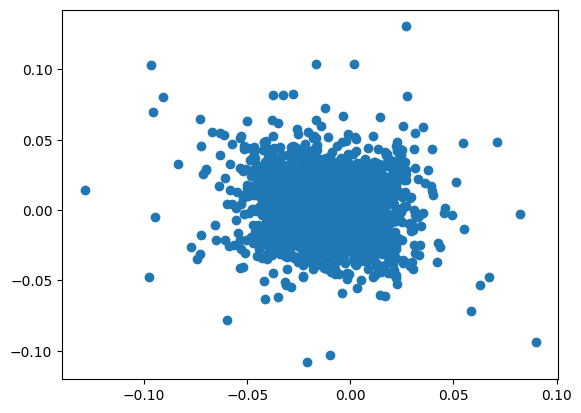

In [ ]:
plt.scatter(cloud[:, 0], cloud[:, 1])

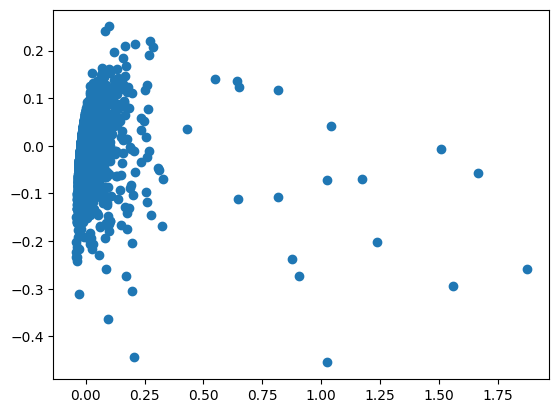

In [ ]:
from sklearn.decomposition import PCA
pca = PCA(n_components=2)
res = pca.fit_transform(cloud)

plt.scatter(res[:, 0], res[:, 1])

In [ ]:
model.wv.most_similar('ocean')

Model: "sequential_7"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ embedding_6 (Embedding)         │ (None, 33, 3)          │           276 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ reshape_6 (Reshape)             │ (None, 33, 3, 1)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 31, 1, 20)      │           200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_6 (Dropout)             │ (None, 31, 1, 20)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_6 (Flatten)             │ (None, 620)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 18)             │        11,178 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 11,654 (45.52 KB)

 Trainable params: 11,654 (45.52 KB)

 Non-trainable params: 0 (0.00 B)

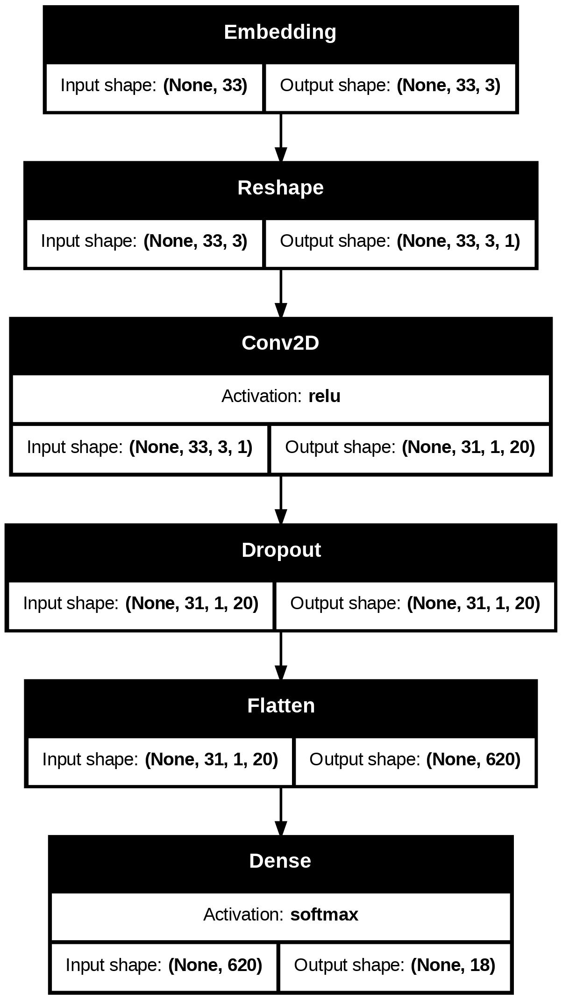

In [ ]:
import tensorflow as tf
EMBSIZE=3

model = tf.keras.models.Sequential()
model.add(tf.keras.layers.InputLayer(input_shape=(MAX_ORIG_TOKEN_LEN+2,)))
model.add(tf.keras.layers. Embedding (MAX_UNIQUE_CHARS, EMBSIZE, input_length=MAX_ORIG_TOKEN_LEN+2))
model.add(tf.keras.layers. Reshape((MAX_ORIG_TOKEN_LEN+2, EMBSIZE, 1), input_shape=(MAX_ORIG_TOKEN_LEN+2,EMBSIZE,)))
model.add(tf.keras.layers.Conv2D (20, kernel_size=3, activation='relu'))
model.add(tf.keras.layers.Dropout(rate=0.3))
model.add(tf.keras.layers.Flatten())
model.add(tf.keras.layers. Dense (MAX_UNIQUE_TAGS, activation='softmax'))
model.compile(optimizer='adam', loss='categorical_crossentropy',metrics=['accuracy'])
model.summary()

tf.keras.utils.plot_model(model,show_layer_activations=True, show_shapes=True)

In [ ]:
model_tf = tf.keras.models.Sequential()
model_tf.add(tf.keras.layers.InputLayer(input_shape=(MAX_ORIG_TOKEN_LEN+2,)))
model_tf.add(tf.keras.layers.Embedding(MAX_UNIQUE_CHARS, EMBSIZE, input_length=MAX_ORIG_TOKEN_LEN+2))
model_tf.add(tf.keras.layers.Reshape((MAX_ORIG_TOKEN_LEN+2, EMBSIZE, 1)))
model_tf.add(tf.keras.layers.Conv2D(20, kernel_size=3, activation='relu'))
model_tf.add(tf.keras.layers.Dropout(rate=0.3))
model_tf.add(tf.keras.layers.Flatten())
model_tf.add(tf.keras.layers.Dense(MAX_UNIQUE_TAGS, activation='softmax'))
model_tf.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
model_tf.summary()


train_labels_c = tf.keras.utils.to_categorical(train_labels, num_classes=MAX_UNIQUE_TAGS)
test_labels_c = tf.keras.utils.to_categorical(test_labels, num_classes=MAX_UNIQUE_TAGS)
print(train_labels_c.shape, test_labels_c.shape)

es = tf.keras.callbacks.EarlyStopping(monitor='val_loss', mode='min', patience=3, restore_best_weights=True)

model_tf.fit(train_inputs, train_labels_c,
             validation_split=(test_inputs, test_labels_c),
             callbacks=[es],
             epochs=1000)

Model: "sequential_10"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ embedding_9 (Embedding)         │ (None, 33, 3)          │           276 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ reshape_9 (Reshape)             │ (None, 33, 3, 1)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_9 (Conv2D)               │ (None, 31, 1, 20)      │           200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_9 (Dropout)             │ (None, 31, 1, 20)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_9 (Flatten)             │ (None, 620)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_9 (Dense)                 │ (None, 18)             │        11,178 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 11,654 (45.52 KB)

 Trainable params: 11,654 (45.52 KB)

 Non-trainable params: 0 (0.00 B)

(426152, 18) (153577, 18)


TypeError: unsupported operand type(s) for -: 'float' and 'tuple'

In [ ]:
from sklearn.metrics import confusion_matrix
test_predictions = model_tf.predict(test_inputs)
test_pred_classes = np.argmax(test_predictions, axis=1)
test_true_classes = np.argmax(test_labels_c, axis=1)
cm = confusion_matrix(test_true_classes, test_pred_classes)
print(cm)

4800/4800 ━━━━━━━━━━━━━━━━━━━━ 8s 2ms/step
[[  180     0    88     0     0     0     0     0     0     0     0     0
      0     0     0     0     0     0]
 [    0 10127    15   313     2     1   136     0  3693    52    30    20
      7     3     4     0   273    40]
 [    0     0 13295    90     0     0    12     0   267     0     0    12
      0     0    20     0    21     0]
 [    0   602    78  2943     0     0   157     0  2988    11    31   110
     26     0   340     0   155     0]
 [    0     0     5     0  1303     0     0     0    82     0     0     0
      0     0     0     0     0     0]
 [    0     0    52     5     0  5499     0     0    28     0    98     0
      0     0     0     0     0     0]
 [    0    72    97    37     0     0  3464     0   498    17    73  1347
      7     0     0     0     0     0]
 [    0     0     5     1     0     0     0     0     6     0     4     9
      0     0     0     0     0     0]
 [    0  1103   193   273     8    16   389     0 321

In [ ]:
all_train_texts = [' '.join(str(token.form) for token in sent) for sent in full_train]
f=open('barmaglot.txt')
l=f.read()
all_train_texts = ''.join(l)
print(all_train_texts)
# quit()
# train_char_tokenized = tokenize_corpus(all_train_texts, tokenizer=character_tokenize )
input_words = parse_words(all_train_texts)
# print(input_words)

def words2array2(all_words, char2id, label2id, max_token_len):
    inputs =[]
    targets =[]
    words=[]
    for token_i, token in enumerate(all_words):
             charray=np.zeros(max_token_len + 2)
             if(token):
              for char_i, char in enumerate(token.lower()):
                charray[char_i + 1] = char2id.get(char, 0)
             inputs.append(charray)
             words.append(token)
    return np.array(inputs).astype(int), np.array(words)
test_inputs2, words2 = words2array2(input_words, char_vocab, label2id, MAX_ORIG_TOKEN_LEN)
yp=model.predict(test_inputs2)
yp=yp.argmax(axis=1)
for i in range(yp.shape[0]):
  print(words2[i], id2label[yp[i]])

17.11.2025

Рекурентные нейронные сети

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import LSTM
import numpy as np

np.random.seed(7)

alphabet = "ABCDEFGHIJKLMNOPQRSTUVWXYZ"

char_to_int = dict((c, i) for i, c in enumerate(alphabet))
int_to_char = dict((i, c) for i, c in enumerate(alphabet))
print(char_to_int)

seq_length = 3
dataX = []
dataY = []
for i in range(0, len(alphabet) - seq_length, 1):
  seq_in = alphabet[i:i + seq_length]
  seq_out = alphabet[i + seq_length]
  dataX.append([char_to_int[char] for char in seq_in])
  dataY.append(char_to_int[seq_out])
#  print(seq_in, '->', seq_out)

print(dataX,dataY)

{'A': 0, 'B': 1, 'C': 2, 'D': 3, 'E': 4, 'F': 5, 'G': 6, 'H': 7, 'I': 8, 'J': 9, 'K': 10, 'L': 11, 'M': 12, 'N': 13, 'O': 14, 'P': 15, 'Q': 16, 'R': 17, 'S': 18, 'T': 19, 'U': 20, 'V': 21, 'W': 22, 'X': 23, 'Y': 24, 'Z': 25}
[[0, 1, 2], [1, 2, 3], [2, 3, 4], [3, 4, 5], [4, 5, 6], [5, 6, 7], [6, 7, 8], [7, 8, 9], [8, 9, 10], [9, 10, 11], [10, 11, 12], [11, 12, 13], [12, 13, 14], [13, 14, 15], [14, 15, 16], [15, 16, 17], [16, 17, 18], [17, 18, 19], [18, 19, 20], [19, 20, 21], [20, 21, 22], [21, 22, 23], [22, 23, 24]] [3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25]


[[0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0.]
 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0.]
 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0.]
 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0.]
 [0.

Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm_3 (LSTM)                   │ (None, 32)             │         4,608 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 26)             │           858 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 5,466 (21.35 KB)

 Trainable params: 5,466 (21.35 KB)

 Non-trainable params: 0 (0.00 B)

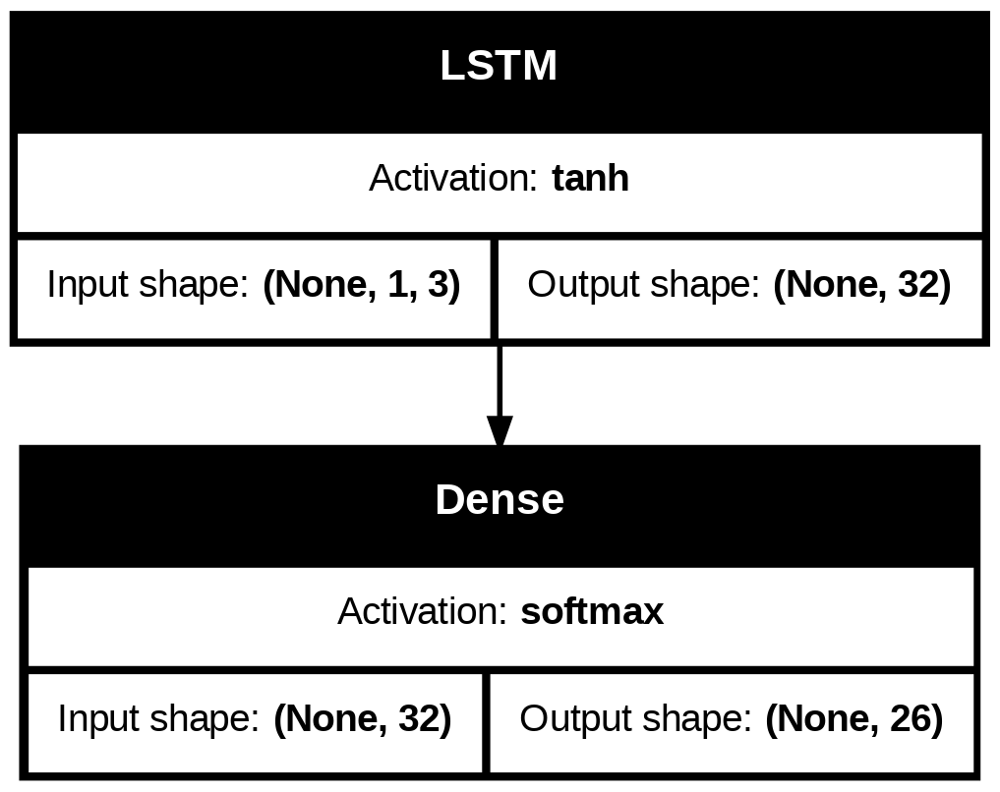

In [ ]:
X = np.reshape(dataX, (len(dataX), 1, seq_length))
X = X / float(len(alphabet))

import tensorflow as tf
y = tf.keras.utils.to_categorical(dataY)
print(y)

model = Sequential()
model.add(tf.keras.layers.Input((X.shape[1], X.shape[2],)))
model.add(LSTM(32))
model.add(Dense(y.shape[1], activation='softmax'))
model.summary()

tf.keras.utils.plot_model(model,show_shapes=True, show_layer_activations=True)

In [ ]:
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
model.fit(X, y, epochs=500, batch_size=1)

Epoch 1/500
23/23 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.0281 - loss: 3.2725
Epoch 2/500
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.0075 - loss: 3.2639     
Epoch 3/500
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.0354 - loss: 3.2557
Epoch 4/500
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.0316 - loss: 3.2496     
Epoch 5/500
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.0354 - loss: 3.2403     
Epoch 6/500
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.0165 - loss: 3.2351
Epoch 7/500
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.1157 - loss: 3.2151
Epoch 8/500
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.0494 - loss: 3.2211
Epoch 9/500
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.0281 - loss: 3.2204
Epoch 10/500
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.0395 - loss: 3.2048
Epoch 11/500
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.0096 - loss: 3.1906
Epoch 12/500
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/s

In [ ]:
y_pred = model.predict(X)
y_pred_classes = np.argmax(y_pred, axis=1)
y_true_classes = np.argmax(y, axis=1)

report = classification_report(y_true_classes, y_pred_classes)
print("Classification Report:")
print(report)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step
Classification Report:
              precision    recall  f1-score   support

           3       1.00      1.00      1.00         1
           4       1.00      1.00      1.00         1
           5       1.00      1.00      1.00         1
           6       1.00      1.00      1.00         1
           7       1.00      1.00      1.00         1
           8       1.00      1.00      1.00         1
           9       1.00      1.00      1.00         1
          10       1.00      1.00      1.00         1
          11       1.00      1.00      1.00         1
          12       1.00      1.00      1.00         1
          13       1.00      1.00      1.00         1
          14       1.00      1.00      1.00         1
          15       1.00      1.00      1.00         1
          16       1.00      1.00      1.00         1
          17       1.00      1.00      1.00         1
          18       1.00      1.00      1.00         1
          19       

/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [ ]:
for pattern in dataX:
  x = np.reshape(pattern, (1, 1,  len(pattern)))
  x = x / float(len(alphabet))
  prediction = model.predict(x, verbose=0)
  index = np.argmax(prediction)
  result = int_to_char[index]
  seq_in = [int_to_char[value] for value in pattern]
  print(seq_in, "->", result)

['A', 'B', 'C'] -> D
['B', 'C', 'D'] -> E
['C', 'D', 'E'] -> F
['D', 'E', 'F'] -> G
['E', 'F', 'G'] -> H
['F', 'G', 'H'] -> I
['G', 'H', 'I'] -> J
['H', 'I', 'J'] -> K
['I', 'J', 'K'] -> L
['J', 'K', 'L'] -> M
['K', 'L', 'M'] -> N
['L', 'M', 'N'] -> O
['M', 'N', 'O'] -> P
['N', 'O', 'P'] -> Q
['O', 'P', 'Q'] -> R
['P', 'Q', 'R'] -> S
['Q', 'R', 'S'] -> T
['R', 'S', 'T'] -> U
['S', 'T', 'U'] -> W
['T', 'U', 'V'] -> X
['U', 'V', 'W'] -> Z
['V', 'W', 'X'] -> Z
['W', 'X', 'Y'] -> Z


Число в квадрат + 1

In [ ]:
# -*- coding: utf-8 -*-
# from future import print_function
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, LSTM, Dense
import numpy as np
batch_size,epochs,latent_dim,num_samples = 64,100,256,10000

input_texts,target_texts = [],[]
import random
for line in range(10000):
    d = random.randint(1,1000)
    input_texts.append(str(d))
    target_texts.append('\t'+str(d**2+1)+'\n')
input_characters=sorted(set(list(' 0123456789')))
target_characters=sorted(set(list(' 0123456789 \n\t')))
print(input_texts[:5])
print('квадраты')
print(target_texts[:5])

['319', '186', '881', '818', '432']
квадраты
['\t101762\n', '\t34597\n', '\t776162\n', '\t669125\n', '\t186625\n']


In [ ]:
num_encoder_tokens = len(input_characters)
num_decoder_tokens = len(target_characters)
max_encoder_seq_length = max([len(txt) for txt in input_texts])
max_decoder_seq_length = max([len(txt) for txt in target_texts])

print(max_encoder_seq_length,max_decoder_seq_length)
print(num_encoder_tokens,num_decoder_tokens)
print(target_characters)

4 9
11 13
['\t', '\n', ' ', '0', '1', '2', '3', '4', '5', '6', '7', '8', '9']


In [ ]:
input_token_index = dict([(char, i) for i, char in enumerate(input_characters)])
target_token_index = dict([(char, i) for i, char in enumerate(target_characters)])

reverse_input_char_index = dict((i, char) for char, i in input_token_index.items())
reverse_target_char_index = dict((i, char) for char, i in target_token_index.items())

print(input_token_index)

print(reverse_target_char_index)

{' ': 0, '0': 1, '1': 2, '2': 3, '3': 4, '4': 5, '5': 6, '6': 7, '7': 8, '8': 9, '9': 10}
{0: '\t', 1: '\n', 2: ' ', 3: '0', 4: '1', 5: '2', 6: '3', 7: '4', 8: '5', 9: '6', 10: '7', 11: '8', 12: '9'}


In [ ]:
encoder_input_data = np.zeros((len(input_texts), max_encoder_seq_length, num_encoder_tokens), dtype='float32')
decoder_input_data = np.zeros((len(input_texts), max_decoder_seq_length, num_decoder_tokens), dtype='float32')
decoder_target_data = np.zeros((len(input_texts), max_decoder_seq_length, num_decoder_tokens), dtype='float32')

for i, (input_text, target_text) in enumerate(zip(input_texts, target_texts)):
    for t, char in enumerate(input_text):
        encoder_input_data[i, t, input_token_index[char]] = 1.
    encoder_input_data[i, t + 1:, input_token_index[' ']] = 1.
    for t, char in enumerate(target_text):
        decoder_input_data[i, t, target_token_index[char]] = 1.
        if t > 0:
            decoder_target_data[i, t - 1, target_token_index[char]] = 1.
    decoder_input_data[i, t + 1:, target_token_index[' ']] = 1.
    decoder_target_data[i, t:, target_token_index[' ']] = 1.

print(encoder_input_data.shape)

print(decoder_target_data.shape)

(10000, 4, 11)
(10000, 9, 13)


Model: "functional_10"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_8       │ (None, None, 11)  │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ input_layer_9       │ (None, None, 13)  │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_8 (LSTM)       │ [(None, 256),     │    274,432 │ input_layer_8[0]… │
│                     │ (None, 256),      │            │                   │
│                     │ (None, 256)]      │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_9 (LSTM)       │ [(None, None,     │    276,480 │ input_layer_9[0]… │
│                     │ 256), (None,      │            │ lstm_8[0][1],     │
│                     │ 256), (None,      │            │ lstm_8[0][2]      │
│                     │ 256)]             │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_6 (Dense)     │ (None, None, 13)  │      3,341 │ lstm_9[0][0]      │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 554,253 (2.11 MB)

 Trainable params: 554,253 (2.11 MB)

 Non-trainable params: 0 (0.00 B)

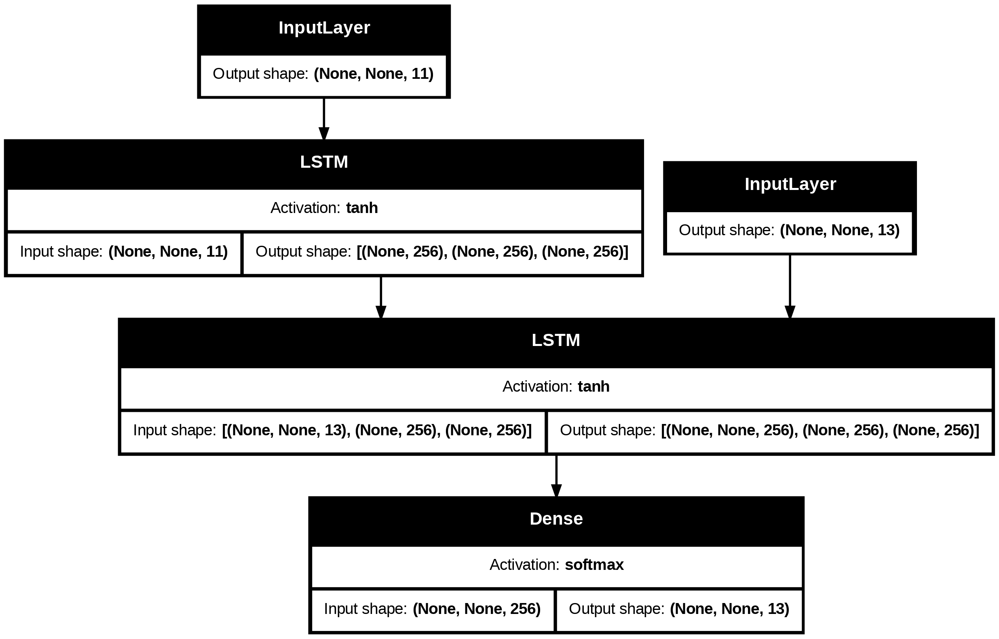

In [ ]:
encoder_inputs = Input(shape=(None, num_encoder_tokens))
encoder = LSTM(latent_dim, return_state=True)
encoder_outputs, state_h, state_c = encoder(encoder_inputs)
encoder_states = [state_h, state_c]
decoder_inputs = Input(shape=(None, num_decoder_tokens))
decoder_lstm = LSTM(latent_dim, return_sequences=True, return_state=True)
decoder_outputs, _, _ = decoder_lstm(decoder_inputs, initial_state=encoder_states)
decoder_dense = Dense(num_decoder_tokens, activation="softmax")
decoder_outputs = decoder_dense(decoder_outputs)
model = Model([encoder_inputs, decoder_inputs], decoder_outputs)

model.compile(optimizer="rmsprop", loss="categorical_crossentropy")

model.summary()
tf.keras.utils.plot_model(model,show_shapes=True, show_layer_activations=True)

In [ ]:
model.compile(optimizer="rmsprop", loss="categorical_crossentropy", metrics=['accuracy'])
es = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', mode='max', patience=2)
model.fit([encoder_input_data, decoder_input_data], decoder_target_data, batch_size=batch_size, epochs=epochs, validation_split=0.2, callbacks=[es])
model.save("s2s.keras")

Epoch 1/100
125/125 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.4230 - loss: 1.6157 - val_accuracy: 0.5023 - val_loss: 1.4169
Epoch 2/100
125/125 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.4827 - loss: 1.4395 - val_accuracy: 0.5277 - val_loss: 1.3232
Epoch 3/100
125/125 ━━━━━━━━━━━━━━━━━━━━ 7s 55ms/step - accuracy: 0.5261 - loss: 1.3263 - val_accuracy: 0.5394 - val_loss: 1.2493
Epoch 4/100
 19/125 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - accuracy: 0.5582 - loss: 1.2249

22.11.2025

Взаимодействующие сети и Автоэнкодеры

In [ ]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
from sklearn.datasets import load_digits
import tensorflow as tf
from tensorflow.keras.layers import Input, Dense
from tensorflow.keras.models import Model


In [ ]:
digits = load_digits()

In [ ]:
from tensorflow.keras.layers import Input, Dense
from tensorflow.keras.models import Model
import tensorflow as tf


x = digits.data / digits.data.max()
input_dim, encoding_dim = x.shape[1], 5

input_layer = Input(shape=(input_dim,))
encoder_layer = Dense(input_dim // 2, activation='selu')(input_layer)
encoder_layer = Dense(input_dim // 4, activation='selu')(encoder_layer)
encoder_layer = Dense(input_dim // 8, activation='selu')(encoder_layer)
encoder_layer2 = Dense(encoding_dim, activation='selu')(encoder_layer)
encoder_model = Model(input_layer, encoder_layer2, name='encoder')

decoder_input = Input(shape=(encoding_dim,))
decoder_layer = Dense(input_dim // 8, activation='selu')(decoder_input)
decoder_layer = Dense(input_dim // 4, activation='selu')(decoder_layer)
decoder_layer = Dense(input_dim // 2, activation='selu')(decoder_layer)
decoder_layer2 = Dense(input_dim, activation='sigmoid')(decoder_layer)
decoder_model = Model(decoder_input, decoder_layer2, name='decoder')

autoencoder_input = Input(shape=(input_dim,))
encoded = encoder_model(autoencoder_input)
decoded = decoder_model(encoded)
autoencoder = Model(autoencoder_input, decoded, name='autoencoder')

autoencoder.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-2), loss='binary_crossentropy')

es = tf.keras.callbacks.EarlyStopping(patience=10, monitor='val_loss', mode='min', restore_best_weights=True)
autoencoder.fit(x, x, epochs=10000, batch_size=256, shuffle=True, validation_split=0.2, callbacks=[es])

Yp = encoder_model.predict(x)

Epoch 1/10000
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step - loss: 0.6976 - val_loss: 0.4931
Epoch 2/10000
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.4740 - val_loss: 0.4349
Epoch 3/10000
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.4353 - val_loss: 0.4177
Epoch 4/10000
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.4218 - val_loss: 0.4070
Epoch 5/10000
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.4095 - val_loss: 0.3997
Epoch 6/10000
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.4033 - val_loss: 0.3904
Epoch 7/10000
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.3948 - val_loss: 0.3821
Epoch 8/10000
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.3870 - val_loss: 0.3690
Epoch 9/10000
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.3744 - val_loss: 0.3569
Epoch 10/10000
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.3624 - val_loss: 0.3481
Epoch 11/10000
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.3557 - val_loss: 0.3434
Epoch 12/10000
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step

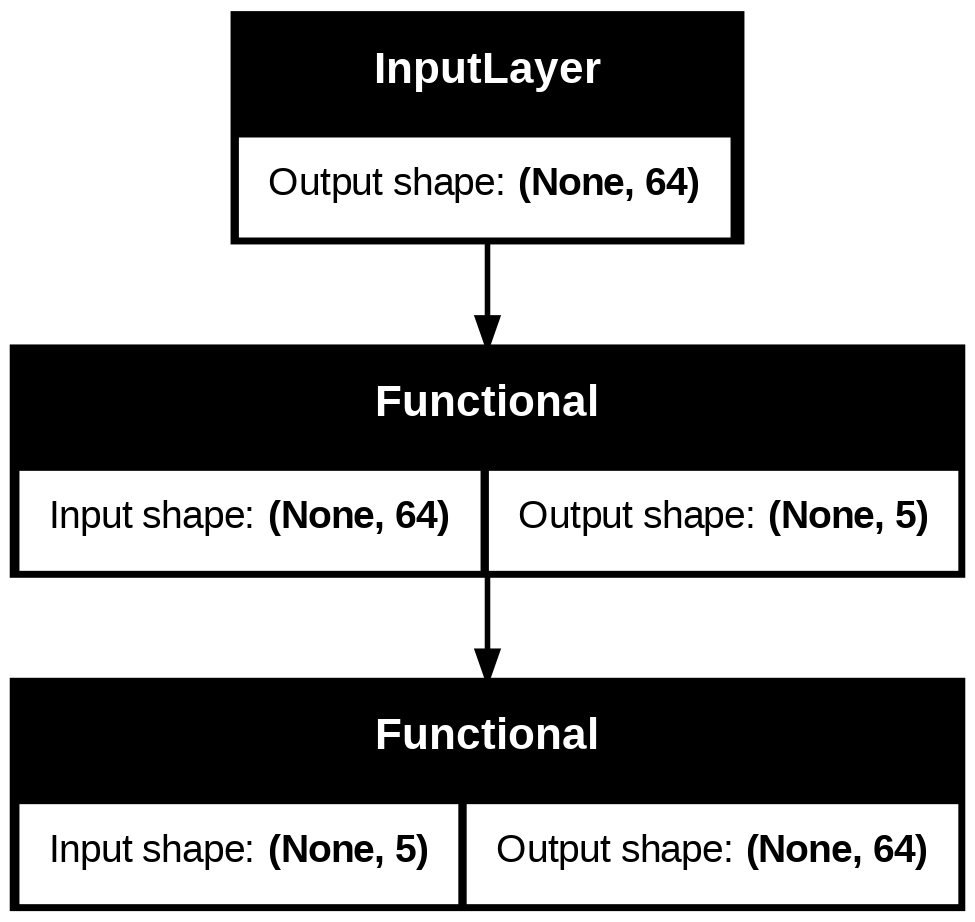

In [ ]:
tf.keras.utils.plot_model(autoencoder,show_shapes=True, show_layer_activations=True)

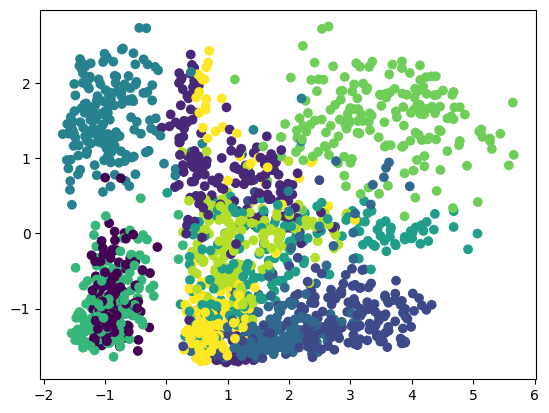

In [ ]:
plt.scatter(Yp[:, 0], Yp[:, 1], c = digits.target)
plt.show()

57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


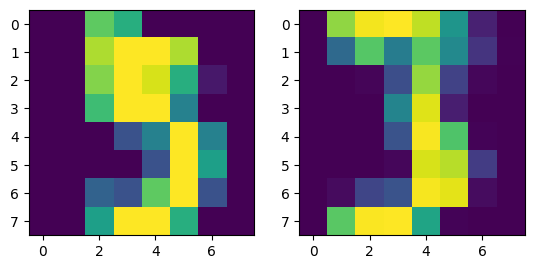

In [ ]:
plt.subplot(1, 2, 1)
plt.imshow(digits.data[5].reshape(8, 8))
d2 = autoencoder.predict(digits.data)[5]
plt.subplot(1, 2, 2)
plt.imshow(d2.reshape(8, 8))

Генеративно-состязательные сети

In [ ]:
import tensorflow as tf
import os
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm

from keras.layers import Input
from keras.models import Model, Sequential
from keras.layers import Dense, Dropout
#from keras.layers.advanced_activations import LeakyReLU
from keras.layers import LeakyReLU
from keras.datasets import mnist
from tensorflow.keras.optimizers import Adam
from keras import initializers

# os.environ["KERAS_BACKEND"] = "tensorflow"
np.random.seed(10)
random_dim = 100  #image set size

def load_minst_data():
    (x_train, y_train), (x_test, y_test) = mnist.load_data()
    x_train = (x_train.astype(np.float32) - 127.5)/127.5
    x_train = x_train.reshape(60000, 28*28)
    return (x_train[:6000], y_train[:6000], x_test[:1000], y_test[:1000])

def get_optimizer():
    return Adam(learning_rate=0.0002, beta_1=0.5)
A=load_minst_data()
print(A[0].shape)

11490434/11490434 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
(6000, 784)


In [ ]:
def get_generator(optimizer):
  generator = Sequential()
  generator.add(Dense(256, input_dim=random_dim, kernel_initializer=initializers.RandomNormal(stddev=0.02)))
  generator.add(LeakyReLU(0.2))
  generator.add(Dense(512))
  generator.add(LeakyReLU(0.2))
  generator.add(Dense(1024))
  generator.add(Dense(784, activation='tanh'))
  generator.compile(loss='binary_crossentropy', optimizer=optimizer)
  return generator

model1 = get_generator(get_optimizer())
print(model1.summary())

def get_discriminator(optimizer):
    discriminator = Sequential()
    discriminator.add(Dense(1024, input_dim=784,
                  kernel_initializer=initializers.RandomNormal(stddev=0.02)))
    discriminator.add(LeakyReLU(0.2))
    discriminator.add(Dropout(0.3))
    discriminator.add(Dense(512))
    discriminator.add(LeakyReLU(0.2))
    discriminator.add(Dropout(0.3))
    discriminator.add(Dense(256))
    discriminator.add(LeakyReLU(0.2))
    discriminator.add(Dropout(0.3))
    discriminator.add(Dense(1, activation='sigmoid'))
    discriminator.compile(loss='binary_crossentropy', optimizer=optimizer)
    return discriminator

model2 = get_discriminator(get_optimizer())
print(model2.summary())

/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_44 (Dense)                │ (None, 256)            │        25,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu (LeakyReLU)         │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_45 (Dense)                │ (None, 512)            │       131,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_1 (LeakyReLU)       │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_46 (Dense)                │ (None, 1024)           │       525,312 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_47 (Dense)                │ (None, 784)            │       803,600 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,486,352 (5.67 MB)

 Trainable params: 1,486,352 (5.67 MB)

 Non-trainable params: 0 (0.00 B)

None


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_48 (Dense)                │ (None, 1024)           │       803,840 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_2 (LeakyReLU)       │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_49 (Dense)                │ (None, 512)            │       524,800 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_3 (LeakyReLU)       │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_50 (Dense)                │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_4 (LeakyReLU)       │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_51 (Dense)                │ (None, 1)              │           257 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,460,225 (5.57 MB)

 Trainable params: 1,460,225 (5.57 MB)

 Non-trainable params: 0 (0.00 B)

None


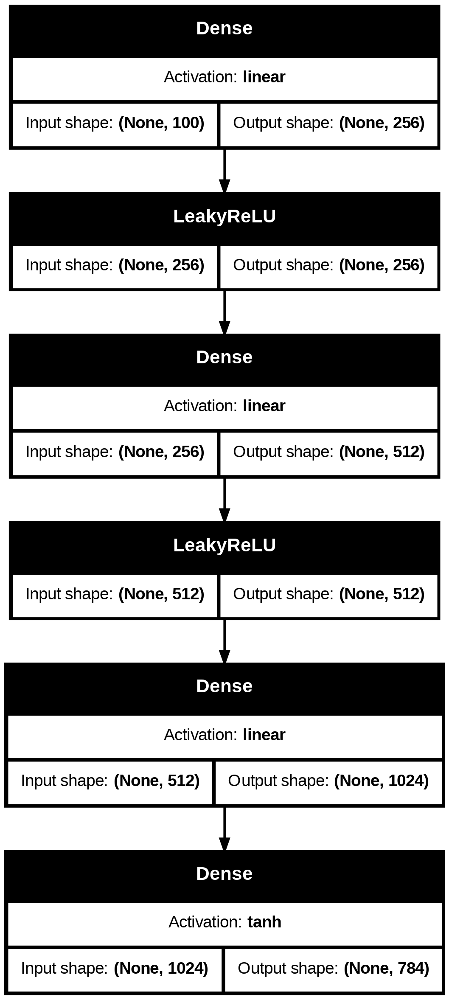

In [ ]:
tf.keras.utils.plot_model(model1,show_shapes=True, show_layer_activations=True)

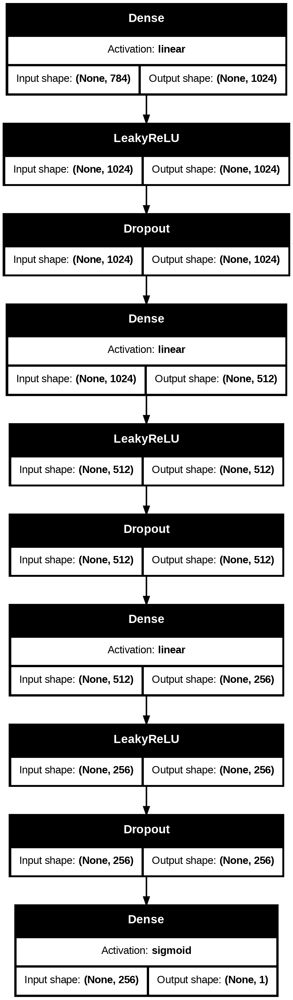

In [ ]:
tf.keras.utils.plot_model(model2,show_shapes=True, show_layer_activations=True)

In [ ]:
model2=get_discriminator(get_optimizer())

def get_gan_network(discriminator, random_dim, generator, optimizer):
    discriminator.trainable = False
    gan_input = Input(shape=(random_dim,))
    x = generator(gan_input)
    gan_output = discriminator(x)
    gan = Model(inputs=gan_input, outputs=gan_output)
    gan.compile(loss='binary_crossentropy', optimizer=optimizer)
    return gan
gan=get_gan_network(model2,100,model1,get_optimizer())
gan.summary()

/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "functional_26"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_20 (InputLayer)     │ (None, 100)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ sequential_1 (Sequential)       │ (None, 784)            │     1,486,352 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ sequential_3 (Sequential)       │ (None, 1)              │     1,460,225 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,946,577 (11.24 MB)

 Trainable params: 1,486,352 (5.67 MB)

 Non-trainable params: 1,460,225 (5.57 MB)

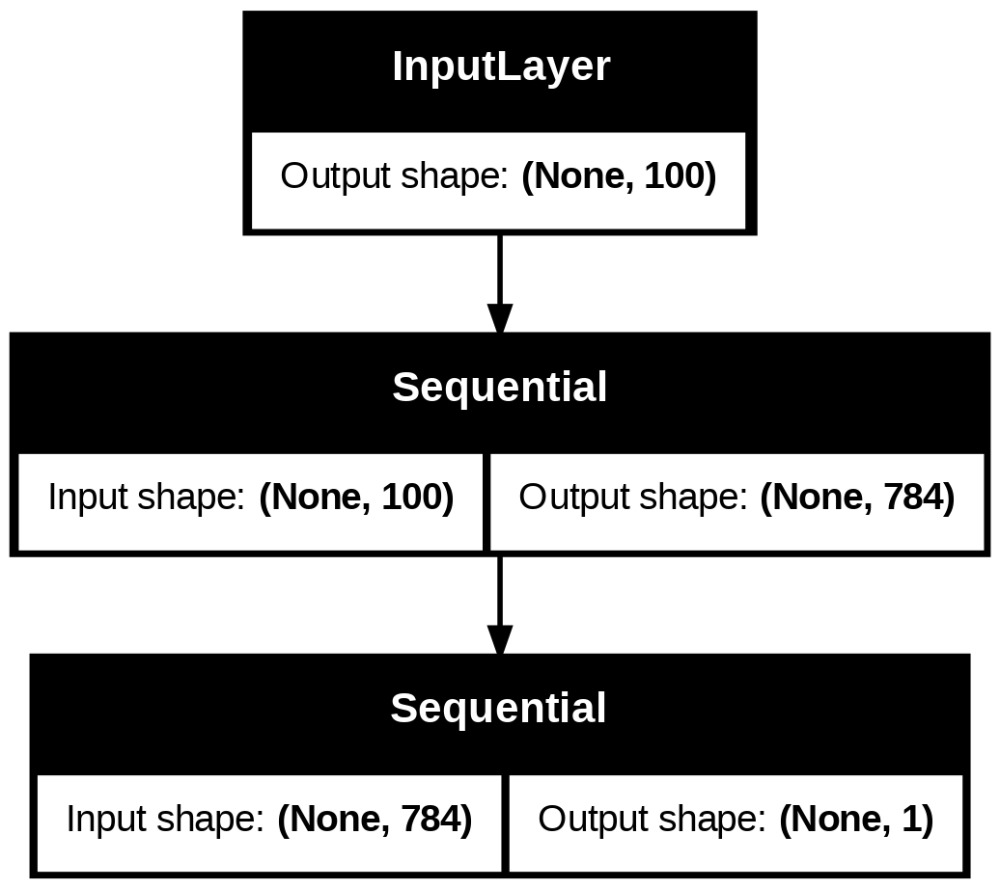

In [ ]:
tf.keras.utils.plot_model(gan,show_shapes=True, show_layer_activations=True)

In [ ]:
def plot_generated_images(epoch, generator, examples=100, dim=(10, 10), figsize=(10, 10)):
    noise = np.random.normal(0, 1, size=[examples, random_dim])
    generated_images = generator.predict(noise)
    generated_images = generated_images.reshape(examples, 28, 28)
    plt.figure(figsize=figsize)
    for i in range(generated_images.shape[0]):
        plt.subplot(dim[0], dim[1], i+1)
        plt.imshow(generated_images[i], interpolation='nearest', cmap='gray_r')
        plt.axis('off')
    plt.tight_layout()
    plt.savefig('gan_generated_image_epoch_%d.png' % epoch)

In [ ]:
import gc
def train(epochs=1, batch_size=128):
    x_train, y_train, x_test, y_test = load_minst_data()
    batch_count = x_train.shape[0] / batch_size
    adam = get_optimizer()
    adam2 = get_optimizer()
    adam3 = get_optimizer()

    generator = get_generator(adam)
    discriminator = get_discriminator(adam2)
    gan = get_gan_network(discriminator, random_dim, generator, adam3)

    for e in range(1, epochs+1):
        print ('-'*15, 'Epoch %d' % e, '-'*15)
        for _ in tqdm(range(int(batch_count))):
            noise = np.random.normal(0, 1, size=[batch_size, random_dim])
            image_batch = x_train[np.random.randint(0, x_train.shape[0], size=batch_size)]
            generated_images = generator.predict(noise)
            X = np.concatenate([image_batch, generated_images])
            y_dis = np.zeros(2*batch_size)  #label noise
            y_dis[:batch_size] = 0.9    #label natural

            # Train discriminator
            discriminator.trainable = True
            discriminator.train_on_batch(X, y_dis)

            # Train generator
            noise = np.random.normal(0, 1, size=[batch_size, random_dim])

            y_gen = np.ones(batch_size)    #label noise
            discriminator.trainable = False
            gan.train_on_batch(noise, y_gen)
            gc.collect()
        if e % 5 == 1:
          plot_generated_images(e, generator)

In [ ]:
train(400, 128)

/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


--------------- Epoch 1 ---------------


  0%|          | 0/46 [00:00<?, ?it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


  2%|▏         | 1/46 [00:04<03:27,  4.61s/it]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


  4%|▍         | 2/46 [00:05<01:41,  2.30s/it]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


  7%|▋         | 3/46 [00:05<01:06,  1.56s/it]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


  9%|▊         | 4/46 [00:06<00:50,  1.20s/it]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 11%|█         | 5/46 [00:07<00:41,  1.01s/it]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 13%|█▎        | 6/46 [00:07<00:35,  1.12it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 15%|█▌        | 7/46 [00:08<00:31,  1.22it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 17%|█▋        | 8/46 [00:09<00:29,  1.30it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 20%|█▉        | 9/46 [00:09<00:27,  1.36it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 22%|██▏       | 10/46 [00:10<00:25,  1.40it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 24%|██▍       | 11/46 [00:11<00:24,  1.42it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 26%|██▌       | 12/46 [00:11<00:23,  1.44it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


 28%|██▊       | 13/46 [00:12<00:22,  1.46it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 30%|███       | 14/46 [00:13<00:22,  1.44it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


 33%|███▎      | 15/46 [00:14<00:23,  1.31it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


 35%|███▍      | 16/46 [00:15<00:24,  1.24it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 37%|███▋      | 17/46 [00:15<00:22,  1.29it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 39%|███▉      | 18/46 [00:16<00:20,  1.34it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 41%|████▏     | 19/46 [00:17<00:19,  1.39it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 43%|████▎     | 20/46 [00:17<00:18,  1.42it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 46%|████▌     | 21/46 [00:18<00:17,  1.44it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 48%|████▊     | 22/46 [00:19<00:16,  1.47it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 50%|█████     | 23/46 [00:19<00:15,  1.48it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 52%|█████▏    | 24/46 [00:20<00:14,  1.49it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 54%|█████▍    | 25/46 [00:21<00:13,  1.50it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 57%|█████▋    | 26/46 [00:21<00:13,  1.50it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 59%|█████▊    | 27/46 [00:22<00:12,  1.51it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 61%|██████    | 28/46 [00:23<00:11,  1.51it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 63%|██████▎   | 29/46 [00:23<00:11,  1.49it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 65%|██████▌   | 30/46 [00:24<00:10,  1.51it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 67%|██████▋   | 31/46 [00:25<00:09,  1.51it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 70%|██████▉   | 32/46 [00:25<00:09,  1.42it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 72%|███████▏  | 33/46 [00:26<00:09,  1.33it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


 74%|███████▍  | 34/46 [00:27<00:09,  1.26it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 76%|███████▌  | 35/46 [00:28<00:08,  1.32it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 78%|███████▊  | 36/46 [00:29<00:07,  1.37it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 80%|████████  | 37/46 [00:29<00:06,  1.41it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 83%|████████▎ | 38/46 [00:30<00:05,  1.43it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 85%|████████▍ | 39/46 [00:31<00:04,  1.45it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 87%|████████▋ | 40/46 [00:31<00:04,  1.46it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 89%|████████▉ | 41/46 [00:32<00:03,  1.46it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 91%|█████████▏| 42/46 [00:33<00:02,  1.47it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 93%|█████████▎| 43/46 [00:33<00:02,  1.48it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 96%|█████████▌| 44/46 [00:34<00:01,  1.49it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 98%|█████████▊| 45/46 [00:35<00:00,  1.50it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


100%|██████████| 46/46 [00:35<00:00,  1.29it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


--------------- Epoch 2 ---------------


  0%|          | 0/46 [00:00<?, ?it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


  2%|▏         | 1/46 [00:00<00:39,  1.14it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


  4%|▍         | 2/46 [00:01<00:40,  1.09it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


  7%|▋         | 3/46 [00:02<00:39,  1.10it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


  9%|▊         | 4/46 [00:03<00:35,  1.19it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 11%|█         | 5/46 [00:04<00:32,  1.26it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 13%|█▎        | 6/46 [00:04<00:30,  1.31it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 15%|█▌        | 7/46 [00:05<00:29,  1.33it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 17%|█▋        | 8/46 [00:06<00:28,  1.34it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 20%|█▉        | 9/46 [00:07<00:27,  1.37it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 22%|██▏       | 10/46 [00:07<00:26,  1.38it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 24%|██▍       | 11/46 [00:08<00:25,  1.39it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 26%|██▌       | 12/46 [00:09<00:24,  1.40it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 28%|██▊       | 13/46 [00:09<00:23,  1.40it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 30%|███       | 14/46 [00:10<00:22,  1.40it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 33%|███▎      | 15/46 [00:11<00:22,  1.41it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 35%|███▍      | 16/46 [00:11<00:21,  1.40it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 37%|███▋      | 17/46 [00:12<00:21,  1.35it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 39%|███▉      | 18/46 [00:13<00:22,  1.27it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 41%|████▏     | 19/46 [00:14<00:23,  1.16it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 43%|████▎     | 20/46 [00:15<00:21,  1.23it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 46%|████▌     | 21/46 [00:16<00:19,  1.27it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 48%|████▊     | 22/46 [00:16<00:18,  1.30it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 50%|█████     | 23/46 [00:17<00:17,  1.33it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 52%|█████▏    | 24/46 [00:18<00:16,  1.36it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 54%|█████▍    | 25/46 [00:18<00:15,  1.38it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 57%|█████▋    | 26/46 [00:19<00:14,  1.40it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 59%|█████▊    | 27/46 [00:20<00:13,  1.41it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 61%|██████    | 28/46 [00:21<00:12,  1.41it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 63%|██████▎   | 29/46 [00:21<00:12,  1.41it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 65%|██████▌   | 30/46 [00:22<00:11,  1.40it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 67%|██████▋   | 31/46 [00:23<00:10,  1.40it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 70%|██████▉   | 32/46 [00:23<00:09,  1.40it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 72%|███████▏  | 33/46 [00:24<00:09,  1.40it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


 74%|███████▍  | 34/46 [00:25<00:09,  1.27it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


 76%|███████▌  | 35/46 [00:26<00:09,  1.15it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 78%|███████▊  | 36/46 [00:27<00:08,  1.21it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 80%|████████  | 37/46 [00:28<00:07,  1.25it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 83%|████████▎ | 38/46 [00:28<00:06,  1.30it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 85%|████████▍ | 39/46 [00:29<00:05,  1.33it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 87%|████████▋ | 40/46 [00:30<00:04,  1.36it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 89%|████████▉ | 41/46 [00:30<00:03,  1.37it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 91%|█████████▏| 42/46 [00:31<00:02,  1.38it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 93%|█████████▎| 43/46 [00:32<00:02,  1.38it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 96%|█████████▌| 44/46 [00:33<00:01,  1.39it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 98%|█████████▊| 45/46 [00:33<00:00,  1.40it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


100%|██████████| 46/46 [00:34<00:00,  1.33it/s]


--------------- Epoch 3 ---------------


  0%|          | 0/46 [00:00<?, ?it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


  2%|▏         | 1/46 [00:00<00:32,  1.40it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


  4%|▍         | 2/46 [00:01<00:31,  1.39it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


  7%|▋         | 3/46 [00:02<00:30,  1.39it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


  9%|▊         | 4/46 [00:03<00:33,  1.24it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 11%|█         | 5/46 [00:04<00:35,  1.17it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 13%|█▎        | 6/46 [00:04<00:34,  1.17it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 15%|█▌        | 7/46 [00:05<00:31,  1.24it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 17%|█▋        | 8/46 [00:06<00:29,  1.29it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 20%|█▉        | 9/46 [00:07<00:27,  1.32it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 22%|██▏       | 10/46 [00:07<00:26,  1.35it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 24%|██▍       | 11/46 [00:08<00:25,  1.37it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 26%|██▌       | 12/46 [00:09<00:24,  1.38it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 28%|██▊       | 13/46 [00:09<00:23,  1.39it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 30%|███       | 14/46 [00:10<00:23,  1.39it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 33%|███▎      | 15/46 [00:11<00:22,  1.37it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 35%|███▍      | 16/46 [00:12<00:21,  1.38it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 37%|███▋      | 17/46 [00:12<00:21,  1.37it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 39%|███▉      | 18/46 [00:13<00:20,  1.37it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 41%|████▏     | 19/46 [00:14<00:19,  1.38it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 43%|████▎     | 20/46 [00:15<00:19,  1.32it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


 46%|████▌     | 21/46 [00:16<00:20,  1.21it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


 48%|████▊     | 22/46 [00:16<00:20,  1.17it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 50%|█████     | 23/46 [00:17<00:18,  1.22it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 52%|█████▏    | 24/46 [00:18<00:17,  1.27it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 54%|█████▍    | 25/46 [00:19<00:16,  1.30it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 57%|█████▋    | 26/46 [00:19<00:15,  1.32it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 59%|█████▊    | 27/46 [00:20<00:14,  1.34it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 61%|██████    | 28/46 [00:21<00:13,  1.35it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 63%|██████▎   | 29/46 [00:22<00:12,  1.36it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 65%|██████▌   | 30/46 [00:22<00:11,  1.37it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 67%|██████▋   | 31/46 [00:23<00:10,  1.38it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 70%|██████▉   | 32/46 [00:24<00:10,  1.39it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 72%|███████▏  | 33/46 [00:24<00:09,  1.39it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 74%|███████▍  | 34/46 [00:25<00:08,  1.39it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 76%|███████▌  | 35/46 [00:26<00:07,  1.40it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 78%|███████▊  | 36/46 [00:27<00:07,  1.33it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 80%|████████  | 37/46 [00:28<00:07,  1.24it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 83%|████████▎ | 38/46 [00:29<00:06,  1.16it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 85%|████████▍ | 39/46 [00:29<00:05,  1.22it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 87%|████████▋ | 40/46 [00:30<00:04,  1.26it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 89%|████████▉ | 41/46 [00:31<00:03,  1.29it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 91%|█████████▏| 42/46 [00:32<00:03,  1.32it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 93%|█████████▎| 43/46 [00:32<00:02,  1.34it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 96%|█████████▌| 44/46 [00:33<00:01,  1.33it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 98%|█████████▊| 45/46 [00:34<00:00,  1.34it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


100%|██████████| 46/46 [00:34<00:00,  1.32it/s]


--------------- Epoch 4 ---------------


  0%|          | 0/46 [00:00<?, ?it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


  2%|▏         | 1/46 [00:00<00:33,  1.35it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


  4%|▍         | 2/46 [00:01<00:32,  1.37it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


  7%|▋         | 3/46 [00:02<00:31,  1.39it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


  9%|▊         | 4/46 [00:02<00:30,  1.40it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 11%|█         | 5/46 [00:03<00:29,  1.40it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 13%|█▎        | 6/46 [00:04<00:30,  1.31it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 15%|█▌        | 7/46 [00:05<00:32,  1.19it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


 17%|█▋        | 8/46 [00:06<00:32,  1.15it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 20%|█▉        | 9/46 [00:07<00:30,  1.22it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 22%|██▏       | 10/46 [00:07<00:28,  1.26it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 24%|██▍       | 11/46 [00:08<00:26,  1.31it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 26%|██▌       | 12/46 [00:09<00:25,  1.34it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 28%|██▊       | 13/46 [00:09<00:24,  1.35it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 30%|███       | 14/46 [00:10<00:23,  1.37it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 33%|███▎      | 15/46 [00:11<00:22,  1.38it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 35%|███▍      | 16/46 [00:12<00:21,  1.37it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 37%|███▋      | 17/46 [00:12<00:21,  1.38it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 39%|███▉      | 18/46 [00:13<00:20,  1.39it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 41%|████▏     | 19/46 [00:14<00:19,  1.39it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 43%|████▎     | 20/46 [00:14<00:18,  1.39it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 46%|████▌     | 21/46 [00:15<00:17,  1.40it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 48%|████▊     | 22/46 [00:16<00:18,  1.32it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


 50%|█████     | 23/46 [00:17<00:19,  1.20it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 52%|█████▏    | 24/46 [00:18<00:18,  1.16it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 54%|█████▍    | 25/46 [00:19<00:17,  1.22it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 57%|█████▋    | 26/46 [00:19<00:15,  1.27it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 59%|█████▊    | 27/46 [00:20<00:14,  1.32it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 61%|██████    | 28/46 [00:21<00:13,  1.34it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 63%|██████▎   | 29/46 [00:22<00:12,  1.36it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 65%|██████▌   | 30/46 [00:22<00:11,  1.38it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 67%|██████▋   | 31/46 [00:23<00:10,  1.38it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 70%|██████▉   | 32/46 [00:24<00:10,  1.38it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 72%|███████▏  | 33/46 [00:24<00:09,  1.38it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 74%|███████▍  | 34/46 [00:25<00:08,  1.39it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 76%|███████▌  | 35/46 [00:26<00:07,  1.39it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 78%|███████▊  | 36/46 [00:27<00:07,  1.40it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 80%|████████  | 37/46 [00:27<00:06,  1.40it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 83%|████████▎ | 38/46 [00:28<00:05,  1.37it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


 85%|████████▍ | 39/46 [00:29<00:05,  1.26it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 87%|████████▋ | 40/46 [00:30<00:05,  1.18it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 89%|████████▉ | 41/46 [00:31<00:04,  1.24it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 91%|█████████▏| 42/46 [00:31<00:03,  1.28it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 93%|█████████▎| 43/46 [00:32<00:02,  1.31it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 96%|█████████▌| 44/46 [00:33<00:01,  1.32it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 98%|█████████▊| 45/46 [00:34<00:00,  1.34it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


100%|██████████| 46/46 [00:34<00:00,  1.32it/s]


--------------- Epoch 5 ---------------


  0%|          | 0/46 [00:00<?, ?it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


  2%|▏         | 1/46 [00:00<00:32,  1.40it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


  4%|▍         | 2/46 [00:01<00:31,  1.41it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


  7%|▋         | 3/46 [00:02<00:30,  1.39it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


  9%|▊         | 4/46 [00:02<00:29,  1.40it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 11%|█         | 5/46 [00:03<00:29,  1.41it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 13%|█▎        | 6/46 [00:04<00:28,  1.41it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 15%|█▌        | 7/46 [00:04<00:27,  1.41it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 17%|█▋        | 8/46 [00:05<00:27,  1.40it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


 20%|█▉        | 9/46 [00:06<00:29,  1.27it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 22%|██▏       | 10/46 [00:07<00:31,  1.14it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 24%|██▍       | 11/46 [00:08<00:29,  1.18it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 26%|██▌       | 12/46 [00:09<00:27,  1.23it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 28%|██▊       | 13/46 [00:09<00:26,  1.27it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 30%|███       | 14/46 [00:10<00:24,  1.29it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 33%|███▎      | 15/46 [00:11<00:24,  1.29it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 35%|███▍      | 16/46 [00:12<00:23,  1.30it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 37%|███▋      | 17/46 [00:12<00:21,  1.33it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 39%|███▉      | 18/46 [00:13<00:20,  1.34it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 41%|████▏     | 19/46 [00:14<00:19,  1.35it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 43%|████▎     | 20/46 [00:15<00:19,  1.36it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 46%|████▌     | 21/46 [00:15<00:18,  1.35it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 48%|████▊     | 22/46 [00:16<00:17,  1.36it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 50%|█████     | 23/46 [00:17<00:16,  1.36it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 52%|█████▏    | 24/46 [00:18<00:16,  1.35it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


 54%|█████▍    | 25/46 [00:19<00:17,  1.21it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 57%|█████▋    | 26/46 [00:20<00:17,  1.14it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 59%|█████▊    | 27/46 [00:20<00:15,  1.19it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 61%|██████    | 28/46 [00:21<00:14,  1.24it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 63%|██████▎   | 29/46 [00:22<00:13,  1.28it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 65%|██████▌   | 30/46 [00:23<00:12,  1.30it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 67%|██████▋   | 31/46 [00:23<00:11,  1.31it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 70%|██████▉   | 32/46 [00:24<00:10,  1.34it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 72%|███████▏  | 33/46 [00:25<00:09,  1.34it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 74%|███████▍  | 34/46 [00:26<00:08,  1.35it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 76%|███████▌  | 35/46 [00:26<00:08,  1.36it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 78%|███████▊  | 36/46 [00:27<00:07,  1.35it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 80%|████████  | 37/46 [00:28<00:06,  1.34it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 83%|████████▎ | 38/46 [00:28<00:05,  1.36it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 85%|████████▍ | 39/46 [00:29<00:05,  1.37it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 87%|████████▋ | 40/46 [00:30<00:04,  1.31it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


 89%|████████▉ | 41/46 [00:31<00:04,  1.23it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


 91%|█████████▏| 42/46 [00:32<00:03,  1.15it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 93%|█████████▎| 43/46 [00:33<00:02,  1.21it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 96%|█████████▌| 44/46 [00:33<00:01,  1.26it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 98%|█████████▊| 45/46 [00:34<00:00,  1.30it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


100%|██████████| 46/46 [00:35<00:00,  1.30it/s]


--------------- Epoch 6 ---------------


  0%|          | 0/46 [00:00<?, ?it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


  2%|▏         | 1/46 [00:00<00:33,  1.36it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


  4%|▍         | 2/46 [00:01<00:32,  1.36it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


  7%|▋         | 3/46 [00:02<00:31,  1.36it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


  9%|▊         | 4/46 [00:02<00:30,  1.37it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 11%|█         | 5/46 [00:03<00:29,  1.38it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 13%|█▎        | 6/46 [00:04<00:29,  1.38it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 15%|█▌        | 7/46 [00:05<00:28,  1.38it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 17%|█▋        | 8/46 [00:05<00:27,  1.39it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 20%|█▉        | 9/46 [00:06<00:27,  1.37it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 22%|██▏       | 10/46 [00:07<00:27,  1.31it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


 24%|██▍       | 11/46 [00:08<00:28,  1.23it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


 26%|██▌       | 12/46 [00:09<00:29,  1.14it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 28%|██▊       | 13/46 [00:10<00:27,  1.21it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 30%|███       | 14/46 [00:10<00:25,  1.25it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 33%|███▎      | 15/46 [00:11<00:24,  1.29it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 35%|███▍      | 16/46 [00:12<00:22,  1.32it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 37%|███▋      | 17/46 [00:12<00:21,  1.33it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 39%|███▉      | 18/46 [00:13<00:20,  1.34it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 41%|████▏     | 19/46 [00:14<00:19,  1.35it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 43%|████▎     | 20/46 [00:15<00:19,  1.35it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 46%|████▌     | 21/46 [00:15<00:18,  1.36it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 48%|████▊     | 22/46 [00:16<00:17,  1.37it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 50%|█████     | 23/46 [00:17<00:16,  1.38it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 52%|█████▏    | 24/46 [00:18<00:15,  1.38it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 54%|█████▍    | 25/46 [00:18<00:15,  1.38it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 57%|█████▋    | 26/46 [00:19<00:14,  1.34it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


 59%|█████▊    | 27/46 [00:20<00:15,  1.23it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


 61%|██████    | 28/46 [00:21<00:15,  1.13it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 63%|██████▎   | 29/46 [00:22<00:14,  1.19it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 65%|██████▌   | 30/46 [00:23<00:12,  1.24it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 67%|██████▋   | 31/46 [00:23<00:11,  1.28it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 70%|██████▉   | 32/46 [00:24<00:10,  1.31it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 72%|███████▏  | 33/46 [00:25<00:09,  1.33it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 74%|███████▍  | 34/46 [00:25<00:08,  1.35it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 76%|███████▌  | 35/46 [00:26<00:08,  1.36it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 78%|███████▊  | 36/46 [00:27<00:07,  1.36it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 80%|████████  | 37/46 [00:28<00:06,  1.37it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 83%|████████▎ | 38/46 [00:28<00:05,  1.38it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 85%|████████▍ | 39/46 [00:29<00:05,  1.38it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 87%|████████▋ | 40/46 [00:30<00:04,  1.37it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 89%|████████▉ | 41/46 [00:31<00:03,  1.38it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


 91%|█████████▏| 42/46 [00:31<00:03,  1.31it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


 93%|█████████▎| 43/46 [00:32<00:02,  1.19it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


 96%|█████████▌| 44/46 [00:33<00:01,  1.14it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 98%|█████████▊| 45/46 [00:34<00:00,  1.20it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


100%|██████████| 46/46 [00:35<00:00,  1.30it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


--------------- Epoch 7 ---------------


  0%|          | 0/46 [00:00<?, ?it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


  2%|▏         | 1/46 [00:00<00:34,  1.29it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


  4%|▍         | 2/46 [00:01<00:34,  1.29it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


  7%|▋         | 3/46 [00:02<00:33,  1.29it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


  9%|▊         | 4/46 [00:03<00:32,  1.29it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 11%|█         | 5/46 [00:03<00:31,  1.29it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 13%|█▎        | 6/46 [00:04<00:31,  1.29it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 15%|█▌        | 7/46 [00:05<00:30,  1.28it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 17%|█▋        | 8/46 [00:06<00:29,  1.28it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 20%|█▉        | 9/46 [00:07<00:29,  1.24it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


 22%|██▏       | 10/46 [00:08<00:32,  1.12it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


 24%|██▍       | 11/46 [00:09<00:32,  1.07it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 26%|██▌       | 12/46 [00:09<00:30,  1.13it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 28%|██▊       | 13/46 [00:10<00:28,  1.18it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 30%|███       | 14/46 [00:11<00:26,  1.21it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 33%|███▎      | 15/46 [00:12<00:25,  1.23it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 35%|███▍      | 16/46 [00:13<00:23,  1.25it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 37%|███▋      | 17/46 [00:13<00:22,  1.26it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 39%|███▉      | 18/46 [00:14<00:22,  1.27it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 41%|████▏     | 19/46 [00:15<00:21,  1.27it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 43%|████▎     | 20/46 [00:16<00:20,  1.28it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 46%|████▌     | 21/46 [00:16<00:19,  1.29it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 48%|████▊     | 22/46 [00:17<00:18,  1.29it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 50%|█████     | 23/46 [00:18<00:17,  1.29it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 52%|█████▏    | 24/46 [00:19<00:17,  1.24it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 54%|█████▍    | 25/46 [00:20<00:18,  1.15it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


 57%|█████▋    | 26/46 [00:21<00:18,  1.08it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 59%|█████▊    | 27/46 [00:22<00:16,  1.14it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 61%|██████    | 28/46 [00:22<00:15,  1.17it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 63%|██████▎   | 29/46 [00:23<00:14,  1.20it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 65%|██████▌   | 30/46 [00:24<00:13,  1.22it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 67%|██████▋   | 31/46 [00:25<00:12,  1.21it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 70%|██████▉   | 32/46 [00:26<00:11,  1.22it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 72%|███████▏  | 33/46 [00:26<00:10,  1.24it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 74%|███████▍  | 34/46 [00:27<00:09,  1.25it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 76%|███████▌  | 35/46 [00:28<00:08,  1.26it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 78%|███████▊  | 36/46 [00:29<00:07,  1.27it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 80%|████████  | 37/46 [00:30<00:07,  1.26it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 83%|████████▎ | 38/46 [00:30<00:06,  1.26it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 85%|████████▍ | 39/46 [00:31<00:05,  1.20it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


 87%|████████▋ | 40/46 [00:32<00:05,  1.09it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


 89%|████████▉ | 41/46 [00:33<00:04,  1.09it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


 91%|█████████▏| 42/46 [00:34<00:03,  1.13it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 93%|█████████▎| 43/46 [00:35<00:02,  1.16it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 96%|█████████▌| 44/46 [00:36<00:01,  1.19it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 98%|█████████▊| 45/46 [00:37<00:00,  1.22it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


100%|██████████| 46/46 [00:37<00:00,  1.22it/s]


--------------- Epoch 8 ---------------


  0%|          | 0/46 [00:00<?, ?it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


  2%|▏         | 1/46 [00:00<00:34,  1.29it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


  4%|▍         | 2/46 [00:01<00:34,  1.28it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


  7%|▋         | 3/46 [00:02<00:33,  1.29it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


  9%|▊         | 4/46 [00:03<00:32,  1.29it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 11%|█         | 5/46 [00:03<00:31,  1.30it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 13%|█▎        | 6/46 [00:04<00:31,  1.28it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 15%|█▌        | 7/46 [00:05<00:30,  1.28it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 17%|█▋        | 8/46 [00:06<00:31,  1.19it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


 20%|█▉        | 9/46 [00:07<00:34,  1.08it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


 22%|██▏       | 10/46 [00:08<00:33,  1.09it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 24%|██▍       | 11/46 [00:09<00:30,  1.14it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 26%|██▌       | 12/46 [00:10<00:29,  1.17it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 28%|██▊       | 13/46 [00:10<00:27,  1.20it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 30%|███       | 14/46 [00:11<00:26,  1.23it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 33%|███▎      | 15/46 [00:12<00:24,  1.24it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 35%|███▍      | 16/46 [00:13<00:23,  1.25it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 37%|███▋      | 17/46 [00:13<00:23,  1.26it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 39%|███▉      | 18/46 [00:14<00:22,  1.27it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 41%|████▏     | 19/46 [00:15<00:21,  1.27it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 43%|████▎     | 20/46 [00:16<00:20,  1.28it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 46%|████▌     | 21/46 [00:17<00:19,  1.28it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 48%|████▊     | 22/46 [00:17<00:18,  1.27it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


 50%|█████     | 23/46 [00:18<00:20,  1.15it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


 52%|█████▏    | 24/46 [00:19<00:20,  1.07it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


 54%|█████▍    | 25/46 [00:20<00:19,  1.10it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 57%|█████▋    | 26/46 [00:21<00:17,  1.15it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 59%|█████▊    | 27/46 [00:22<00:16,  1.17it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 61%|██████    | 28/46 [00:23<00:14,  1.21it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 63%|██████▎   | 29/46 [00:23<00:13,  1.23it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 65%|██████▌   | 30/46 [00:24<00:12,  1.25it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 67%|██████▋   | 31/46 [00:25<00:11,  1.25it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 70%|██████▉   | 32/46 [00:26<00:11,  1.26it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 72%|███████▏  | 33/46 [00:27<00:10,  1.27it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 74%|███████▍  | 34/46 [00:27<00:09,  1.27it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 76%|███████▌  | 35/46 [00:28<00:08,  1.27it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 78%|███████▊  | 36/46 [00:29<00:07,  1.27it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 80%|████████  | 37/46 [00:30<00:07,  1.25it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


 83%|████████▎ | 38/46 [00:31<00:06,  1.15it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


 85%|████████▍ | 39/46 [00:32<00:06,  1.05it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 87%|████████▋ | 40/46 [00:33<00:05,  1.10it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 89%|████████▉ | 41/46 [00:34<00:04,  1.13it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 91%|█████████▏| 42/46 [00:34<00:03,  1.17it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 93%|█████████▎| 43/46 [00:35<00:02,  1.20it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 96%|█████████▌| 44/46 [00:36<00:01,  1.22it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 98%|█████████▊| 45/46 [00:37<00:00,  1.24it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


100%|██████████| 46/46 [00:38<00:00,  1.21it/s]


--------------- Epoch 9 ---------------


  0%|          | 0/46 [00:00<?, ?it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


  2%|▏         | 1/46 [00:00<00:35,  1.27it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


  4%|▍         | 2/46 [00:01<00:34,  1.28it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


  7%|▋         | 3/46 [00:02<00:33,  1.28it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


  9%|▊         | 4/46 [00:03<00:32,  1.28it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 11%|█         | 5/46 [00:03<00:31,  1.28it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 13%|█▎        | 6/46 [00:04<00:32,  1.24it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


 15%|█▌        | 7/46 [00:05<00:33,  1.15it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


 17%|█▋        | 8/46 [00:06<00:35,  1.07it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 20%|█▉        | 9/46 [00:07<00:32,  1.13it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 22%|██▏       | 10/46 [00:08<00:30,  1.17it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 24%|██▍       | 11/46 [00:09<00:29,  1.20it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 26%|██▌       | 12/46 [00:09<00:27,  1.22it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 28%|██▊       | 13/46 [00:10<00:26,  1.24it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 30%|███       | 14/46 [00:11<00:25,  1.24it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 33%|███▎      | 15/46 [00:12<00:24,  1.25it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 35%|███▍      | 16/46 [00:13<00:23,  1.25it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 37%|███▋      | 17/46 [00:13<00:23,  1.25it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 39%|███▉      | 18/46 [00:14<00:22,  1.25it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 41%|████▏     | 19/46 [00:15<00:21,  1.26it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 43%|████▎     | 20/46 [00:16<00:20,  1.27it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


 46%|████▌     | 21/46 [00:17<00:21,  1.16it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


 48%|████▊     | 22/46 [00:18<00:22,  1.06it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


 50%|█████     | 23/46 [00:19<00:21,  1.08it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 52%|█████▏    | 24/46 [00:20<00:19,  1.14it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 54%|█████▍    | 25/46 [00:20<00:17,  1.18it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 57%|█████▋    | 26/46 [00:21<00:16,  1.20it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 59%|█████▊    | 27/46 [00:22<00:15,  1.22it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 61%|██████    | 28/46 [00:23<00:14,  1.23it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 63%|██████▎   | 29/46 [00:24<00:13,  1.24it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 65%|██████▌   | 30/46 [00:24<00:12,  1.25it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 67%|██████▋   | 31/46 [00:25<00:11,  1.27it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


 70%|██████▉   | 32/46 [00:26<00:10,  1.28it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 72%|███████▏  | 33/46 [00:27<00:10,  1.29it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 74%|███████▍  | 34/46 [00:27<00:09,  1.29it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 76%|███████▌  | 35/46 [00:28<00:08,  1.29it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


 78%|███████▊  | 36/46 [00:29<00:08,  1.16it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


 80%|████████  | 37/46 [00:30<00:08,  1.08it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


 83%|████████▎ | 38/46 [00:31<00:07,  1.11it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 85%|████████▍ | 39/46 [00:32<00:06,  1.15it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 87%|████████▋ | 40/46 [00:33<00:05,  1.18it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 89%|████████▉ | 41/46 [00:34<00:04,  1.21it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 91%|█████████▏| 42/46 [00:34<00:03,  1.22it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 93%|█████████▎| 43/46 [00:35<00:02,  1.24it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 96%|█████████▌| 44/46 [00:36<00:01,  1.26it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 98%|█████████▊| 45/46 [00:37<00:00,  1.27it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


100%|██████████| 46/46 [00:37<00:00,  1.21it/s]


--------------- Epoch 10 ---------------


  0%|          | 0/46 [00:00<?, ?it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


  2%|▏         | 1/46 [00:00<00:36,  1.25it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


  4%|▍         | 2/46 [00:01<00:34,  1.28it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


  7%|▋         | 3/46 [00:02<00:33,  1.30it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


  9%|▊         | 4/46 [00:03<00:32,  1.27it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


 11%|█         | 5/46 [00:04<00:36,  1.12it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


 13%|█▎        | 6/46 [00:05<00:38,  1.04it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 15%|█▌        | 7/46 [00:06<00:35,  1.10it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 17%|█▋        | 8/46 [00:06<00:33,  1.15it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 20%|█▉        | 9/46 [00:07<00:31,  1.18it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 22%|██▏       | 10/46 [00:08<00:29,  1.21it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 24%|██▍       | 11/46 [00:09<00:28,  1.23it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 26%|██▌       | 12/46 [00:10<00:27,  1.24it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 28%|██▊       | 13/46 [00:10<00:26,  1.25it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 30%|███       | 14/46 [00:11<00:25,  1.26it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 33%|███▎      | 15/46 [00:12<00:24,  1.27it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 35%|███▍      | 16/46 [00:13<00:23,  1.28it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 37%|███▋      | 17/46 [00:13<00:22,  1.28it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 39%|███▉      | 18/46 [00:14<00:21,  1.28it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 41%|████▏     | 19/46 [00:15<00:21,  1.26it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


 43%|████▎     | 20/46 [00:16<00:22,  1.16it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


 46%|████▌     | 21/46 [00:17<00:23,  1.07it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 48%|████▊     | 22/46 [00:18<00:21,  1.12it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 50%|█████     | 23/46 [00:19<00:19,  1.17it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 52%|█████▏    | 24/46 [00:20<00:18,  1.20it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 54%|█████▍    | 25/46 [00:20<00:17,  1.22it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 57%|█████▋    | 26/46 [00:21<00:16,  1.24it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 59%|█████▊    | 27/46 [00:22<00:15,  1.26it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 61%|██████    | 28/46 [00:23<00:14,  1.27it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 63%|██████▎   | 29/46 [00:23<00:13,  1.27it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 65%|██████▌   | 30/46 [00:24<00:12,  1.27it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 67%|██████▋   | 31/46 [00:25<00:11,  1.28it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 70%|██████▉   | 32/46 [00:26<00:10,  1.28it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 72%|███████▏  | 33/46 [00:27<00:10,  1.28it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 74%|███████▍  | 34/46 [00:27<00:09,  1.24it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


 76%|███████▌  | 35/46 [00:28<00:09,  1.12it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


 78%|███████▊  | 36/46 [00:30<00:09,  1.07it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 80%|████████  | 37/46 [00:30<00:07,  1.13it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 83%|████████▎ | 38/46 [00:31<00:06,  1.17it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 85%|████████▍ | 39/46 [00:32<00:05,  1.20it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 87%|████████▋ | 40/46 [00:33<00:04,  1.22it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 89%|████████▉ | 41/46 [00:33<00:04,  1.24it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 91%|█████████▏| 42/46 [00:34<00:03,  1.26it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 93%|█████████▎| 43/46 [00:35<00:02,  1.26it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 96%|█████████▌| 44/46 [00:36<00:01,  1.26it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 98%|█████████▊| 45/46 [00:37<00:00,  1.27it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


100%|██████████| 46/46 [00:37<00:00,  1.22it/s]


--------------- Epoch 11 ---------------


  0%|          | 0/46 [00:00<?, ?it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


  2%|▏         | 1/46 [00:00<00:35,  1.27it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


  4%|▍         | 2/46 [00:01<00:34,  1.27it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


  7%|▋         | 3/46 [00:02<00:36,  1.18it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


  9%|▊         | 4/46 [00:03<00:38,  1.09it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


 11%|█         | 5/46 [00:04<00:38,  1.05it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 13%|█▎        | 6/46 [00:05<00:35,  1.13it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 15%|█▌        | 7/46 [00:06<00:33,  1.17it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 17%|█▋        | 8/46 [00:06<00:31,  1.21it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 20%|█▉        | 9/46 [00:07<00:30,  1.23it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 22%|██▏       | 10/46 [00:08<00:29,  1.24it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 24%|██▍       | 11/46 [00:09<00:28,  1.25it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 26%|██▌       | 12/46 [00:09<00:26,  1.26it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 28%|██▊       | 13/46 [00:10<00:25,  1.27it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 30%|███       | 14/46 [00:11<00:25,  1.28it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 33%|███▎      | 15/46 [00:12<00:24,  1.28it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 35%|███▍      | 16/46 [00:13<00:23,  1.29it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 37%|███▋      | 17/46 [00:13<00:22,  1.29it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 39%|███▉      | 18/46 [00:14<00:22,  1.22it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


 41%|████▏     | 19/46 [00:15<00:24,  1.12it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


 43%|████▎     | 20/46 [00:16<00:23,  1.08it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 46%|████▌     | 21/46 [00:17<00:21,  1.14it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 48%|████▊     | 22/46 [00:18<00:20,  1.18it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 50%|█████     | 23/46 [00:19<00:19,  1.20it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 52%|█████▏    | 24/46 [00:19<00:17,  1.23it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 54%|█████▍    | 25/46 [00:20<00:16,  1.25it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 57%|█████▋    | 26/46 [00:21<00:15,  1.27it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 59%|█████▊    | 27/46 [00:22<00:14,  1.28it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 61%|██████    | 28/46 [00:23<00:14,  1.28it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 63%|██████▎   | 29/46 [00:23<00:13,  1.29it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 65%|██████▌   | 30/46 [00:24<00:12,  1.29it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 67%|██████▋   | 31/46 [00:25<00:11,  1.28it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 70%|██████▉   | 32/46 [00:26<00:10,  1.28it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 72%|███████▏  | 33/46 [00:27<00:10,  1.22it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


 74%|███████▍  | 34/46 [00:28<00:10,  1.11it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


 76%|███████▌  | 35/46 [00:29<00:10,  1.09it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 78%|███████▊  | 36/46 [00:29<00:08,  1.14it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 80%|████████  | 37/46 [00:30<00:07,  1.18it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 83%|████████▎ | 38/46 [00:31<00:06,  1.21it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 85%|████████▍ | 39/46 [00:32<00:05,  1.24it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 87%|████████▋ | 40/46 [00:32<00:04,  1.25it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 89%|████████▉ | 41/46 [00:33<00:03,  1.25it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 91%|█████████▏| 42/46 [00:34<00:03,  1.27it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 93%|█████████▎| 43/46 [00:35<00:02,  1.28it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 96%|█████████▌| 44/46 [00:36<00:01,  1.27it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 98%|█████████▊| 45/46 [00:36<00:00,  1.26it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


100%|██████████| 46/46 [00:37<00:00,  1.22it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


--------------- Epoch 12 ---------------


  0%|          | 0/46 [00:00<?, ?it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


  2%|▏         | 1/46 [00:01<00:51,  1.15s/it]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


  4%|▍         | 2/46 [00:02<00:44,  1.02s/it]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Exception ignored in: <function _xla_gc_callback at 0x7d6dfbd62200>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/jax/_src/lib/__init__.py", line 127, in _xla_gc_callback
    def _xla_gc_callback(*args):
    
KeyboardInterrupt: 
  7%|▋         | 3/46 [00:02<00:40,  1.06it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


  9%|▊         | 4/46 [00:03<00:37,  1.11it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


Exception ignored in: <function _xla_gc_callback at 0x7d6dfbd62200>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/jax/_src/lib/__init__.py", line 127, in _xla_gc_callback
    def _xla_gc_callback(*args):
    
KeyboardInterrupt: 
 11%|█         | 5/46 [00:04<00:36,  1.13it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 13%|█▎        | 6/46 [00:05<00:34,  1.15it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 15%|█▌        | 7/46 [00:06<00:33,  1.16it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 17%|█▋        | 8/46 [00:07<00:32,  1.17it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 20%|█▉        | 9/46 [00:07<00:31,  1.18it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 22%|██▏       | 10/46 [00:08<00:30,  1.17it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 24%|██▍       | 11/46 [00:09<00:29,  1.18it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 26%|██▌       | 12/46 [00:10<00:28,  1.19it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 28%|██▊       | 13/46 [00:11<00:27,  1.19it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


 30%|███       | 14/46 [00:12<00:28,  1.10it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


 33%|███▎      | 15/46 [00:13<00:30,  1.03it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


 35%|███▍      | 16/46 [00:14<00:28,  1.04it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 37%|███▋      | 17/46 [00:15<00:26,  1.09it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 39%|███▉      | 18/46 [00:16<00:25,  1.12it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 41%|████▏     | 19/46 [00:16<00:23,  1.14it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 43%|████▎     | 20/46 [00:17<00:22,  1.16it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 46%|████▌     | 21/46 [00:18<00:21,  1.18it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 48%|████▊     | 22/46 [00:19<00:20,  1.17it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 50%|█████     | 23/46 [00:20<00:19,  1.18it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 52%|█████▏    | 24/46 [00:21<00:18,  1.18it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 54%|█████▍    | 25/46 [00:21<00:17,  1.18it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 57%|█████▋    | 26/46 [00:22<00:16,  1.19it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 59%|█████▊    | 27/46 [00:23<00:15,  1.19it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 61%|██████    | 28/46 [00:24<00:16,  1.11it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


 63%|██████▎   | 29/46 [00:25<00:16,  1.03it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


 65%|██████▌   | 30/46 [00:26<00:15,  1.05it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


Exception ignored in: <function _xla_gc_callback at 0x7d6dfbd62200>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/jax/_src/lib/__init__.py", line 127, in _xla_gc_callback
    def _xla_gc_callback(*args):
    
KeyboardInterrupt: 
 67%|██████▋   | 31/46 [00:27<00:13,  1.08it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


Exception ignored in: <function _xla_gc_callback at 0x7d6dfbd62200>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/jax/_src/lib/__init__.py", line 127, in _xla_gc_callback
    def _xla_gc_callback(*args):
    
KeyboardInterrupt: 
 70%|██████▉   | 32/46 [00:28<00:12,  1.11it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 72%|███████▏  | 33/46 [00:29<00:11,  1.14it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


 74%|███████▍  | 34/46 [00:30<00:10,  1.15it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 76%|███████▌  | 35/46 [00:30<00:09,  1.16it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 78%|███████▊  | 36/46 [00:31<00:08,  1.17it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 80%|████████  | 37/46 [00:32<00:07,  1.18it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 83%|████████▎ | 38/46 [00:33<00:06,  1.19it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


 85%|████████▍ | 39/46 [00:34<00:05,  1.19it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 87%|████████▋ | 40/46 [00:35<00:05,  1.19it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


 89%|████████▉ | 41/46 [00:35<00:04,  1.20it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


Exception ignored in: <function _xla_gc_callback at 0x7d6dfbd62200>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/jax/_src/lib/__init__.py", line 127, in _xla_gc_callback
    def _xla_gc_callback(*args):
    
KeyboardInterrupt: 
 91%|█████████▏| 42/46 [00:36<00:03,  1.11it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


 93%|█████████▎| 43/46 [00:38<00:02,  1.04it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


29.11.2025

Задача NER

In [ ]:
!pip install spacy_udpipe
!pip install ipymarkup
!pip install livelossplot

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 953.8/953.8 kB 14.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for intervaltree: filename=intervaltree-3.1.0-py2.py3-none-any.whl size=26098 sha256=a390a5f177b6098b6f507d2465c25b33ad7b2d41a826441d72b4f0d08b3ec366
  Stored in directory: /root/.cache/pip/wheels/65/c3/c3/238bf93c243597857edd94ddb0577faa74a8e16e9585896e83
Successfully built intervaltree


In [ ]:
import pandas as pd
df = pd.read_csv('/content/nyt-ingredients-snapshot-2015.csv')
df

,index,input,name,qty,range_end,unit,comment
0,0,1 1/4 cups cooked and pureed fresh butternut s...,butternut squash,1.25,0.0,cup,"cooked and pureed fresh, or 1 10-ounce package..."
1,1,1 cup peeled and cooked fresh chestnuts (about...,chestnuts,1.00,0.0,cup,"peeled and cooked fresh (about 20), or 1 cup c..."
2,2,"1 medium-size onion, peeled and chopped",onion,1.00,0.0,NaN,"medium-size, peeled and chopped"
3,3,"2 stalks celery, chopped coarse",celery,2.00,0.0,stalk,chopped coarse
4,4,1 1/2 tablespoons vegetable oil,vegetable oil,1.50,0.0,tablespoon,NaN
...,...,...,...,...,...,...,...
179202,179202,3/4 oz. pineapple juice,pineapple juice,0.75,0.0,ounce,NaN
179203,179203,1 tsp. fresh lemon juice,lemon juice,1.00,0.0,teaspoon,fresh
179204,179204,Angostura bitters,Angostura bitters,0.00,0.0,NaN,NaN
179205,179205,Wedge of pineapple,pineapple,1.00,0.0,wedge,NaN


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

datafile = '/content/BIO_recipe_dataset.txt'
lines = open(datafile, encoding='utf-8').read().strip().split('\n')
lines

['1$1/4\tB-QTY',
 'cups\tB-UNIT',
 'cooked\tB-COMMENT',
 'and\tI-COMMENT',
 'pureed\tI-COMMENT',
 'fresh\tI-COMMENT',
 'butternut\tB-NAME',
 'squash\tI-NAME',
 ',\tOTHER',
 'or\tI-COMMENT',
 '1\tI-COMMENT',
 '10-ounce\tI-COMMENT',
 'package\tI-COMMENT',
 'frozen\tI-COMMENT',
 'squash\tB-NAME',
 ',\tOTHER',
 'defrosted\tI-COMMENT',
 '',
 '1\tB-INDEX',
 'cup\tB-UNIT',
 'peeled\tI-COMMENT',
 'and\tI-COMMENT',
 'cooked\tI-COMMENT',
 'fresh\tI-COMMENT',
 'chestnuts\tB-NAME',
 '(\tB-COMMENT',
 'about\tI-COMMENT',
 '20\tI-COMMENT',
 ')\tI-COMMENT',
 ',\tOTHER',
 'or\tI-COMMENT',
 '1\tB-INDEX',
 'cup\tB-UNIT',
 'canned\tI-COMMENT',
 ',\tOTHER',
 'unsweetened\tI-COMMENT',
 'chestnuts\tB-NAME',
 '',
 '1\tB-QTY',
 'medium-size\tB-COMMENT',
 'onion\tB-NAME',
 ',\tB-COMMENT',
 'peeled\tI-COMMENT',
 'and\tI-COMMENT',
 'chopped\tI-COMMENT',
 '',
 '2\tB-QTY',
 'stalks\tB-UNIT',
 'celery\tB-NAME',
 ',\tOTHER',
 'chopped\tB-COMMENT',
 'coarse\tI-COMMENT',
 '',
 '1$1/2\tB-QTY',
 'tablespoons\tB-UNIT',
 '

In [ ]:
def form_vocabulary_and_tagset(recipes):
    dictionary = set()
    labels     = set()
    for line in recipes:
        if len(line)>0:
            word, label = line.split('\t')
            dictionary.add(word)
            labels.add(label)

    return dictionary,labels

dictionary, labels = form_vocabulary_and_tagset(lines)
print(labels)

{'I-NAME', 'I-UNIT', 'B-COMMENT', 'B-UNIT', 'B-NAME', 'B-QTY', 'B-INDEX', 'OTHER', 'B-RANGE_END', 'I-COMMENT'}


In [ ]:
def prepare_data(lines):
    recipes_w_tags = []
    recipe, tags = [],[]
    for line in lines:
        if len(line)>0:
            word, label = line.split('\t')
            recipe.append(word)
            tags.append(label)
        else:
            if len(recipe)>0:
                recipes_w_tags.append((recipe,tags))
            recipe, tags = [],[]

    return recipes_w_tags
recipes_w_tags = prepare_data(lines)
print(recipes_w_tags[:5])

[(['1$1/4', 'cups', 'cooked', 'and', 'pureed', 'fresh', 'butternut', 'squash', ',', 'or', '1', '10-ounce', 'package', 'frozen', 'squash', ',', 'defrosted'], ['B-QTY', 'B-UNIT', 'B-COMMENT', 'I-COMMENT', 'I-COMMENT', 'I-COMMENT', 'B-NAME', 'I-NAME', 'OTHER', 'I-COMMENT', 'I-COMMENT', 'I-COMMENT', 'I-COMMENT', 'I-COMMENT', 'B-NAME', 'OTHER', 'I-COMMENT']), (['1', 'cup', 'peeled', 'and', 'cooked', 'fresh', 'chestnuts', '(', 'about', '20', ')', ',', 'or', '1', 'cup', 'canned', ',', 'unsweetened', 'chestnuts'], ['B-INDEX', 'B-UNIT', 'I-COMMENT', 'I-COMMENT', 'I-COMMENT', 'I-COMMENT', 'B-NAME', 'B-COMMENT', 'I-COMMENT', 'I-COMMENT', 'I-COMMENT', 'OTHER', 'I-COMMENT', 'B-INDEX', 'B-UNIT', 'I-COMMENT', 'OTHER', 'I-COMMENT', 'B-NAME']), (['1', 'medium-size', 'onion', ',', 'peeled', 'and', 'chopped'], ['B-QTY', 'B-COMMENT', 'B-NAME', 'B-COMMENT', 'I-COMMENT', 'I-COMMENT', 'I-COMMENT']), (['2', 'stalks', 'celery', ',', 'chopped', 'coarse'], ['B-QTY', 'B-UNIT', 'B-NAME', 'OTHER', 'B-COMMENT', 'I-C

In [ ]:
test_recipe, test_tags = recipes_w_tags[0]

from ipymarkup import show_box_markup
from ipymarkup.palette import palette, PALETTE, BLUE, RED, GREEN, PURPLE, BROWN, ORANGE
PALETTE.set('NAME', BLUE)
PALETTE.set('UNIT', RED)
PALETTE.set('QTY', GREEN)
PALETTE.set('RANGE_END', GREEN)
PALETTE.set('INDEX', PURPLE)
PALETTE.set('COMMENT', ORANGE)
PALETTE.set('OTHER', BROWN)

def show_markup(recipe,tags):
    mapper = lambda tag: tag[2:] if tag!='OTHER' else tag
    tags  = [mapper(tag) for tag in tags]
    text  = ' '.join(recipe)
    spans = []
    start,end,tag = 0,len(recipe[0]),tags[0]
    for word, ttag in zip(recipe[1:], tags[1:]):
        if tag == ttag:
            end  += 1+len(word)
        else:
            span  = (start, end, tag)
            spans.append(span)
            start = 1+end
            end  += 1+len(word)
            tag   = ttag
    span  = (start, end, tag)
    spans.append(span)
    show_box_markup(text, spans, palette=PALETTE)

show_markup(test_recipe, test_tags)

In [ ]:
class Converter():
    def __init__(self,vocabulary, tags):
        self.idx_to_word = sorted(vocabulary)
        self.idx_to_tag  = sorted(tags)

        self.word_to_idx = {word:idx for idx,word in enumerate(self.idx_to_word)}
        self.tag_to_idx  = { tag:idx for idx,tag  in enumerate(self.idx_to_tag)}

    def words_to_index(self, words,max_words=-1):
        if(len(words)>=max_words):
#            r=[5195]*(max_words-len(words))+[self.word_to_idx[w] for w in words]
            r=[self.word_to_idx[w] for w in words]
            return np.array(r, dtype=int)[:max_words]
        else:
            return np.array([self.word_to_idx[w] for w in words], dtype=int)

    def tags_to_index(self, words,max_words=-1):
#        if(max_words>0 and len(words)<max_words):
        if(len(words)>=max_words):
            # r=[10]*(max_words-len(words))+[self.tag_to_idx[w] for w in words]
            r=[self.tag_to_idx[w] for w in words]
            return np.array(r, dtype=np.long)[:max_words]
        else:
            return np.array([self.tag_to_idx[w] for w in words], dtype=int)

    def indices_to_words(self, indices):
        return [self.idx_to_word[i] for i in indices]

    def indices_to_tags(self, indices):
        return [self.idx_to_tag[i] for i in indices]

converter = Converter(dictionary,labels)

In [ ]:
test_recipe, test_tags = recipes_w_tags[0]

max_words=-1
for test_recipe, test_tags in recipes_w_tags:
    if len(test_tags)>max_words:
        max_words=len(test_tags)
MAX_WORDS=max_words
print('max words:',MAX_WORDS)


test_recipe, test_tags = recipes_w_tags[0]

encoded_recipe = converter.words_to_index(test_recipe,max_words=MAX_WORDS)
encoded_tags   = converter.tags_to_index(test_tags,max_words=MAX_WORDS)

print('er:',encoded_recipe)
print('et:',encoded_tags)
print()

max words: 48
er: [  57 2245 2133 1520 4060 2650 1846 4624   25 3729   42  125 3771 2668
 4624   25 2303]
et: [3 5 0 6 6 6 2 7 9 6 6 6 6 6 2 9 6]



In [ ]:
training_data = recipes_w_tags[     :40000]
test_data     = recipes_w_tags[40000:]

In [ ]:
EMBEDDING_DIM = 32
HIDDEN_DIM  = 30
VOCAB_SIZE  = len(converter.word_to_idx)
TAGSET_SIZE  = len(converter.tag_to_idx)
print(VOCAB_SIZE)

5194


Model: "sequential_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ embedding_3 (Embedding)         │ (None, 6, 32)          │       166,208 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_3 (LSTM)                   │ (None, 30)             │         7,560 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 60)             │         1,860 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ reshape_3 (Reshape)             │ (None, 6, 10)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ softmax_3 (Softmax)             │ (None, 6, 10)          │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 175,628 (686.05 KB)

 Trainable params: 175,628 (686.05 KB)

 Non-trainable params: 0 (0.00 B)

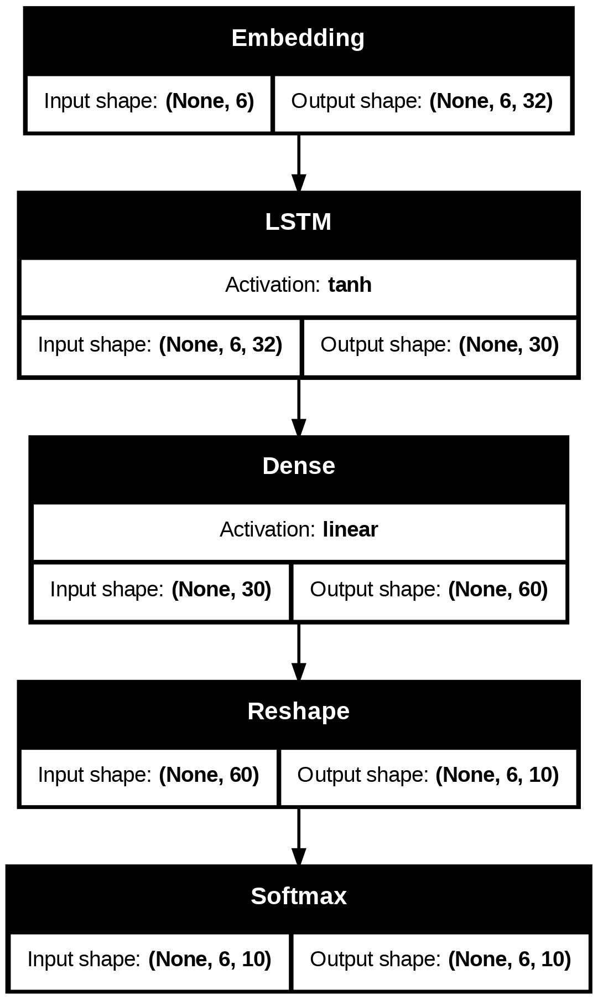

In [ ]:
import tensorflow as tf
MAX_WORDS = 6
model = tf.keras.models.Sequential()
model.add(tf.keras.layers.Input(shape=(MAX_WORDS,)))
model.add(tf.keras.layers.Embedding(VOCAB_SIZE, EMBEDDING_DIM))
model.add(tf.keras.layers.LSTM(HIDDEN_DIM))
model.add(tf.keras.layers.Dense(MAX_WORDS * TAGSET_SIZE))

model.add(tf.keras.layers.Reshape((MAX_WORDS, TAGSET_SIZE)))
model.add(tf.keras.layers.Softmax(axis=1))
model.summary()
tf.keras.utils.plot_model(model,show_shapes=True, show_layer_activations=True)

(15733, 6)
(15733, 6, 10)


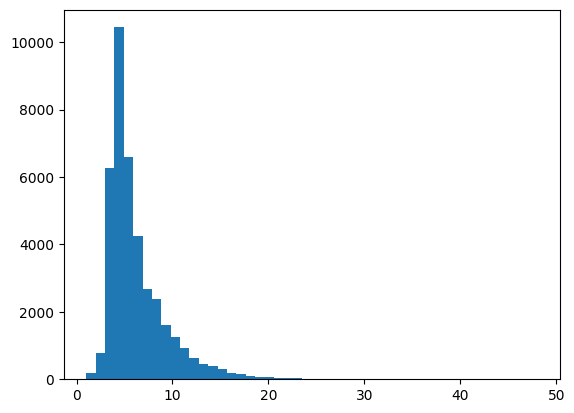

In [ ]:
encoded_recipe,encoded_tags=[],[]
p=[]
for i, (recipe, tags) in enumerate(training_data):
    p.append(len(recipe))
    if(len(recipe)>=MAX_WORDS):
        encoded_recipe.append (converter.words_to_index(recipe,max_words=MAX_WORDS))
        tags=converter.tags_to_index(tags,max_words=MAX_WORDS)
  #  print('tags:',tags.shape)
        encoded_tags.append(tf.keras.utils.to_categorical(tags,
                                                          num_classes=TAGSET_SIZE))
import matplotlib.pyplot as pp
pp.hist(p,bins=48)
encoded_recipe=np.array(encoded_recipe)
encoded_tags=np.array(encoded_tags)

print(encoded_recipe.shape)
print(encoded_tags.shape)

In [ ]:
model.compile(optimizer="adam", loss='categorical_crossentropy', metrics=[tf.keras.metrics.AUC(curve='PR')])
callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', mode='min', patience=3)

model.fit(encoded_recipe, encoded_tags, validation_split=0.2, epochs=100, callbacks=[callback])

Epoch 1/100
394/394 ━━━━━━━━━━━━━━━━━━━━ 18s 31ms/step - auc_5: 0.7592 - loss: 0.3170 - val_auc_5: 0.6983 - val_loss: 0.5064
Epoch 2/100
394/394 ━━━━━━━━━━━━━━━━━━━━ 13s 12ms/step - auc_5: 0.7318 - loss: 0.3125 - val_auc_5: 0.6798 - val_loss: 0.5132
Epoch 3/100
394/394 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - auc_5: 0.7081 - loss: 0.3091 - val_auc_5: 0.6544 - val_loss: 0.5224
Epoch 4/100
394/394 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - auc_5: 0.6858 - loss: 0.3021 - val_auc_5: 0.6308 - val_loss: 0.5182


In [ ]:
def predict_tags(model, converter, recipe):
    encoded_recipe = converter.words_to_index(recipe,max_words=MAX_WORDS)        # слово -> его номер в словаре
    er=np.array([encoded_recipe])
#    print('er:',encoded_recipe)
#    print('mp:',model.predict(er))
    encoded_tags   = np.argmax(model.predict(er,verbose=False),axis=-1)[0]     # предсказанные тэги (номера)
#   print('et:',encoded_tags)
#    return encoded_tags
    decoded_tags   = converter.indices_to_tags(encoded_tags) # номер тэга -> тэг
    return encoded_tags,decoded_tags

In [ ]:
yt_arr=[]
yp_arr=[]

for i in range(0,300):
    idx=np.random.randint(0,7000)
    recipe, tags = test_data[idx]
    if(len(recipe)>=MAX_WORDS):
        tags_pred,tags_pred_decoded    = predict_tags(model, converter, recipe)
        yp_arr+=tags_pred_decoded
        yt_arr+=tags[:len(tags_pred_decoded)]
        tags_pred=np.array(tags_pred)
        recipe=np.array(recipe)
        show_markup(recipe, tags)
        show_markup(recipe, converter.indices_to_tags(tags_pred))

from sklearn.metrics import confusion_matrix
confusion_matrix(yt_arr, yp_arr)

array([[59, 11,  4,  1,  3,  4, 15,  3, 11, 28],
       [ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0],
       [ 5,  4, 86,  0,  1,  3,  4, 10,  1,  0],
       [ 1,  3,  0, 89,  0,  0,  2,  0,  0,  0],
       [ 0,  0,  0,  0,  1,  0,  0,  0,  0,  0],
       [ 0,  0,  1,  0,  2, 65,  0,  0,  1,  1],
       [11,  0,  8,  2,  7,  2, 85,  5,  7,  3],
       [ 1,  0,  6,  0,  1,  6,  5, 43,  0,  2],
       [ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0],
       [ 7,  5,  0,  0,  4,  4,  5,  1,  2, 37]])

In [ ]:
!pip -m spacy download en_core_web_sm


Usage:   
  pip3 <command> [options]

no such option: -m


In [ ]:
import spacy
nlp = spacy.load("en_core_web_sm")
doc2 = nlp("Nasa administrator Jim Bridenstine says at the moment of launch, he was praying.")
for ent in doc2.ents:
    print('word:',ent.text, 'label:',ent.label_)
from spacy import displacy
displacy.render(doc2, style='ent', jupyter=True)

RuntimeError: Only a single TORCH_LIBRARY can be used to register the namespace prims; please put all of your definitions in a single TORCH_LIBRARY block.  If you were trying to specify implementations, consider using TORCH_LIBRARY_IMPL (which can be duplicated).  If you really intended to define operators for a single namespace in a distributed way, you can use TORCH_LIBRARY_FRAGMENT to explicitly indicate this.  Previous registration of TORCH_LIBRARY was registered at /usr/local/lib/python3.12/dist-packages/torch/_prims/__init__.py:37; latest registration was registered at /usr/local/lib/python3.12/dist-packages/torch/_prims/__init__.py:37

01.12.2025

Архитектура сетей глубокого обучения

Model: "vgg19"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_12 (InputLayer)     │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 224, 224, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 112, 112, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv4 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 28, 28, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv4 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv4 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 7, 7, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 25088)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc1 (Dense)                     │ (None, 4096)           │   102,764,544 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc2 (Dense)                     │ (None, 4096)           │    16,781,31

 Total params: 143,667,240 (548.05 MB)

 Trainable params: 143,667,240 (548.05 MB)

 Non-trainable params: 0 (0.00 B)

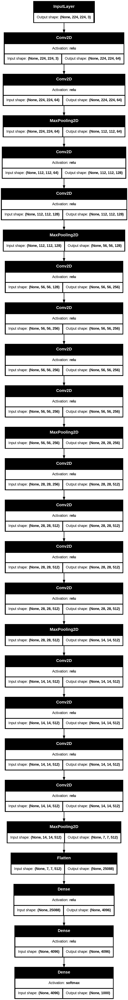

In [ ]:
import tensorflow as tf
model = tf.keras.applications.vgg19.VGG19(include_top=True, weights="imagenet", input_tensor=None, input_shape=None, pooling=None, classes=1000, classifier_activation='softmax')
model.summary()
tf.keras.utils.plot_model(model,show_shapes=True, show_layer_activations=True)

In [ ]:
labels={0: 'tench, Tinca tinca',
 1: 'goldfish, Carassius auratus',
 2: 'great white shark, white shark, man-eater, man-eating shark, Carcharodon carcharias',
 3: 'tiger shark, Galeocerdo cuvieri',
 4: 'hammerhead, hammerhead shark',
 5: 'electric ray, crampfish, numbfish, torpedo',
 6: 'stingray',
 7: 'cock',
 8: 'hen',
 9: 'ostrich, Struthio camelus',
 10: 'brambling, Fringilla montifringilla',
 11: 'goldfinch, Carduelis carduelis',
 12: 'house finch, linnet, Carpodacus mexicanus',
 13: 'junco, snowbird',
 14: 'indigo bunting, indigo finch, indigo bird, Passerina cyanea',
 15: 'robin, American robin, Turdus migratorius',
 16: 'bulbul',
 17: 'jay',
 18: 'magpie',
 19: 'chickadee',
 20: 'water ouzel, dipper',
 21: 'kite',
 22: 'bald eagle, American eagle, Haliaeetus leucocephalus',
 23: 'vulture',
 24: 'great grey owl, great gray owl, Strix nebulosa',
 25: 'European fire salamander, Salamandra salamandra',
 26: 'common newt, Triturus vulgaris',
 27: 'eft',
 28: 'spotted salamander, Ambystoma maculatum',
 29: 'axolotl, mud puppy, Ambystoma mexicanum',
 30: 'bullfrog, Rana catesbeiana',
 31: 'tree frog, tree-frog',
 32: 'tailed frog, bell toad, ribbed toad, tailed toad, Ascaphus trui',
 33: 'loggerhead, loggerhead turtle, Caretta caretta',
 34: 'leatherback turtle, leatherback, leathery turtle, Dermochelys coriacea',
 35: 'mud turtle',
 36: 'terrapin',
 37: 'box turtle, box tortoise',
 38: 'banded gecko',
 39: 'common iguana, iguana, Iguana iguana',
 40: 'American chameleon, anole, Anolis carolinensis',
 41: 'whiptail, whiptail lizard',
 42: 'agama',
 43: 'frilled lizard, Chlamydosaurus kingi',
 44: 'alligator lizard',
 45: 'Gila monster, Heloderma suspectum',
 46: 'green lizard, Lacerta viridis',
 47: 'African chameleon, Chamaeleo chamaeleon',
 48: 'Komodo dragon, Komodo lizard, dragon lizard, giant lizard, Varanus komodoensis',
 49: 'African crocodile, Nile crocodile, Crocodylus niloticus',
 50: 'American alligator, Alligator mississipiensis',
 51: 'triceratops',
 52: 'thunder snake, worm snake, Carphophis amoenus',
 53: 'ringneck snake, ring-necked snake, ring snake',
 54: 'hognose snake, puff adder, sand viper',
 55: 'green snake, grass snake',
 56: 'king snake, kingsnake',
 57: 'garter snake, grass snake',
 58: 'water snake',
 59: 'vine snake',
 60: 'night snake, Hypsiglena torquata',
 61: 'boa constrictor, Constrictor constrictor',
 62: 'rock python, rock snake, Python sebae',
 63: 'Indian cobra, Naja naja',
 64: 'green mamba',
 65: 'sea snake',
 66: 'horned viper, cerastes, sand viper, horned asp, Cerastes cornutus',
 67: 'diamondback, diamondback rattlesnake, Crotalus adamanteus',
 68: 'sidewinder, horned rattlesnake, Crotalus cerastes',
 69: 'trilobite',
 70: 'harvestman, daddy longlegs, Phalangium opilio',
 71: 'scorpion',
 72: 'black and gold garden spider, Argiope aurantia',
 73: 'barn spider, Araneus cavaticus',
 74: 'garden spider, Aranea diademata',
 75: 'black widow, Latrodectus mactans',
 76: 'tarantula',
 77: 'wolf spider, hunting spider',
 78: 'tick',
 79: 'centipede',
 80: 'black grouse',
 81: 'ptarmigan',
 82: 'ruffed grouse, partridge, Bonasa umbellus',
 83: 'prairie chicken, prairie grouse, prairie fowl',
 84: 'peacock',
 85: 'quail',
 86: 'partridge',
 87: 'African grey, African gray, Psittacus erithacus',
 88: 'macaw',
 89: 'sulphur-crested cockatoo, Kakatoe galerita, Cacatua galerita',
 90: 'lorikeet',
 91: 'coucal',
 92: 'bee eater',
 93: 'hornbill',
 94: 'hummingbird',
 95: 'jacamar',
 96: 'toucan',
 97: 'drake',
 98: 'red-breasted merganser, Mergus serrator',
 99: 'goose',
 100: 'black swan, Cygnus atratus',
 101: 'tusker',
 102: 'echidna, spiny anteater, anteater',
 103: 'platypus, duckbill, duckbilled platypus, duck-billed platypus, Ornithorhynchus anatinus',
 104: 'wallaby, brush kangaroo',
 105: 'koala, koala bear, kangaroo bear, native bear, Phascolarctos cinereus',
 106: 'wombat',
 107: 'jellyfish',
 108: 'sea anemone, anemone',
 109: 'brain coral',
 110: 'flatworm, platyhelminth',
 111: 'nematode, nematode worm, roundworm',
 112: 'conch',
 113: 'snail',
 114: 'slug',
115: 'sea slug, nudibranch',
 116: 'chiton, coat-of-mail shell, sea cradle, polyplacophore',
 117: 'chambered nautilus, pearly nautilus, nautilus',
 118: 'Dungeness crab, Cancer magister',
 119: 'rock crab, Cancer irroratus',
 120: 'fiddler crab',
 121: 'king crab, Alaska crab, Alaskan king crab, Alaska king crab, Paralithodes camtschatica',
 122: 'American lobster, Northern lobster, Maine lobster, Homarus americanus',
 123: 'spiny lobster, langouste, rock lobster, crawfish, crayfish, sea crawfish',
 124: 'crayfish, crawfish, crawdad, crawdaddy',
 125: 'hermit crab',
 126: 'isopod',
 127: 'white stork, Ciconia ciconia',
 128: 'black stork, Ciconia nigra',
 129: 'spoonbill',
 130: 'flamingo',
 131: 'little blue heron, Egretta caerulea',
 132: 'American egret, great white heron, Egretta albus',
 133: 'bittern',
 134: 'crane',
 135: 'limpkin, Aramus pictus',
 136: 'European gallinule, Porphyrio porphyrio',
 137: 'American coot, marsh hen, mud hen, water hen, Fulica americana',
 138: 'bustard',
 139: 'ruddy turnstone, Arenaria interpres',
 140: 'red-backed sandpiper, dunlin, Erolia alpina',
 141: 'redshank, Tringa totanus',
 142: 'dowitcher',
 143: 'oystercatcher, oyster catcher',
 144: 'pelican',
 145: 'king penguin, Aptenodytes patagonica',
 146: 'albatross, mollymawk',
 147: 'grey whale, gray whale, devilfish, Eschrichtius gibbosus, Eschrichtius robustus',
 148: 'killer whale, killer, orca, grampus, sea wolf, Orcinus orca',
 149: 'dugong, Dugong dugon',
 150: 'sea lion',
 151: 'Chihuahua',
 152: 'Japanese spaniel',
 153: 'Maltese dog, Maltese terrier, Maltese',
 154: 'Pekinese, Pekingese, Peke',
 155: 'Shih-Tzu',
 156: 'Blenheim spaniel',
 157: 'papillon',
 158: 'toy terrier',
 159: 'Rhodesian ridgeback',
 160: 'Afghan hound, Afghan',
 161: 'basset, basset hound',
 162: 'beagle',
 163: 'bloodhound, sleuthhound',
 164: 'bluetick',
 165: 'black-and-tan coonhound',
 166: 'Walker hound, Walker foxhound',
 167: 'English foxhound',
 168: 'redbone',
 169: 'borzoi, Russian wolfhound',
 170: 'Irish wolfhound',
 171: 'Italian greyhound',
 172: 'whippet',
 173: 'Ibizan hound, Ibizan Podenco',
 174: 'Norwegian elkhound, elkhound',
 175: 'otterhound, otter hound',
 176: 'Saluki, gazelle hound',
 177: 'Scottish deerhound, deerhound',
 178: 'Weimaraner',
 179: 'Staffordshire bullterrier, Staffordshire bull terrier',
 180: 'American Staffordshire terrier, Staffordshire terrier, American pit bull terrier, pit bull terrier',
 181: 'Bedlington terrier',
 182: 'Border terrier',
 183: 'Kerry blue terrier',
 184: 'Irish terrier',
 185: 'Norfolk terrier',
 186: 'Norwich terrier',
 187: 'Yorkshire terrier',
 188: 'wire-haired fox terrier',
 189: 'Lakeland terrier',
 190: 'Sealyham terrier, Sealyham',
 191: 'Airedale, Airedale terrier',
 192: 'cairn, cairn terrier',
 193: 'Australian terrier',
 194: 'Dandie Dinmont, Dandie Dinmont terrier',
 195: 'Boston bull, Boston terrier',
 196: 'miniature schnauzer',
 197: 'giant schnauzer',
 198: 'standard schnauzer',
 199: 'Scotch terrier, Scottish terrier, Scottie',
 200: 'Tibetan terrier, chrysanthemum dog',
 201: 'silky terrier, Sydney silky',
 202: 'soft-coated wheaten terrier',
 203: 'West Highland white terrier',
 204: 'Lhasa, Lhasa apso',
 205: 'flat-coated retriever',
 206: 'curly-coated retriever',
 207: 'golden retriever',
 208: 'Labrador retriever',
 209: 'Chesapeake Bay retriever',
 210: 'German short-haired pointer',
 211: 'vizsla, Hungarian pointer',
 212: 'English setter',
 213: 'Irish setter, red setter',
 214: 'Gordon setter',
 215: 'Brittany spaniel',
 216: 'clumber, clumber spaniel',
 217: 'English springer, English springer spaniel',
 218: 'Welsh springer spaniel',
 219: 'cocker spaniel, English cocker spaniel, cocker',
 220: 'Sussex spaniel',
 221: 'Irish water spaniel',
 222: 'kuvasz',
 223: 'schipperke',
 224: 'groenendael',
 225: 'malinois',
 226: 'briard',
 227: 'kelpie',
 228: 'komondor',
 229: 'Old English sheepdog, bobtail',
 230: 'Shetland sheepdog, Shetland sheep dog, Shetland',
 231: 'collie',
 232: 'Border collie',
 233: 'Bouvier des Flandres, Bouviers des Flandres',
234: 'Rottweiler',
 235: 'German shepherd, German shepherd dog, German police dog, alsatian',
 236: 'Doberman, Doberman pinscher',
 237: 'miniature pinscher',
 238: 'Greater Swiss Mountain dog',
 239: 'Bernese mountain dog',
 240: 'Appenzeller',
 241: 'EntleBucher',
 242: 'boxer',
 243: 'bull mastiff',
 244: 'Tibetan mastiff',
 245: 'French bulldog',
 246: 'Great Dane',
 247: 'Saint Bernard, St Bernard',
 248: 'Eskimo dog, husky',
 249: 'malamute, malemute, Alaskan malamute',
 250: 'Siberian husky',
 251: 'dalmatian, coach dog, carriage dog',
 252: 'affenpinscher, monkey pinscher, monkey dog',
 253: 'basenji',
 254: 'pug, pug-dog',
 255: 'Leonberg',
 256: 'Newfoundland, Newfoundland dog',
 257: 'Great Pyrenees',
 258: 'Samoyed, Samoyede',
 259: 'Pomeranian',
 260: 'chow, chow chow',
 261: 'keeshond',
 262: 'Brabancon griffon',
 263: 'Pembroke, Pembroke Welsh corgi',
 264: 'Cardigan, Cardigan Welsh corgi',
 265: 'toy poodle',
 266: 'miniature poodle',
 267: 'standard poodle',
 268: 'Mexican hairless',
 269: 'timber wolf, grey wolf, gray wolf, Canis lupus',
 270: 'white wolf, Arctic wolf, Canis lupus tundrarum',
 271: 'red wolf, maned wolf, Canis rufus, Canis niger',
 272: 'coyote, prairie wolf, brush wolf, Canis latrans',
 273: 'dingo, warrigal, warragal, Canis dingo',
 274: 'dhole, Cuon alpinus',
 275: 'African hunting dog, hyena dog, Cape hunting dog, Lycaon pictus',
 276: 'hyena, hyaena',
 277: 'red fox, Vulpes vulpes',
 278: 'kit fox, Vulpes macrotis',
 279: 'Arctic fox, white fox, Alopex lagopus',
 280: 'grey fox, gray fox, Urocyon cinereoargenteus',
 281: 'tabby, tabby cat',
 282: 'tiger cat',
 283: 'Persian cat',
 284: 'Siamese cat, Siamese',
 285: 'Egyptian cat',
 286: 'cougar, puma, catamount, mountain lion, painter, panther, Felis concolor',
 287: 'lynx, catamount',
 288: 'leopard, Panthera pardus',
 289: 'snow leopard, ounce, Panthera uncia',
 290: 'jaguar, panther, Panthera onca, Felis onca',
 291: 'lion, king of beasts, Panthera leo',
 292: 'tiger, Panthera tigris',
 293: 'cheetah, chetah, Acinonyx jubatus',
 294: 'brown bear, bruin, Ursus arctos',
 295: 'American black bear, black bear, Ursus americanus, Euarctos americanus',
 296: 'ice bear, polar bear, Ursus Maritimus, Thalarctos maritimus',
 297: 'sloth bear, Melursus ursinus, Ursus ursinus',
 298: 'mongoose',
 299: 'meerkat, mierkat',
 300: 'tiger beetle',
 301: 'ladybug, ladybeetle, lady beetle, ladybird, ladybird beetle',
 302: 'ground beetle, carabid beetle',
 303: 'long-horned beetle, longicorn, longicorn beetle',
 304: 'leaf beetle, chrysomelid',
 305: 'dung beetle',
 306: 'rhinoceros beetle',
 307: 'weevil',
 308: 'fly',
 309: 'bee',
 310: 'ant, emmet, pismire',
 311: 'grasshopper, hopper',
 312: 'cricket',
 313: 'walking stick, walkingstick, stick insect',
 314: 'cockroach, roach',
 315: 'mantis, mantid',
 316: 'cicada, cicala',
 317: 'leafhopper',
 318: 'lacewing, lacewing fly',
 319: "dragonfly, darning needle, devil's darning needle, sewing needle, snake feeder, snake doctor, mosquito hawk, skeeter hawk",
 320: 'damselfly',
 321: 'admiral',
 322: 'ringlet, ringlet butterfly',
 323: 'monarch, monarch butterfly, milkweed butterfly, Danaus plexippus',
 324: 'cabbage butterfly',
 325: 'sulphur butterfly, sulfur butterfly',
 326: 'lycaenid, lycaenid butterfly',
 327: 'starfish, sea star',
 328: 'sea urchin',
 329: 'sea cucumber, holothurian',
 330: 'wood rabbit, cottontail, cottontail rabbit',
 331: 'hare',
 332: 'Angora, Angora rabbit',
 333: 'hamster',
 334: 'porcupine, hedgehog',
 335: 'fox squirrel, eastern fox squirrel, Sciurus niger',
 336: 'marmot',
 337: 'beaver',
 338: 'guinea pig, Cavia cobaya',
 339: 'sorrel',
 340: 'zebra',
 341: 'hog, pig, grunter, squealer, Sus scrofa',
 342: 'wild boar, boar, Sus scrofa',
 343: 'warthog',
 344: 'hippopotamus, hippo, river horse, Hippopotamus amphibius',
 345: 'ox',
 346: 'water buffalo, water ox, Asiatic buffalo, Bubalus bubalis',
 347: 'bison',
 348: 'ram, tup',
 349: 'bighorn, bighorn sheep, cimarron, Rocky Mountain bighorn, Rocky Mountain sheep, Ovis canadensis',
 350: 'ibex, Capra ibex',
351: 'hartebeest',
 352: 'impala, Aepyceros melampus',
 353: 'gazelle',
 354: 'Arabian camel, dromedary, Camelus dromedarius',
 355: 'llama',
 356: 'weasel',
 357: 'mink',
 358: 'polecat, fitch, foulmart, foumart, Mustela putorius',
 359: 'black-footed ferret, ferret, Mustela nigripes',
 360: 'otter',
 361: 'skunk, polecat, wood pussy',
 362: 'badger',
 363: 'armadillo',
 364: 'three-toed sloth, ai, Bradypus tridactylus',
 365: 'orangutan, orang, orangutang, Pongo pygmaeus',
 366: 'gorilla, Gorilla gorilla',
 367: 'chimpanzee, chimp, Pan troglodytes',
 368: 'gibbon, Hylobates lar',
 369: 'siamang, Hylobates syndactylus, Symphalangus syndactylus',
 370: 'guenon, guenon monkey',
 371: 'patas, hussar monkey, Erythrocebus patas',
 372: 'baboon',
 373: 'macaque',
 374: 'langur',
 375: 'colobus, colobus monkey',
 376: 'proboscis monkey, Nasalis larvatus',
 377: 'marmoset',
 378: 'capuchin, ringtail, Cebus capucinus',
 379: 'howler monkey, howler',
 380: 'titi, titi monkey',
 381: 'spider monkey, Ateles geoffroyi',
 382: 'squirrel monkey, Saimiri sciureus',
 383: 'Madagascar cat, ring-tailed lemur, Lemur catta',
 384: 'indri, indris, Indri indri, Indri brevicaudatus',
 385: 'Indian elephant, Elephas maximus',
 386: 'African elephant, Loxodonta africana',
 387: 'lesser panda, red panda, panda, bear cat, cat bear, Ailurus fulgens',
 388: 'giant panda, panda, panda bear, coon bear, Ailuropoda melanoleuca',
 389: 'barracouta, snoek',
 390: 'eel',
 391: 'coho, cohoe, coho salmon, blue jack, silver salmon, Oncorhynchus kisutch',
 392: 'rock beauty, Holocanthus tricolor',
 393: 'anemone fish',
 394: 'sturgeon',
 395: 'gar, garfish, garpike, billfish, Lepisosteus osseus',
 396: 'lionfish',
 397: 'puffer, pufferfish, blowfish, globefish',
 398: 'abacus',
 399: 'abaya',
 400: "academic gown, academic robe, judge's robe",
 401: 'accordion, piano accordion, squeeze box',
 402: 'acoustic guitar',
 403: 'aircraft carrier, carrier, flattop, attack aircraft carrier',
 404: 'airliner',
 405: 'airship, dirigible',
 406: 'altar',
 407: 'ambulance',
 408: 'amphibian, amphibious vehicle',
 409: 'analog clock',
 410: 'apiary, bee house',
 411: 'apron',
 412: 'ashcan, trash can, garbage can, wastebin, ash bin, ash-bin, ashbin, dustbin, trash barrel, trash bin',
 413: 'assault rifle, assault gun',
 414: 'backpack, back pack, knapsack, packsack, rucksack, haversack',
 415: 'bakery, bakeshop, bakehouse',
 416: 'balance beam, beam',
 417: 'balloon',
 418: 'ballpoint, ballpoint pen, ballpen, Biro',
 419: 'Band Aid',
 420: 'banjo',
 421: 'bannister, banister, balustrade, balusters, handrail',
 422: 'barbell',
 423: 'barber chair',
 424: 'barbershop',
 425: 'barn',
 426: 'barometer',
 427: 'barrel, cask',
 428: 'barrow, garden cart, lawn cart, wheelbarrow',
 429: 'baseball',
 430: 'basketball',
 431: 'bassinet',
 432: 'bassoon',
 433: 'bathing cap, swimming cap',
 434: 'bath towel',
 435: 'bathtub, bathing tub, bath, tub',
 436: 'beach wagon, station wagon, wagon, estate car, beach waggon, station waggon, waggon',
 437: 'beacon, lighthouse, beacon light, pharos',
 438: 'beaker',
 439: 'bearskin, busby, shako',
 440: 'beer bottle',
 441: 'beer glass',
 442: 'bell cote, bell cot',
 443: 'bib',
 444: 'bicycle-built-for-two, tandem bicycle, tandem',
 445: 'bikini, two-piece',
 446: 'binder, ring-binder',
 447: 'binoculars, field glasses, opera glasses',
 448: 'birdhouse',
 449: 'boathouse',
 450: 'bobsled, bobsleigh, bob',
 451: 'bolo tie, bolo, bola tie, bola',
 452: 'bonnet, poke bonnet',
 453: 'bookcase',
 454: 'bookshop, bookstore, bookstall',
 455: 'bottlecap',
 456: 'bow',
 457: 'bow tie, bow-tie, bowtie',
 458: 'brass, memorial tablet, plaque',
 459: 'brassiere, bra, bandeau',
 460: 'breakwater, groin, groyne, mole, bulwark, seawall, jetty',
 461: 'breastplate, aegis, egis',
 462: 'broom',
 463: 'bucket, pail',
 464: 'buckle',
 465: 'bulletproof vest',
 466: 'bullet train, bullet',
 467: 'butcher shop, meat market',
 468: 'cab, hack, taxi, taxicab',
 469: 'caldron, cauldron',
 470: 'candle, taper, wax light',
 471: 'cannon',
 472: 'canoe',
473: 'can opener, tin opener',
 474: 'cardigan',
 475: 'car mirror',
 476: 'carousel, carrousel, merry-go-round, roundabout, whirligig',
 477: "carpenter's kit, tool kit",
 478: 'carton',
 479: 'car wheel',
 480: 'cash machine, cash dispenser, automated teller machine, automatic teller machine, automated teller, automatic teller, ATM',
 481: 'cassette',
 482: 'cassette player',
 483: 'castle',
 484: 'catamaran',
 485: 'CD player',
 486: 'cello, violoncello',
 487: 'cellular telephone, cellular phone, cellphone, cell, mobile phone',
 488: 'chain',
 489: 'chainlink fence',
 490: 'chain mail, ring mail, mail, chain armor, chain armour, ring armor, ring armour',
 491: 'chain saw, chainsaw',
 492: 'chest',
 493: 'chiffonier, commode',
 494: 'chime, bell, gong',
 495: 'china cabinet, china closet',
 496: 'Christmas stocking',
 497: 'church, church building',
 498: 'cinema, movie theater, movie theatre, movie house, picture palace',
 499: 'cleaver, meat cleaver, chopper',
 500: 'cliff dwelling',
 501: 'cloak',
 502: 'clog, geta, patten, sabot',
 503: 'cocktail shaker',
 504: 'coffee mug',
 505: 'coffeepot',
 506: 'coil, spiral, volute, whorl, helix',
 507: 'combination lock',
 508: 'computer keyboard, keypad',
 509: 'confectionery, confectionary, candy store',
 510: 'container ship, containership, container vessel',
 511: 'convertible',
 512: 'corkscrew, bottle screw',
 513: 'cornet, horn, trumpet, trump',
 514: 'cowboy boot',
 515: 'cowboy hat, ten-gallon hat',
 516: 'cradle',
 517: 'crane',
 518: 'crash helmet',
 519: 'crate',
 520: 'crib, cot',
 521: 'Crock Pot',
 522: 'croquet ball',
 523: 'crutch',
 524: 'cuirass',
 525: 'dam, dike, dyke',
 526: 'desk',
 527: 'desktop computer',
 528: 'dial telephone, dial phone',
 529: 'diaper, nappy, napkin',
 530: 'digital clock',
 531: 'digital watch',
 532: 'dining table, board',
 533: 'dishrag, dishcloth',
 534: 'dishwasher, dish washer, dishwashing machine',
 535: 'disk brake, disc brake',
 536: 'dock, dockage, docking facility',
 537: 'dogsled, dog sled, dog sleigh',
 538: 'dome',
 539: 'doormat, welcome mat',
 540: 'drilling platform, offshore rig',
 541: 'drum, membranophone, tympan',
 542: 'drumstick',
 543: 'dumbbell',
 544: 'Dutch oven',
 545: 'electric fan, blower',
 546: 'electric guitar',
 547: 'electric locomotive',
 548: 'entertainment center',
 549: 'envelope',
 550: 'espresso maker',
 551: 'face powder',
 552: 'feather boa, boa',
 553: 'file, file cabinet, filing cabinet',
 554: 'fireboat',
 555: 'fire engine, fire truck',
 556: 'fire screen, fireguard',
 557: 'flagpole, flagstaff',
 558: 'flute, transverse flute',
 559: 'folding chair',
 560: 'football helmet',
 561: 'forklift',
 562: 'fountain',
 563: 'fountain pen',
 564: 'four-poster',
 565: 'freight car',
 566: 'French horn, horn',
 567: 'frying pan, frypan, skillet',
 568: 'fur coat',
 569: 'garbage truck, dustcart',
 570: 'gasmask, respirator, gas helmet',
 571: 'gas pump, gasoline pump, petrol pump, island dispenser',
 572: 'goblet',
 573: 'go-kart',
 574: 'golf ball',
 575: 'golfcart, golf cart',
 576: 'gondola',
 577: 'gong, tam-tam',
 578: 'gown',
 579: 'grand piano, grand',
 580: 'greenhouse, nursery, glasshouse',
 581: 'grille, radiator grille',
 582: 'grocery store, grocery, food market, market',
 583: 'guillotine',
 584: 'hair slide',
 585: 'hair spray',
 586: 'half track',
 587: 'hammer',
 588: 'hamper',
 589: 'hand blower, blow dryer, blow drier, hair dryer, hair drier',
 590: 'hand-held computer, hand-held microcomputer',
 591: 'handkerchief, hankie, hanky, hankey',
 592: 'hard disc, hard disk, fixed disk',
 593: 'harmonica, mouth organ, harp, mouth harp',
 594: 'harp',
 595: 'harvester, reaper',
 596: 'hatchet',
 597: 'holster',
 598: 'home theater, home theatre',
 599: 'honeycomb',
 600: 'hook, claw',
 601: 'hoopskirt, crinoline',
 602: 'horizontal bar, high bar',
 603: 'horse cart, horse-cart',
 604: 'hourglass',
 605: 'iPod',
 606: 'iron, smoothing iron',
 607: "jack-o'-lantern",
 608: 'jean, blue jean, denim',
 609: 'jeep, landrover',
 610: 'jersey, T-shirt, tee shirt',
 611: 'jigsaw puzzle',
612: 'jinrikisha, ricksha, rickshaw',
 613: 'joystick',
 614: 'kimono',
 615: 'knee pad',
 616: 'knot',
 617: 'lab coat, laboratory coat',
 618: 'ladle',
 619: 'lampshade, lamp shade',
 620: 'laptop, laptop computer',
 621: 'lawn mower, mower',
 622: 'lens cap, lens cover',
 623: 'letter opener, paper knife, paperknife',
 624: 'library',
 625: 'lifeboat',
 626: 'lighter, light, igniter, ignitor',
 627: 'limousine, limo',
 628: 'liner, ocean liner',
 629: 'lipstick, lip rouge',
 630: 'Loafer',
 631: 'lotion',
 632: 'loudspeaker, speaker, speaker unit, loudspeaker system, speaker system',
 633: "loupe, jeweler's loupe",
 634: 'lumbermill, sawmill',
 635: 'magnetic compass',
 636: 'mailbag, postbag',
 637: 'mailbox, letter box',
 638: 'maillot',
 639: 'maillot, tank suit',
 640: 'manhole cover',
 641: 'maraca',
 642: 'marimba, xylophone',
 643: 'mask',
 644: 'matchstick',
 645: 'maypole',
 646: 'maze, labyrinth',
 647: 'measuring cup',
 648: 'medicine chest, medicine cabinet',
 649: 'megalith, megalithic structure',
 650: 'microphone, mike',
 651: 'microwave, microwave oven',
 652: 'military uniform',
 653: 'milk can',
 654: 'minibus',
 655: 'miniskirt, mini',
 656: 'minivan',
 657: 'missile',
 658: 'mitten',
 659: 'mixing bowl',
 660: 'mobile home, manufactured home',
 661: 'Model T',
 662: 'modem',
 663: 'monastery',
 664: 'monitor',
 665: 'moped',
 666: 'mortar',
 667: 'mortarboard',
 668: 'mosque',
 669: 'mosquito net',
 670: 'motor scooter, scooter',
 671: 'mountain bike, all-terrain bike, off-roader',
 672: 'mountain tent',
 673: 'mouse, computer mouse',
 674: 'mousetrap',
 675: 'moving van',
 676: 'muzzle',
 677: 'nail',
 678: 'neck brace',
 679: 'necklace',
 680: 'nipple',
 681: 'notebook, notebook computer',
 682: 'obelisk',
 683: 'oboe, hautboy, hautbois',
 684: 'ocarina, sweet potato',
 685: 'odometer, hodometer, mileometer, milometer',
 686: 'oil filter',
 687: 'organ, pipe organ',
 688: 'oscilloscope, scope, cathode-ray oscilloscope, CRO',
 689: 'overskirt',
 690: 'oxcart',
 691: 'oxygen mask',
 692: 'packet',
 693: 'paddle, boat paddle',
 694: 'paddlewheel, paddle wheel',
 695: 'padlock',
 696: 'paintbrush',
 697: "pajama, pyjama, pj's, jammies",
 698: 'palace',
 699: 'panpipe, pandean pipe, syrinx',
 700: 'paper towel',
 701: 'parachute, chute',
 702: 'parallel bars, bars',
 703: 'park bench',
 704: 'parking meter',
 705: 'passenger car, coach, carriage',
 706: 'patio, terrace',
 707: 'pay-phone, pay-station',
 708: 'pedestal, plinth, footstall',
 709: 'pencil box, pencil case',
 710: 'pencil sharpener',
 711: 'perfume, essence',
 712: 'Petri dish',
 713: 'photocopier',
 714: 'pick, plectrum, plectron',
 715: 'pickelhaube',
 716: 'picket fence, paling',
 717: 'pickup, pickup truck',
 718: 'pier',
 719: 'piggy bank, penny bank',
 720: 'pill bottle',
 721: 'pillow',
 722: 'ping-pong ball',
 723: 'pinwheel',
 724: 'pirate, pirate ship',
 725: 'pitcher, ewer',
 726: "plane, carpenter's plane, woodworking plane",
 727: 'planetarium',
 728: 'plastic bag',
 729: 'plate rack',
 730: 'plow, plough',
 731: "plunger, plumber's helper",
 732: 'Polaroid camera, Polaroid Land camera',
 733: 'pole',
 734: 'police van, police wagon, paddy wagon, patrol wagon, wagon, black Maria',
 735: 'poncho',
 736: 'pool table, billiard table, snooker table',
 737: 'pop bottle, soda bottle',
 738: 'pot, flowerpot',
 739: "potter's wheel",
 740: 'power drill',
 741: 'prayer rug, prayer mat',
 742: 'printer',
 743: 'prison, prison house',
 744: 'projectile, missile',
 745: 'projector',
 746: 'puck, hockey puck',
 747: 'punching bag, punch bag, punching ball, punchball',
 748: 'purse',
 749: 'quill, quill pen',
 750: 'quilt, comforter, comfort, puff',
 751: 'racer, race car, racing car',
 752: 'racket, racquet',
 753: 'radiator',
 754: 'radio, wireless',
 755: 'radio telescope, radio reflector',
 756: 'rain barrel',
 757: 'recreational vehicle, RV, R.V.',
 758: 'reel',
 759: 'reflex camera',
 760: 'refrigerator, icebox',
 761: 'remote control, remote',
 762: 'restaurant, eating house, eating place, eatery',
763: 'revolver, six-gun, six-shooter',
 764: 'rifle',
 765: 'rocking chair, rocker',
 766: 'rotisserie',
 767: 'rubber eraser, rubber, pencil eraser',
 768: 'rugby ball',
 769: 'rule, ruler',
 770: 'running shoe',
 771: 'safe',
 772: 'safety pin',
 773: 'saltshaker, salt shaker',
 774: 'sandal',
 775: 'sarong',
 776: 'sax, saxophone',
 777: 'scabbard',
 778: 'scale, weighing machine',
 779: 'school bus',
 780: 'schooner',
 781: 'scoreboard',
 782: 'screen, CRT screen',
 783: 'screw',
 784: 'screwdriver',
 785: 'seat belt, seatbelt',
 786: 'sewing machine',
 787: 'shield, buckler',
 788: 'shoe shop, shoe-shop, shoe store',
 789: 'shoji',
 790: 'shopping basket',
 791: 'shopping cart',
 792: 'shovel',
 793: 'shower cap',
 794: 'shower curtain',
 795: 'ski',
 796: 'ski mask',
 797: 'sleeping bag',
 798: 'slide rule, slipstick',
 799: 'sliding door',
 800: 'slot, one-armed bandit',
 801: 'snorkel',
 802: 'snowmobile',
 803: 'snowplow, snowplough',
 804: 'soap dispenser',
 805: 'soccer ball',
 806: 'sock',
 807: 'solar dish, solar collector, solar furnace',
 808: 'sombrero',
 809: 'soup bowl',
 810: 'space bar',
 811: 'space heater',
 812: 'space shuttle',
 813: 'spatula',
 814: 'speedboat',
 815: "spider web, spider's web",
 816: 'spindle',
 817: 'sports car, sport car',
 818: 'spotlight, spot',
 819: 'stage',
 820: 'steam locomotive',
 821: 'steel arch bridge',
 822: 'steel drum',
 823: 'stethoscope',
 824: 'stole',
 825: 'stone wall',
 826: 'stopwatch, stop watch',
 827: 'stove',
 828: 'strainer',
 829: 'streetcar, tram, tramcar, trolley, trolley car',
 830: 'stretcher',
 831: 'studio couch, day bed',
 832: 'stupa, tope',
 833: 'submarine, pigboat, sub, U-boat',
 834: 'suit, suit of clothes',
 835: 'sundial',
 836: 'sunglass',
 837: 'sunglasses, dark glasses, shades',
 838: 'sunscreen, sunblock, sun blocker',
 839: 'suspension bridge',
 840: 'swab, swob, mop',
 841: 'sweatshirt',
 842: 'swimming trunks, bathing trunks',
 843: 'swing',
 844: 'switch, electric switch, electrical switch',
 845: 'syringe',
 846: 'table lamp',
 847: 'tank, army tank, armored combat vehicle, armoured combat vehicle',
 848: 'tape player',
 849: 'teapot',
 850: 'teddy, teddy bear',
 851: 'television, television system',
 852: 'tennis ball',
 853: 'thatch, thatched roof',
 854: 'theater curtain, theatre curtain',
 855: 'thimble',
 856: 'thresher, thrasher, threshing machine',
 857: 'throne',
 858: 'tile roof',
 859: 'toaster',
 860: 'tobacco shop, tobacconist shop, tobacconist',
 861: 'toilet seat',
 862: 'torch',
 863: 'totem pole',
 864: 'tow truck, tow car, wrecker',
 865: 'toyshop',
 866: 'tractor',
 867: 'trailer truck, tractor trailer, trucking rig, rig, articulated lorry, semi',
 868: 'tray',
 869: 'trench coat',
 870: 'tricycle, trike, velocipede',
 871: 'trimaran',
 872: 'tripod',
 873: 'triumphal arch',
 874: 'trolleybus, trolley coach, trackless trolley',
 875: 'trombone',
 876: 'tub, vat',
 877: 'turnstile',
 878: 'typewriter keyboard',
 879: 'umbrella',
 880: 'unicycle, monocycle',
 881: 'upright, upright piano',
 882: 'vacuum, vacuum cleaner',
 883: 'vase',
 884: 'vault',
 885: 'velvet',
 886: 'vending machine',
 887: 'vestment',
 888: 'viaduct',
 889: 'violin, fiddle',
 890: 'volleyball',
 891: 'waffle iron',
 892: 'wall clock',
 893: 'wallet, billfold, notecase, pocketbook',
 894: 'wardrobe, closet, press',
 895: 'warplane, military plane',
 896: 'washbasin, handbasin, washbowl, lavabo, wash-hand basin',
 897: 'washer, automatic washer, washing machine',
 898: 'water bottle',
 899: 'water jug',
 900: 'water tower',
 901: 'whiskey jug',
 902: 'whistle',
 903: 'wig',
 904: 'window screen',
 905: 'window shade',
 906: 'Windsor tie',
 907: 'wine bottle',
 908: 'wing',
 909: 'wok',
 910: 'wooden spoon',
 911: 'wool, woolen, woollen',
 912: 'worm fence, snake fence, snake-rail fence, Virginia fence',
 913: 'wreck',
 914: 'yawl',
 915: 'yurt',
 916: 'web site, website, internet site, site',
 917: 'comic book',
 918: 'crossword puzzle, crossword',
 919: 'street sign',
 920: 'traffic light, traffic signal, stoplight',
921: 'book jacket, dust cover, dust jacket, dust wrapper',
 922: 'menu',
 923: 'plate',
 924: 'guacamole',
 925: 'consomme',
 926: 'hot pot, hotpot',
 927: 'trifle',
 928: 'ice cream, icecream',
 929: 'ice lolly, lolly, lollipop, popsicle',
 930: 'French loaf',
 931: 'bagel, beigel',
 932: 'pretzel',
 933: 'cheeseburger',
 934: 'hotdog, hot dog, red hot',
 935: 'mashed potato',
 936: 'head cabbage',
 937: 'broccoli',
 938: 'cauliflower',
 939: 'zucchini, courgette',
 940: 'spaghetti squash',
 941: 'acorn squash',
 942: 'butternut squash',
 943: 'cucumber, cuke',
 944: 'artichoke, globe artichoke',
 945: 'bell pepper',
 946: 'cardoon',
 947: 'mushroom',
 948: 'Granny Smith',
 949: 'strawberry',
 950: 'orange',
 951: 'lemon',
 952: 'fig',
 953: 'pineapple, ananas',
 954: 'banana',
 955: 'jackfruit, jak, jack',
 956: 'custard apple',
 957: 'pomegranate',
 958: 'hay',
 959: 'carbonara',
 960: 'chocolate sauce, chocolate syrup',
 961: 'dough',
 962: 'meat loaf, meatloaf',
 963: 'pizza, pizza pie',
 964: 'potpie',
 965: 'burrito',
 966: 'red wine',
 967: 'espresso',
 968: 'cup',
 969: 'eggnog',
 970: 'alp',
 971: 'bubble',
 972: 'cliff, drop, drop-off',
 973: 'coral reef',
 974: 'geyser',
 975: 'lakeside, lakeshore',
 976: 'promontory, headland, head, foreland',
 977: 'sandbar, sand bar',
 978: 'seashore, coast, seacoast, sea-coast',
 979: 'valley, vale',
 980: 'volcano',
 981: 'ballplayer, baseball player',
 982: 'groom, bridegroom',
 983: 'scuba diver',
 984: 'rapeseed',
 985: 'daisy',
 986: "yellow lady's slipper, yellow lady-slipper, Cypripedium calceolus, Cypripedium parviflorum",
 987: 'corn',
 988: 'acorn',
 989: 'hip, rose hip, rosehip',
 990: 'buckeye, horse chestnut, conker',
 991: 'coral fungus',
 992: 'agaric',
 993: 'gyromitra',
 994: 'stinkhorn, carrion fungus',
 995: 'earthstar',
 996: 'hen-of-the-woods, hen of the woods, Polyporus frondosus, Grifola frondosa',
 997: 'bolete',
 998: 'ear, spike, capitulum',
 999: 'toilet tissue, toilet paper, bathroom tissue'}

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step
kimono 0.46436536


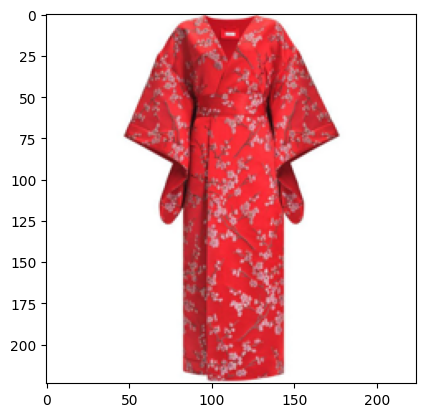

In [ ]:
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
img2 = Image.open("kimono2.jpg")
img3 = img2.resize((224, 224))
iarr = tf.keras.utils.img_to_array(img3)
plt.imshow(img3)
iarr2 = iarr.reshape((1, 224, 224, 3))
output = model.predict(iarr2)
print(labels[output.argmax(axis=1)[0]], output.max(axis=1)[0])

In [ ]:
import tensorflow as tf

model = tf.keras.applications.resnet50.ResNet50(
    include_top=True, weights='imagenet', input_tensor=None,
    input_shape=None, pooling=None, classes=1000,
    classifier_activation='softmax'
)

model.summary()

Model: "resnet50"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_13      │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_pad           │ (None, 230, 230,  │          0 │ input_layer_13[0… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,472 │ conv1_pad[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pad           │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pool          │ (None, 56, 56,    │          0 │ pool1_pad[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      4,160 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        256 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,928 │ conv2_block1_1_r… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_bn   │ (None, 56, 56,    │        256 │ conv2_block1_2_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_relu │ (None, 56, 56,    │          0 │ conv2_block1_2_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_conv │ (None, 56, 56,    │     16,640 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_conv │ (None, 56, 56,    │     16,640 │ conv2_block1_2_r… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_0_c… │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_3_c

 Total params: 25,636,712 (97.80 MB)

 Trainable params: 25,583,592 (97.59 MB)

 Non-trainable params: 53,120 (207.50 KB)

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 742ms/step
kimono 0.46436536


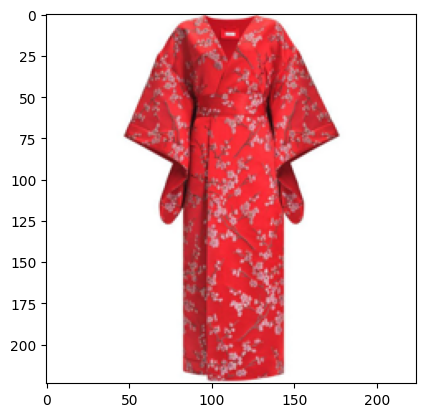

In [ ]:
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
img2 = Image.open("kimono2.jpg")
img3 = img2.resize((224, 224))
iarr = tf.keras.utils.img_to_array(img3)
plt.imshow(img3)
iarr2 = iarr.reshape((1, 224, 224, 3))
output = model.predict(iarr2)
print(labels[output.argmax(axis=1)[0]], output.max(axis=1)[0])

In [ ]:
import tensorflow as tf

model = tf.keras.applications.inception_v3.InceptionV3(
    include_top=True, weights='imagenet', input_tensor=None,
    input_shape=None, pooling=None, classes=1000,
    classifier_activation='softmax'
)

model.summary()

Model: "inception_v3"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_10      │ (None, 299, 299,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_282 (Conv2D) │ (None, 149, 149,  │        864 │ input_layer_10[0… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 149, 149,  │         96 │ conv2d_282[0][0]  │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_282      │ (None, 149, 149,  │          0 │ batch_normalizat… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_283 (Conv2D) │ (None, 147, 147,  │      9,216 │ activation_282[0… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 147, 147,  │         96 │ conv2d_283[0][0]  │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_283      │ (None, 147, 147,  │          0 │ batch_normalizat… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_284 (Conv2D) │ (None, 147, 147,  │     18,432 │ activation_283[0… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 147, 147,  │        192 │ conv2d_284[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_284      │ (None, 147, 147,  │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_12    │ (None, 73, 73,    │          0 │ activation_284[0… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_285 (Conv2D) │ (None, 73, 73,    │      5,120 │ max_pooling2d_12… │
│                     │ 80)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 73, 73,    │        240 │ conv2d_285[0][0]  │
│ (BatchNormalizatio… │ 80)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_285      │ (None, 73, 73,    │          0 │ batch_normalizat… │
│ (Activation)        │ 80)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_286 (Conv2D) │ (None, 71, 71,    │    138,240 │ activation_285[0… │
│                     │ 192)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 71, 71,    │        576 │ conv2d_286[0][0]  │
│ (BatchNormalizatio… │ 192)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_286      │ (None, 71, 71,    │          0 │ batch_normalizat

 Total params: 23,851,784 (90.99 MB)

 Trainable params: 23,817,352 (90.86 MB)

 Non-trainable params: 34,432 (134.50 KB)

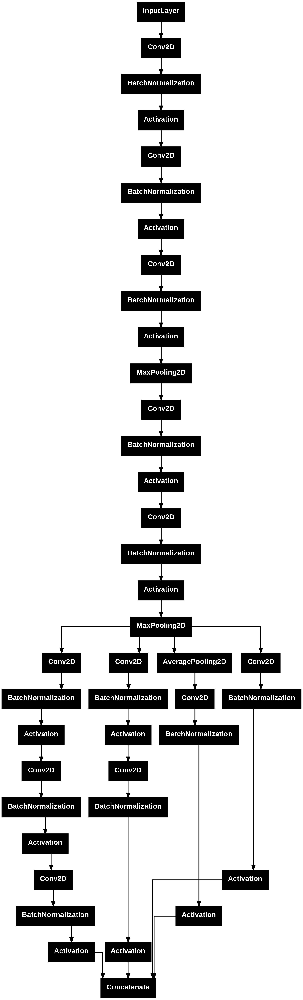

In [ ]:
input_tensor = model.input
output_tensor = model.get_layer('mixed0').output  # Choose an early layer
submodel = tf.keras.Model(inputs=input_tensor, outputs=output_tensor)

tf.keras.utils.plot_model(submodel)

13.12.2025

11490434/11490434 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


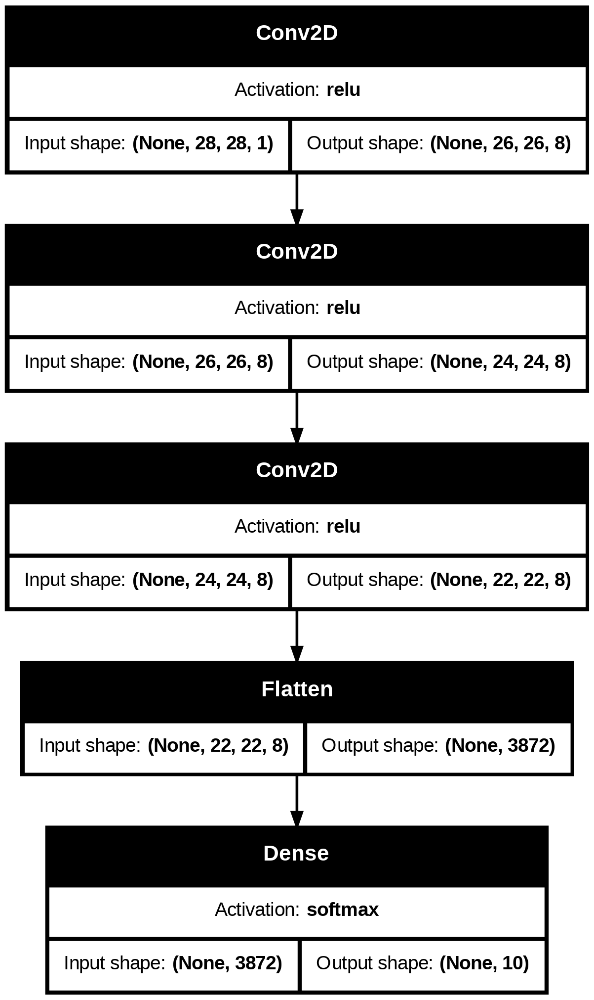

In [ ]:
import tensorflow as tf
from tensorflow.keras import layers, models
import numpy as np
(x_train, y_train), (x_test, y_test) = tf.keras.datasets.mnist.load_data()
x_train = np.expand_dims(x_train, -1)  # Add channel dimension
#x_test = np.expand_dims(x_test, -1)
y_train = tf.keras.utils.to_categorical(y_train, 10)
#y_test = tf.keras.utils.to_categorical(y_test, 10)
model = models.Sequential([
    layers.Input(shape=(28, 28, 1)),
    layers.Conv2D(8, (3, 3), activation='relu'),
    layers.Conv2D(8, (3, 3), activation='relu'),
    layers.Conv2D(8, (3, 3), activation='relu'),
    layers.Flatten(),
    layers.Dense(10, activation='softmax')  # 10 classes for digits 0-9
])
model.compile(optimizer='adam',loss='categorical_crossentropy',metrics=['accuracy'])
tf.keras.utils.plot_model(model,show_shapes=True,show_layer_activations=True)

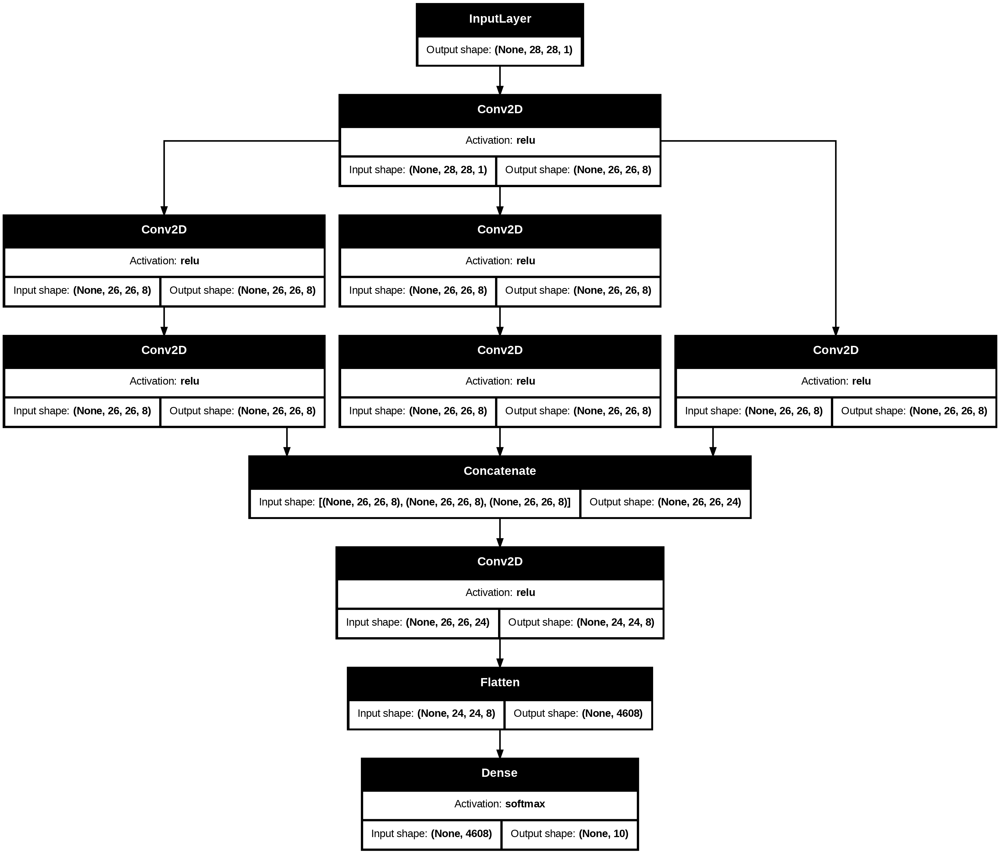

In [ ]:
import tensorflow as tf
from tensorflow.keras import layers, models
import numpy as np
(x_train, y_train), (x_test, y_test) = tf.keras.datasets.mnist.load_data()
x_train = np.expand_dims(x_train, -1)  # Add channel dimension
x_test = np.expand_dims(x_test, -1)
y_train = tf.keras.utils.to_categorical(y_train, 10)
y_test = tf.keras.utils.to_categorical(y_test, 10)
inp = layers.Input(shape=(28, 28, 1))
x=layers.Conv2D(8, (3, 3), activation='relu')(inp)
x2=layers.Conv2D(8, (1, 1), activation='relu', padding='same')(x)
x2=layers.Conv2D(8, (3, 3), activation='relu', padding='same')(x2)
x3=layers.Conv2D(8, (1, 1), activation='relu', padding='same')(x)
x3=layers.Conv2D(8, (5, 5), activation='relu', padding='same')(x3)
x4 = layers.Conv2D(8, (3, 3), activation='relu', padding='same')(x)
x = tf.keras.layers.Concatenate()([x2, x3, x4])
x=layers.Conv2D(8, (3, 3), activation='relu')(x)
x=layers.Flatten()(x)
out=layers.Dense(10, activation='softmax')(x)  # 10 classes for digits 0-9
model = tf.keras.models.Model(inputs=[inp], outputs=[out])
model.compile(optimizer='adam',loss='categorical_crossentropy',metrics=['accuracy'])
tf.keras.utils.plot_model(model,show_shapes=True,show_layer_activations=True)

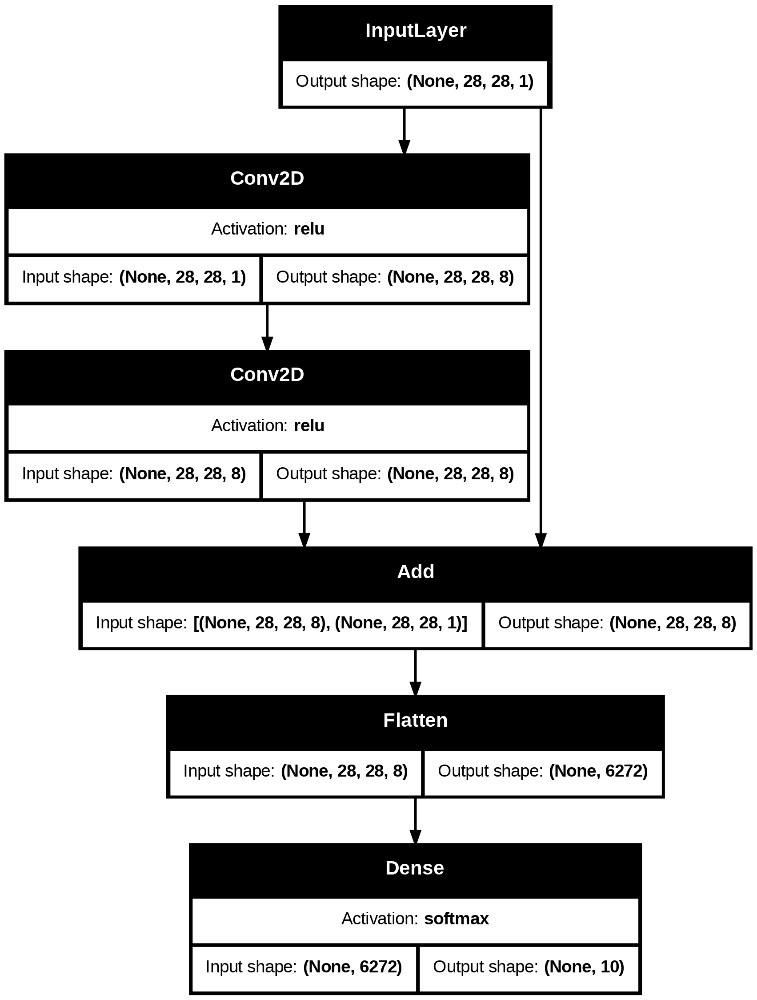

In [ ]:
import tensorflow as tf
from tensorflow.keras import layers, models
import numpy as np
(x_train, y_train), (x_test, y_test) = tf.keras.datasets.mnist.load_data()
x_train = np.expand_dims(x_train, -1)  # Add channel dimension
x_test = np.expand_dims(x_test, -1)
y_train = tf.keras.utils.to_categorical(y_train, 10)
y_test = tf.keras.utils.to_categorical(y_test, 10)
inp = layers.Input(shape=(28, 28, 1))
x=layers.Conv2D(8, (1, 1), activation='relu')(inp)
x2=layers.Conv2D(8, (3, 3), activation='relu', padding='same')(x)
x=layers.Flatten()(x2 + inp)
out=layers.Dense(10, activation='softmax')(x)  # 10 classes for digits 0-9
model = tf.keras.models.Model(inputs=[inp], outputs=[out])
model.compile(optimizer='adam',loss='categorical_crossentropy',metrics=['accuracy'])
tf.keras.utils.plot_model(model,show_shapes=True,show_layer_activations=True)

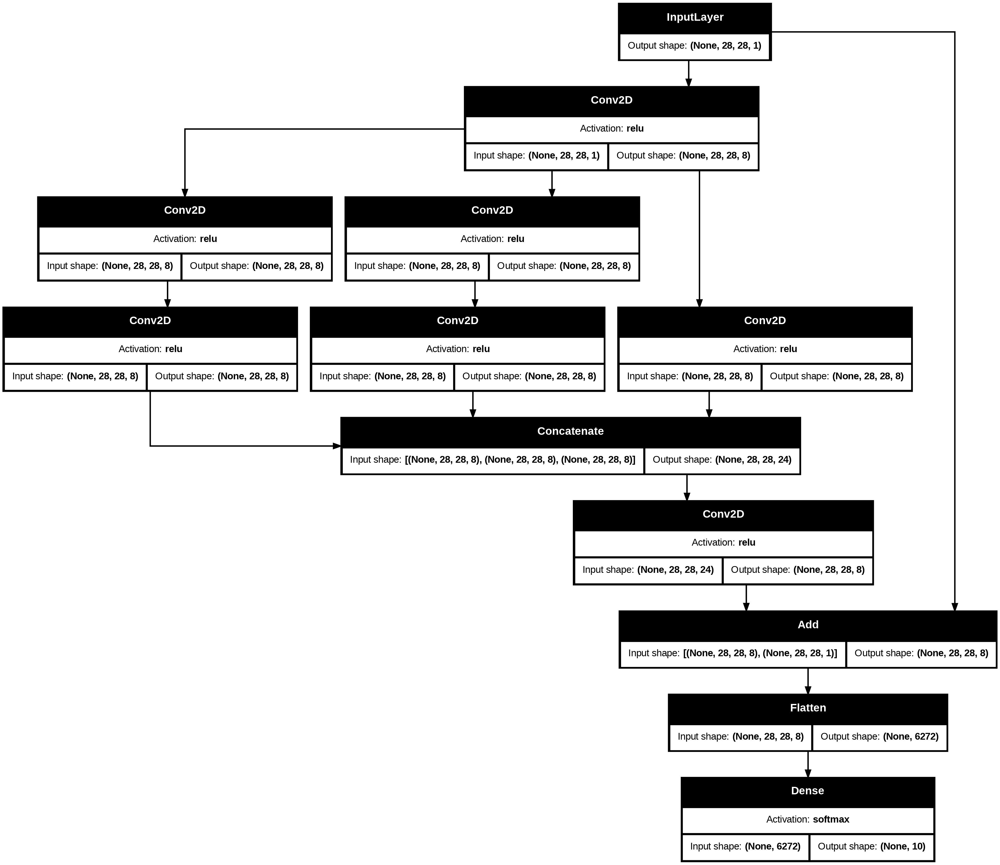

In [ ]:
import tensorflow as tf
from tensorflow.keras import layers, models
import numpy as np

(x_train, y_train), (x_test, y_test) = tf.keras.datasets.mnist.load_data()
x_train = np.expand_dims(x_train, -1)
x_test = np.expand_dims(x_test, -1)
y_train = tf.keras.utils.to_categorical(y_train, 10)
y_test = tf.keras.utils.to_categorical(y_test, 10)

inp = layers.Input(shape=(28, 28, 1))
x = layers.Conv2D(8, (3, 3), activation='relu', padding='same')(inp)

x2 = layers.Conv2D(8, (1, 1), activation='relu', padding='same')(x)
x2 = layers.Conv2D(8, (3, 3), activation='relu', padding='same')(x2)

x3 = layers.Conv2D(8, (1, 1), activation='relu', padding='same')(x)
x3 = layers.Conv2D(8, (5, 5), activation='relu', padding='same')(x3)

x4 = layers.Conv2D(8, (3, 3), activation='relu', padding='same')(x)

conc = tf.keras.layers.Concatenate()([x2, x3, x4])
x = layers.Conv2D(8, (3, 3), activation='relu', padding='same')(conc)

x = layers.Add()([x, inp])

x = layers.Flatten()(x)
out = layers.Dense(10, activation='softmax')(x)

model = tf.keras.models.Model(inputs=[inp], outputs=[out])
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
tf.keras.utils.plot_model(model, show_shapes=True, show_layer_activations=True)

In [ ]:
model.fit(x_train, y_train, validation_split=0.2, epochs=100)

Epoch 1/100
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 137s 90ms/step - accuracy: 0.8149 - loss: 35.4356 - val_accuracy: 0.8966 - val_loss: 30.6457
Epoch 2/100
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 145s 92ms/step - accuracy: 0.9207 - loss: 25.0316 - val_accuracy: 0.9364 - val_loss: 27.1154
Epoch 3/100
 999/1500 ━━━━━━━━━━━━━━━━━━━━ 42s 85ms/step - accuracy: 0.9516 - loss: 18.6398

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/IPython/core/interactiveshell.py", line 3553, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "/tmp/ipython-input-1972979446.py", line 1, in <cell line: 0>
    model.fit(x_train, y_train, validation_split=0.2, epochs=100)
  File "/usr/local/lib/python3.12/dist-packages/keras/src/utils/traceback_utils.py", line 117, in error_handler
    return fn(*args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/keras/src/backend/tensorflow/trainer.py", line 377, in fit
    logs = self.train_function(iterator)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/keras/src/backend/tensorflow/trainer.py", line 220, in function
    opt_outputs = multi_step_on_iterator(iterator)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/tensorflow/python/util/traceback_utils.py", l

TypeError: object of type 'NoneType' has no len()

In [ ]:
_, test_acc = model.evaluate(x_test, y_test, verbose=0)
print(f"\nИтоговый скор на тестовых данных: Точность = {test_acc}")


Итоговый скор на тестовых данных: Точность = 0.958899974822998


Перенос обучения

In [ ]:
import tensorflow as tf
import matplotlib.pyplot as plt
fashion_mnist = tf.keras.datasets.fashion_mnist
(train_images, train_labels), (test_images, test_labels)  \
 = fashion_mnist.load_data()
import matplotlib.pyplot as pp
print('labels:',set(train_labels))

29515/29515 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
26421880/26421880 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
5148/5148 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
4422102/4422102 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
labels: {np.uint8(0), np.uint8(1), np.uint8(2), np.uint8(3), np.uint8(4), np.uint8(5), np.uint8(6), np.uint8(7), np.uint8(8), np.uint8(9)}


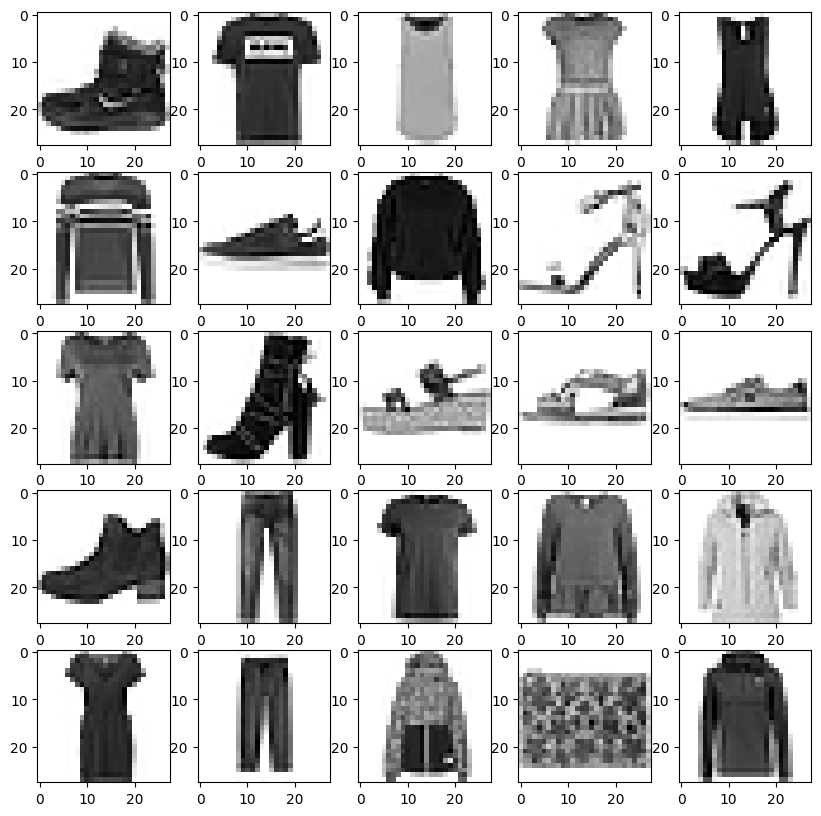

In [ ]:
fig, axs = plt.subplots(5, 5, figsize=(10, 10))
for i in range(25):
  axs[i//5,i%5].imshow(train_images[i], cmap=plt.cm.binary)

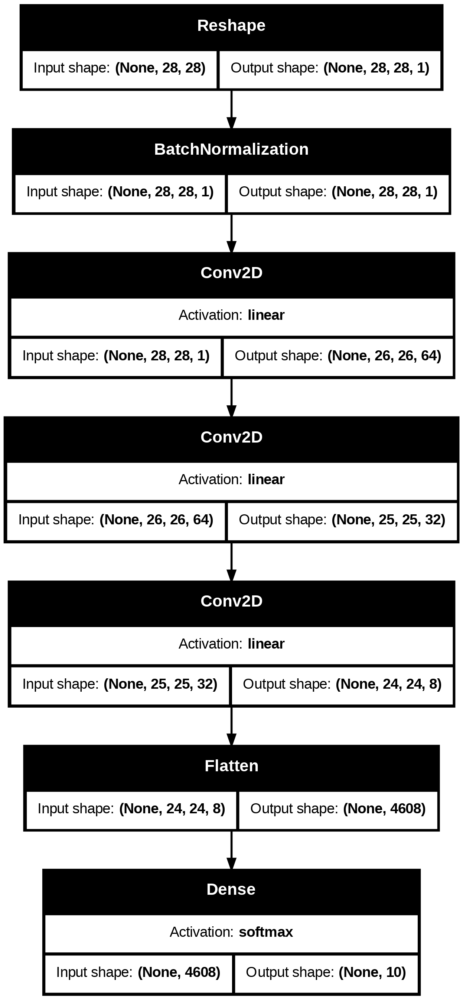

In [ ]:
model = tf.keras.Sequential()
model.add(tf.keras.layers.Input((28, 28),name='in1'))
model.add(tf.keras.layers.Reshape((28, 28, 1),name='resh1'))
model.add(tf.keras.layers.BatchNormalization(name='bn1'))
model.add(tf.keras.layers.Conv2D(64,3,name='conv1'))
model.add(tf.keras.layers.Conv2D(32,2,name='conv2'))
model.add(tf.keras.layers.Conv2D(8,2,name='conv3'))
model.add(tf.keras.layers.Flatten(name='flat1'))
model.add(tf.keras.layers.Dense(10,activation='softmax',name='out1'))
tf.keras.utils.plot_model(model,show_shapes=True,show_layer_activations=True)

In [ ]:
model.compile(optimizer='adam',
              loss=tf.keras.losses.CategoricalCrossentropy(),
              metrics=['accuracy'])
train_labels_cat= tf.keras.utils.to_categorical(train_labels)

In [ ]:
es = tf.keras.callbacks.EarlyStopping(monitor='val_loss', mode='min', patience=3, restore_best_weights=True)

In [ ]:
model.fit(train_images, train_labels_cat, validation_split=0.2, epochs=1000, callbacks=[es])

Epoch 1/1000
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 22s 9ms/step - accuracy: 0.7883 - loss: 0.6054 - val_accuracy: 0.8405 - val_loss: 0.4642
Epoch 2/1000
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 12s 8ms/step - accuracy: 0.8452 - loss: 0.4497 - val_accuracy: 0.8433 - val_loss: 0.4550
Epoch 3/1000
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 11s 7ms/step - accuracy: 0.8500 - loss: 0.4330 - val_accuracy: 0.8360 - val_loss: 0.4645
Epoch 4/1000
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 9s 6ms/step - accuracy: 0.8539 - loss: 0.4151 - val_accuracy: 0.8453 - val_loss: 0.4443
Epoch 5/1000
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 9s 6ms/step - accuracy: 0.8578 - loss: 0.4074 - val_accuracy: 0.8398 - val_loss: 0.4477
Epoch 6/1000
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - accuracy: 0.8585 - loss: 0.4042 - val_accuracy: 0.8472 - val_loss: 0.4345
Epoch 7/1000
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - accuracy: 0.8570 - loss: 0.4017 - val_accuracy: 0.8410 - val_loss: 0.4503
Epoch 8/1000
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - accuracy: 0.86

In [ ]:
y = model.predict(test_images)
import numpy as np
yp = np.argmax(y, axis=1)
from sklearn.metrics import classification_report
print(classification_report(test_labels, yp))
model.save('fmmodel.keras')

313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
              precision    recall  f1-score   support

           0       0.02      0.03      0.02       980
           1       0.03      0.01      0.02      1135
           2       0.22      0.05      0.08      1032
           3       0.22      0.18      0.19      1010
           4       0.01      0.00      0.01       982
           5       0.14      0.35      0.20       892
           6       0.01      0.01      0.01       958
           7       0.01      0.02      0.02      1028
           8       0.06      0.10      0.07       974
           9       0.07      0.06      0.07      1009

    accuracy                           0.08     10000
   macro avg       0.08      0.08      0.07     10000
weighted avg       0.08      0.08      0.07     10000



In [ ]:
import tensorflow as tf
mnist = tf.keras.datasets.mnist
(train_images, train_labels), (test_images, test_labels)   = mnist.load_data()

11490434/11490434 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ resh1 (Reshape)                 │ (None, 28, 28, 1)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bn1 (BatchNormalization)        │ (None, 28, 28, 1)      │             4 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1 (Conv2D)                  │ (None, 26, 26, 64)     │           640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2 (Conv2D)                  │ (None, 25, 25, 32)     │         8,224 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv3 (Conv2D)                  │ (None, 24, 24, 8)      │         1,032 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flat1 (Flatten)                 │ (None, 4608)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ out1 (Dense)                    │ (None, 10)             │        46,090 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 167,968 (656.13 KB)

 Trainable params: 55,988 (218.70 KB)

 Non-trainable params: 2 (8.00 B)

 Optimizer params: 111,978 (437.42 KB)

Model: "functional_14"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ in1 (InputLayer)                │ (None, 28, 28)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ resh1 (Reshape)                 │ (None, 28, 28, 1)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bn1 (BatchNormalization)        │ (None, 28, 28, 1)      │             4 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1 (Conv2D)                  │ (None, 26, 26, 64)     │           640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2 (Conv2D)                  │ (None, 25, 25, 32)     │         8,224 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv3 (Conv2D)                  │ (None, 24, 24, 8)      │         1,032 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 4608)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 10)             │        46,090 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 55,990 (218.71 KB)

 Trainable params: 46,090 (180.04 KB)

 Non-trainable params: 9,900 (38.67 KB)

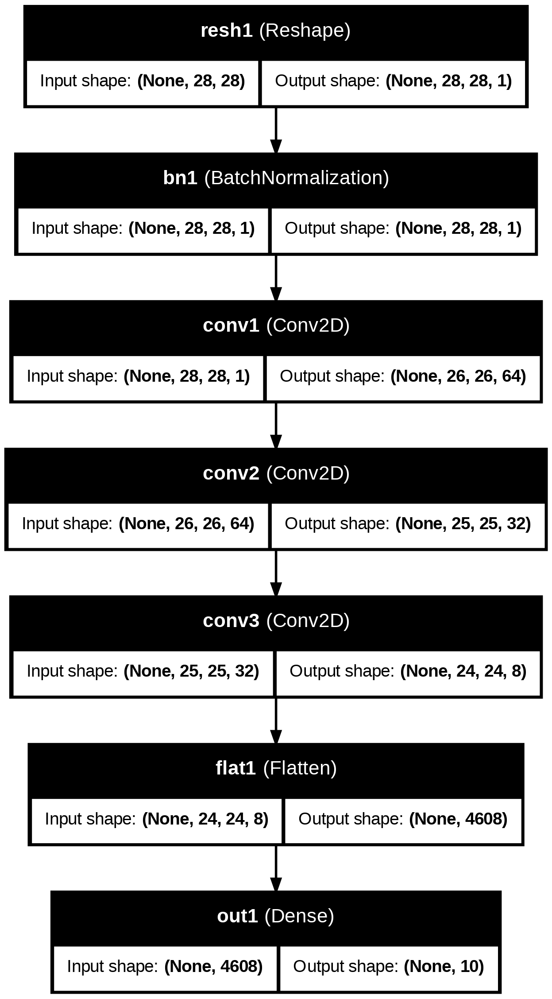

In [ ]:
model = tf.keras.models.load_model('fmmodel.keras')
model.summary()
input = model.get_layer('resh1').input
output = model.get_layer('conv3').output

model.trainable = False
input1 = input
x = tf.keras.layers.Flatten()(output)
output1 = tf.keras.layers.Dense(10, activation='softmax')(x)
FEmodel = tf.keras.models.Model(inputs=[input1], outputs=[output1])
FEmodel.summary()
tf.keras.utils.plot_model(model, show_shapes=True, show_layer_names=True)

In [ ]:
FEmodel.compile(optimizer="adam", loss=tf.keras.losses.CategoricalCrossentropy(), metrics=['accuracy'])
train_labels_cat = tf.keras.utils.to_categorical(train_labels)
es = tf.keras.callbacks.EarlyStopping(monitor='val_loss', mode='min', patience=3)


In [ ]:
y = model.predict(test_images)
import numpy as np
yp = np.argmax(y, axis=1)
from sklearn.metrics import classification_report
print(classification_report(test_labels, yp))
model.save('fmmodel2.keras')

313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
              precision    recall  f1-score   support

           0       0.02      0.03      0.02       980
           1       0.03      0.01      0.02      1135
           2       0.22      0.05      0.08      1032
           3       0.22      0.18      0.19      1010
           4       0.01      0.00      0.01       982
           5       0.14      0.35      0.20       892
           6       0.01      0.01      0.01       958
           7       0.01      0.02      0.02      1028
           8       0.06      0.10      0.07       974
           9       0.07      0.06      0.07      1009

    accuracy                           0.08     10000
   macro avg       0.08      0.08      0.07     10000
weighted avg       0.08      0.08      0.07     10000



In [ ]:
model=tf.keras.models.load_model('fmmodel.keras')
# model.summary()
input=model.get_layer('resh1').input
output=model.get_layer('conv3').output
model.trainable=False
model_headless=tf.keras.models.Model(inputs=[input],outputs=[output])
extracted_features=model_headless.predict(train_images)
extracted_features.shape

1875/1875 ━━━━━━━━━━━━━━━━━━━━ 6s 3ms/step


(60000, 24, 24, 8)

Model: "functional_33"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 24, 24, 8)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_2 (Flatten)             │ (None, 4608)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 10)             │        46,090 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 46,090 (180.04 KB)

 Trainable params: 46,090 (180.04 KB)

 Non-trainable params: 0 (0.00 B)

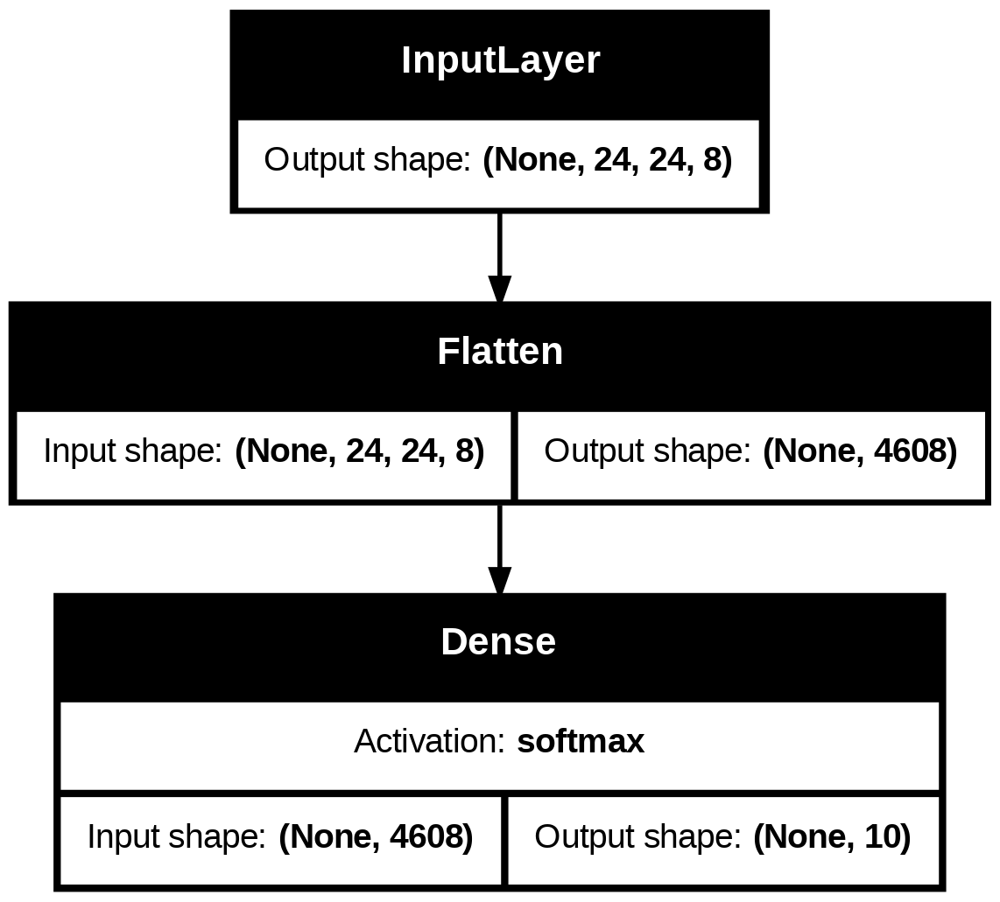

In [ ]:
input1=tf.keras.layers.Input((24,24,8,))
x=tf.keras.layers.Flatten()(input1)
output1=tf.keras.layers.Dense(10,activation='softmax')(x)
model_new_head=tf.keras.models.Model(inputs=[input1],outputs=[output1])
model_new_head.summary()

tf.keras.utils.plot_model(model_new_head,show_shapes=True,show_layer_activations=True)

In [ ]:
model_new_head.compile(optimizer='adam', loss = tf.keras.losses.CategoricalCrossentropy(), metrics=['accuracy'])
es = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', mode='max', patience=3)
model_new_head.fit(extracted_features, train_labels_cat, validation_split=0.2, epochs=1000, callbacks=[es])

Epoch 1/1000
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 12s 7ms/step - accuracy: 0.8425 - loss: 0.5602 - val_accuracy: 0.9164 - val_loss: 0.3023
Epoch 2/1000
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 7s 5ms/step - accuracy: 0.9139 - loss: 0.2997 - val_accuracy: 0.9174 - val_loss: 0.2945
Epoch 3/1000
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 7s 4ms/step - accuracy: 0.9176 - loss: 0.2949 - val_accuracy: 0.9183 - val_loss: 0.2943
Epoch 4/1000
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 8s 5ms/step - accuracy: 0.9200 - loss: 0.2797 - val_accuracy: 0.9195 - val_loss: 0.2954
Epoch 5/1000
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 7s 4ms/step - accuracy: 0.9230 - loss: 0.2777 - val_accuracy: 0.9200 - val_loss: 0.2963
Epoch 6/1000
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 7s 5ms/step - accuracy: 0.9256 - loss: 0.2649 - val_accuracy: 0.9210 - val_loss: 0.2949
Epoch 7/1000
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 13s 7ms/step - accuracy: 0.9265 - loss: 0.2591 - val_accuracy: 0.9161 - val_loss: 0.3028
Epoch 8/1000
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 8s 5ms/step - accuracy: 0.9285

In [ ]:
input = model.get_layer('resh1').input
features = model.get_layer('conv3').output
output1 = model_new_head(features)
model_joined = tf.keras.models.Model(inputs = [input], outputs = [output1])
y=model_joined.predict(test_images)
yp = np.argmax(y, axis=1)
from sklearn.metrics import classification_report
print(classification_report(test_labels, yp))
model.save('fmmodel3.keras')

313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


ValueError: Found input variables with inconsistent numbers of samples: [10000, 1]

Частичное обучение

In [ ]:
FTmodel = tf.keras.models.load_model('fmmodel.keras')
FTmodel.trainable = True
for i in FTmodel.layers:
  i.trainable = False
FTmodel.get_layer('out1').trainable = True
FTmodel.compile(optimizer='adam', loss = tf.keras.losses.CategoricalCrossentropy(),metrics=['accuracy'])
FTmodel.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ resh1 (Reshape)                 │ (None, 28, 28, 1)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bn1 (BatchNormalization)        │ (None, 28, 28, 1)      │             4 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1 (Conv2D)                  │ (None, 26, 26, 64)     │           640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2 (Conv2D)                  │ (None, 25, 25, 32)     │         8,224 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv3 (Conv2D)                  │ (None, 24, 24, 8)      │         1,032 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flat1 (Flatten)                 │ (None, 4608)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ out1 (Dense)                    │ (None, 10)             │        46,090 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 55,990 (218.71 KB)

 Trainable params: 46,090 (180.04 KB)

 Non-trainable params: 9,900 (38.67 KB)

In [ ]:
train_labels_cat = tf.keras.utils.to_categorical(train_labels)
es = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy',mode='max', patience=3)
FTmodel.fit(train_images[:2000], train_labels_cat[:2000], validation_split=0.2, epochs = 1000, callbacks=[es])

Epoch 1/1000
50/50 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - accuracy: 0.1235 - loss: 5.4540 - val_accuracy: 0.4175 - val_loss: 2.6285
Epoch 2/1000
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.4857 - loss: 2.0380 - val_accuracy: 0.6050 - val_loss: 1.4232
Epoch 3/1000
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6967 - loss: 1.0392 - val_accuracy: 0.7125 - val_loss: 0.9581
Epoch 4/1000
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7917 - loss: 0.7215 - val_accuracy: 0.7750 - val_loss: 0.7225
Epoch 5/1000
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8420 - loss: 0.5647 - val_accuracy: 0.7925 - val_loss: 0.6098
Epoch 6/1000
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8700 - loss: 0.4677 - val_accuracy: 0.8375 - val_loss: 0.5302
Epoch 7/1000
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8810 - loss: 0.4182 - val_accuracy: 0.8525 - val_loss: 0.4846
Epoch 8/1000
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9195 - loss: 0.3199 - val_accuracy: 0

Медленное обучение

In [ ]:
FTmodel=tf.keras.models.load_model('fmmodel.keras')
FTmodel.trainable=True
FTmodel.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-5),
              loss=tf.keras.losses.CategoricalCrossentropy(),
              metrics=['accuracy'])
# FTmodel.summary()

/usr/local/lib/python3.12/dist-packages/keras/src/saving/saving_lib.py:802: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 22 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


In [ ]:
es = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy',mode='max', patience=3)
FTmodel.fit(train_images[:2000], train_labels_cat[:2000], validation_split=0.2, epochs = 1000, callbacks=[es])

Epoch 1/1000


/usr/local/lib/python3.12/dist-packages/keras/src/backend/tensorflow/trainer.py:83: UserWarning: The model does not have any trainable weights.
  warnings.warn("The model does not have any trainable weights.")


50/50 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.0834 - loss: 6.8933 - val_accuracy: 0.0725 - val_loss: 6.6120
Epoch 2/1000
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.0885 - loss: 6.9918 - val_accuracy: 0.0725 - val_loss: 6.6120
Epoch 3/1000
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.0819 - loss: 7.0151 - val_accuracy: 0.0725 - val_loss: 6.6120
Epoch 4/1000
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.0799 - loss: 6.7876 - val_accuracy: 0.0725 - val_loss: 6.6120


Большие языковые модели

In [ ]:
bert_m= 'https://tfhub.dev/tensorflow/small_bert/bert_en_uncased_L-4_H-512_A-8/1'
bert_pp='https://tfhub.dev/tensorflow/bert_en_uncased_preprocess/3'

In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.neural_network import MLPClassifier

df = pd.read_csv('https://github.com/clairett/pytorch-sentiment-classification/raw/master/data/SST2/train.tsv', delimiter='\t', header=None)
batch_i = df[:500]
print(batch_i[:4])

                                                   0  1
0  a stirring , funny and finally transporting re...  1
1  apparently reassembled from the cutting room f...  0
2  they presume their audience wo n't sit still f...  0
3  this is a visually stunning rumination on love...  1


In [ ]:
import tensorflow_hub as hub
import tensorflow_text as text
import tensorflow as tf

text_input = tf.keras.layers.Input(shape=(), dtype=tf.string)
preprocessor = hub.KerasLayer(bert_pp)
encoder = hub.KerasLayer(bert_m,trainable=False)

class MyTokenizer(tf.keras.layers.Layer):
    def call(self, x):
        return preprocessor(x)
class MyModel(tf.keras.layers.Layer):
    def call(self, x):
        return encoder(x)

text_input = tf.keras.layers.Input(shape = (), dtype=tf.string)
encoder_inputs = MyTokenizer()(text_input)
outputs = MyModel()(encoder_inputs)
pooled_output = outputs["pooled_output"]
sequence_output = outputs["sequence_output"]

In [ ]:
embedding_model = tf.keras.Model(text_input, pooled_output)
sentences = tf.constant(["Hello, welcome to Itkutsk State University!"])
print(MyTokenizer()(sentences))
print(embedding_model(sentences))

{'input_type_ids': <tf.Tensor: shape=(1, 128), dtype=int32, numpy=
array([[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]],
      dtype=int32)>, 'input_mask': <tf.Tensor: shape=(1, 128), dtype=int32, numpy=
array([[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,

In [ ]:
X, Y = [], []
for i in range(6900):
  text = df[0][i]
  label = df[1][i]
  print(i, ' from ', df[0].shape[0])
  X.append(embedding_model(np.array([text]))[0])
  Y.append(label)

Выходные данные были обрезаны до нескольких последних строк (5000).
1900  from  6920
1901  from  6920
1902  from  6920
1903  from  6920
1904  from  6920
1905  from  6920
1906  from  6920
1907  from  6920
1908  from  6920
1909  from  6920
1910  from  6920
1911  from  6920
1912  from  6920
1913  from  6920
1914  from  6920
1915  from  6920
1916  from  6920
1917  from  6920
1918  from  6920
1919  from  6920
1920  from  6920
1921  from  6920
1922  from  6920
1923  from  6920
1924  from  6920
1925  from  6920
1926  from  6920
1927  from  6920
1928  from  6920
1929  from  6920
1930  from  6920
1931  from  6920
1932  from  6920
1933  from  6920
1934  from  6920
1935  from  6920
1936  from  6920
1937  from  6920
1938  from  6920
1939  from  6920
1940  from  6920
1941  from  6920
1942  from  6920
1943  from  6920
1944  from  6920
1945  from  6920
1946  from  6920
1947  from  6920
1948  from  6920
1949  from  6920
1950  from  6920
1951  from  6920
1952  from  6920
1953  from  6920
1954  from  69

In [ ]:
X = np.array(X)
Y = np.array(Y)
from sklearn.model_selection import train_test_split
X_train, X_test, Y_train, Y_test = train_test_split(X, Y)

In [ ]:
clf = MLPClassifier(hidden_layer_sizes=(7))
clf.fit(X_train, Y_train)
clf.score(X_test, Y_test)

/usr/local/lib/python3.12/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


0.7542028985507246

In [ ]:
mybatch = [["It is very very bad"], ["I would recommend this"], ["I like it!"], ["I hate it!!!"], ["Ugly case!"]]
embeddings = embedding_model(np.array(mybatch))
print(embeddings.shape)
clf.predict(embeddings)

(5, 512)


array([0, 1, 0, 1, 0])

In [ ]:
input1 = tf.keras.layers.Input((512,))
# No need for Flatten since input is already 1D (512,)
# For binary classification, use 1 unit with sigmoid activation
x2 = tf.keras.layers.Dense(1, activation='relu')(input1)
x2 = tf.keras.layers.Dense(1, activation='relu')(x2)
output1 = tf.keras.layers.Dense(1, activation='sigmoid')(x2)
model_new_head = tf.keras.models.Model(inputs=[input1], outputs=[output1])

model_new_head.summary()

# Compile with binary crossentropy
model_new_head.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-5),
    loss=tf.keras.losses.BinaryCrossentropy(),
    metrics=['accuracy']
)

# Train the model
print(f"Training data shape: X_train={X_train.shape}, Y_train={Y_train.shape}")
history = model_new_head.fit(
    X_train, Y_train,
    validation_data=(X_test, Y_test),
    epochs=100,
    batch_size=32,
    verbose=1
)

# Evaluate
test_loss, test_acc = model_new_head.evaluate(X_test, Y_test, verbose=0)
print(f"Test accuracy: {test_acc}")

Model: "functional_69"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_15 (InputLayer)     │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_25 (Dense)                │ (None, 1)              │           513 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_26 (Dense)                │ (None, 1)              │             2 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_27 (Dense)                │ (None, 1)              │             2 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 517 (2.02 KB)

 Trainable params: 517 (2.02 KB)

 Non-trainable params: 0 (0.00 B)

Training data shape: X_train=(5175, 512), Y_train=(5175,)
Epoch 1/100
162/162 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - accuracy: 0.5353 - loss: 0.6931 - val_accuracy: 0.5241 - val_loss: 0.6931
Epoch 2/100
162/162 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.5140 - loss: 0.6931 - val_accuracy: 0.5241 - val_loss: 0.6931
Epoch 3/100
162/162 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.5111 - loss: 0.6931 - val_accuracy: 0.5241 - val_loss: 0.6931
Epoch 4/100
162/162 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.5121 - loss: 0.6931 - val_accuracy: 0.5241 - val_loss: 0.6931
Epoch 5/100
162/162 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.5155 - loss: 0.6931 - val_accuracy: 0.5241 - val_loss: 0.6931
Epoch 6/100
162/162 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.5225 - loss: 0.6931 - val_accuracy: 0.5241 - val_loss: 0.6931
Epoch 7/100
162/162 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.5088 - loss: 0.6931 - val_accuracy: 0.5241 - val_loss: 0.6931
Epoch 8/100
162/162 ━━━━━━━━━━━━━━━━━━

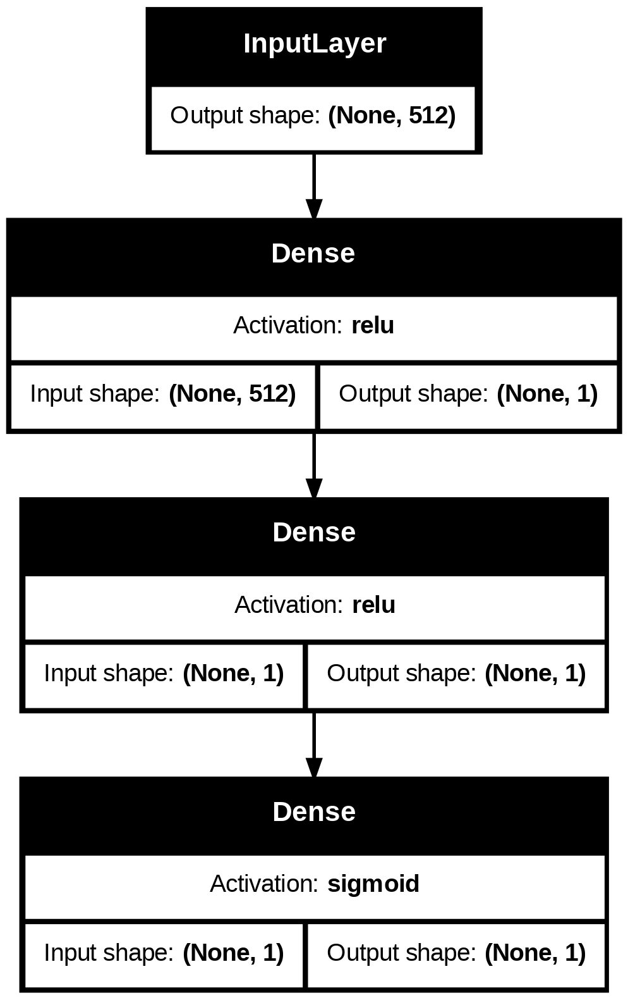

In [ ]:
tf.keras.utils.plot_model(model_new_head,show_shapes=True,show_layer_activations=True)

In [ ]:
predictions = model_new_head.predict(embeddings)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


In [ ]:
for i in range(len(mybatch)):
    text = mybatch[i]
    pred = predictions[i]
    probability = pred[0]  # sigmoid output
    sentiment = "POSITIVE" if probability > 0.5 else "NEGATIVE"
    print(f"Text: {text}")
    print(f"  Probability: {probability}")
    print(f"  Sentiment: {sentiment}")
    print("-" * 40)

Text: ['It is very very bad']
  Probability: 0.5076029300689697
  Sentiment: POSITIVE
----------------------------------------
Text: ['I would recommend this']
  Probability: 0.5076029300689697
  Sentiment: POSITIVE
----------------------------------------
Text: ['I like it!']
  Probability: 0.5076029300689697
  Sentiment: POSITIVE
----------------------------------------
Text: ['I hate it!!!']
  Probability: 0.5076029300689697
  Sentiment: POSITIVE
----------------------------------------
Text: ['Ugly case!']
  Probability: 0.5076029300689697
  Sentiment: POSITIVE
----------------------------------------


15.12.2025

Экстрактивный саммаризатор

In [ ]:
import re
def read_article(file_name):
  f = open(file_name)
  s = f.read()
  ssplit = re.compile(r'[\.\!\?]+')
  wsplit = re.compile(r'[\s\,\-\;\:]+')
  d = ssplit.split(s)
  sentences = []
  for sent in d:
    sentences.append(wsplit.split(sent))
  return sentences

res = read_article('texten2.txt')
print(res)

[['Lake', 'Baikal[a]', 'is', 'a', 'rift', 'lake', 'and', 'the', 'deepest', 'lake', 'in', 'the', 'world'], ['[5]', 'It', 'is', 'situated', 'in', 'southern', 'Siberia', 'Russia', 'between', 'the', 'federal', 'subjects', 'of', 'Irkutsk', 'Oblast', 'to', 'the', 'northwest', 'and', 'the', 'Republic', 'of', 'Buryatia', 'to', 'the', 'southeast'], ['', 'At', '31', '722', 'km2', '(12', '248', 'sq', 'mi)—slightly', 'larger', 'than', 'Belgium—Lake', 'Baikal', 'is', 'the', "world's", 'seventh', 'largest', 'lake', 'by', 'surface', 'area', '[6]', 'as', 'well', 'as', 'the', 'second', 'largest', 'lake', 'in', 'Eurasia', 'after', 'the', 'Caspian', 'Sea'], ['', 'However', 'because', 'it', 'is', 'also', 'the', 'deepest', 'lake', '[7]', 'with', 'a', 'maximum', 'depth', 'of', '1', '642', 'metres', '(5', '387', 'feet)', '[1]', 'Lake', 'Baikal', 'is', 'the', "world's", 'largest', 'freshwater', 'lake', 'by', 'volume', 'containing', '23', '615'], ['39', 'km3', '(5', '670', 'cu', 'mi)', 'of', 'water[1]', 'or', 

In [ ]:
def sentence_similarity(sent1, sent2, stopwords=None):
    if stopwords is None:
        stopwords = []
    sent1 = [w.lower() for w in sent1]
    sent2 = [w.lower() for w in sent2]
    all_words = list(set(sent1 + sent2))
    vector1 = [0] * len(all_words)
    vector2 = [0] * len(all_words)
    for w in sent1:
        if not (w in stopwords):
          vector1[all_words.index(w)] += 1
    for w in sent2:
        if not w in stopwords:
          vector2[all_words.index(w)] += 1
    return 1 - cosine_distance(vector1, vector2)

In [ ]:
import numpy as np
def build_similarity_matrix(sentences, stop_words):
  similarity_matrix = np.zeros((len(sentences), len(sentences)))
  for ind1 in range(len(sentences)):
    for ind2 in range(len(sentences)):
      if ind1 != ind2:
        similarity_matrix[ind1][ind2] = sentence_similarity(sentences[ind1], sentences[ind2], stop_words)
  return similarity_matrix

In [ ]:
from nltk.corpus import stopwords
from nltk.cluster.util import cosine_distance
import numpy as np
import networkx as nx
import nltk
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [ ]:
stop_words = stopwords.words('english')
summarize_text = []
sentences =  read_article('texten2.txt')

In [ ]:
res2 = build_similarity_matrix(sentences, stop_words)
print(res2)

[[0.         0.         0.30901572 0.49813548 0.         0.
  0.26311741 0.2508726  0.13678823 0.36313652 0.09805807 0.        ]
 [0.         0.         0.         0.         0.         0.
  0.         0.         0.04559608 0.         0.         0.        ]
 [0.30901572 0.         0.         0.36687054 0.08753762 0.05598925
  0.11744404 0.16796775 0.09158438 0.20261022 0.13130643 0.        ]
 [0.49813548 0.         0.36687054 0.         0.08466675 0.10830607
  0.17038855 0.21661214 0.17716158 0.27435163 0.12700013 0.        ]
 [0.         0.         0.08753762 0.08466675 0.         0.07106691
  0.1490712  0.         0.         0.         0.         0.        ]
 [0.         0.         0.05598925 0.10830607 0.07106691 0.
  0.         0.         0.04956816 0.         0.         0.        ]
 [0.26311741 0.         0.11744404 0.17038855 0.1490712  0.
  0.         0.09534626 0.05198752 0.20701967 0.         0.        ]
 [0.2508726  0.         0.16796775 0.21661214 0.         0.
  0.09534626 

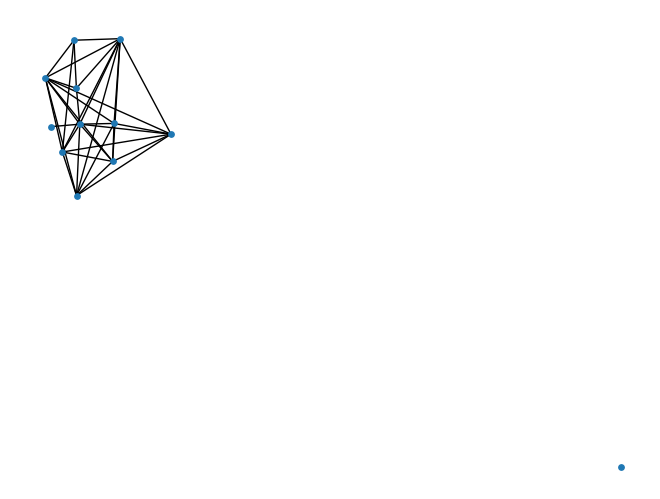

In [ ]:
sentence_similarity_graph = nx.from_numpy_array(res2)
pos = nx.kamada_kawai_layout(sentence_similarity_graph)
nx.draw(sentence_similarity_graph, pos, node_size = 15)

In [ ]:
scores = nx.pagerank(sentence_similarity_graph)
print(scores)

{0: 0.14989228143977645, 1: 0.01748329785459516, 2: 0.12566211654600576, 3: 0.1632562467569642, 4: 0.04380694403767407, 5: 0.03591460778257488, 6: 0.09006747501989101, 7: 0.10291980112534373, 8: 0.08128918099744134, 9: 0.12071989569699093, 10: 0.05553523794431363, 11: 0.013452914798428472}


In [ ]:
sorted_items = sorted(scores.items(), key=lambda item: item[1], reverse=True)

# 2. Преобразуем отсортированный список кортежей обратно в словарь
sorted_dict_desc = dict(sorted_items)
sorted_dict_desc
for k in list(sorted_dict_desc.keys())[:4]:
  print(k, " ".join(sentences[k]))

3  However because it is also the deepest lake [7] with a maximum depth of 1 642 metres (5 387 feet) [1] Lake Baikal is the world's largest freshwater lake by volume containing 23 615
0 Lake Baikal[a] is a rift lake and the deepest lake in the world
2  At 31 722 km2 (12 248 sq mi)—slightly larger than Belgium—Lake Baikal is the world's seventh largest lake by surface area [6] as well as the second largest lake in Eurasia after the Caspian Sea
9 [18] The region to the east of Lake Baikal is referred to as Transbaikalia or as the Transbaikal [19] and the loosely defined region around the lake itself is sometimes known as Baikalia


Абстрактивный саммаризатор

In [ ]:
!pip install transformers
!pip install sentencepiece
!pip install torch

In [ ]:
from transformers import PegasusForConditionalGeneration, PegasusTokenizer
# import torch
src_text = [
""" Evgeny's total store of knowledge
     I have no leisure to recall;
     where he was master of his college,
     the art he'd studied best of all,
     his young heyday's supreme employment,
     its work, its torture, its enjoyment,
     what occupied his chafing powers
     throughout the boredom of the hours --
     this was the science of that passion
     which Ovid sang, for which the bard,
     condemned to a lifetime of hard,
     ended his wild career of fashion
     deep in Moldavia the abhorred,
     far, far from Italy, his adored. """
]

model_name = 'google/pegasus-xsum'

In [ ]:
device = 'cuda'
tokenizer = PegasusTokenizer
tokenizer = PegasusTokenizer.from_pretrained(model_name)
print(tokenizer)


PegasusTokenizer(name_or_path='google/pegasus-xsum', vocab_size=96103, model_max_length=512, is_fast=False, padding_side='right', truncation_side='right', special_tokens={'eos_token': '</s>', 'unk_token': '<unk>', 'pad_token': '<pad>', 'mask_token': '<mask_2>', 'additional_special_tokens': ['<mask_1>', '<unk_2>', '<unk_3>', '<unk_4>', '<unk_5>', '<unk_6>', '<unk_7>', '<unk_8>', '<unk_9>', '<unk_10>', '<unk_11>', '<unk_12>', '<unk_13>', '<unk_14>', '<unk_15>', '<unk_16>', '<unk_17>', '<unk_18>', '<unk_19>', '<unk_20>', '<unk_21>', '<unk_22>', '<unk_23>', '<unk_24>', '<unk_25>', '<unk_26>', '<unk_27>', '<unk_28>', '<unk_29>', '<unk_30>', '<unk_31>', '<unk_32>', '<unk_33>', '<unk_34>', '<unk_35>', '<unk_36>', '<unk_37>', '<unk_38>', '<unk_39>', '<unk_40>', '<unk_41>', '<unk_42>', '<unk_43>', '<unk_44>', '<unk_45>', '<unk_46>', '<unk_47>', '<unk_48>', '<unk_49>', '<unk_50>', '<unk_51>', '<unk_52>', '<unk_53>', '<unk_54>', '<unk_55>', '<unk_56>', '<unk_57>', '<unk_58>', '<unk_59>', '<unk_60

In [ ]:
model = PegasusForConditionalGeneration.from_pretrained(model_name)
model.eval()

Some weights of PegasusForConditionalGeneration were not initialized from the model checkpoint at google/pegasus-xsum and are newly initialized: ['model.decoder.embed_positions.weight', 'model.encoder.embed_positions.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


PegasusForConditionalGeneration(
  (model): PegasusModel(
    (shared): Embedding(96103, 1024, padding_idx=0)
    (encoder): PegasusEncoder(
      (embed_tokens): Embedding(96103, 1024, padding_idx=0)
      (embed_positions): PegasusSinusoidalPositionalEmbedding(512, 1024)
      (layers): ModuleList(
        (0-15): 16 x PegasusEncoderLayer(
          (self_attn): PegasusAttention(
            (k_proj): Linear(in_features=1024, out_features=1024, bias=True)
            (v_proj): Linear(in_features=1024, out_features=1024, bias=True)
            (q_proj): Linear(in_features=1024, out_features=1024, bias=True)
            (out_proj): Linear(in_features=1024, out_features=1024, bias=True)
          )
          (self_attn_layer_norm): LayerNorm((1024,), eps=1e-05, elementwise_affine=True)
          (activation_fn): ReLU()
          (fc1): Linear(in_features=1024, out_features=4096, bias=True)
          (fc2): Linear(in_features=4096, out_features=1024, bias=True)
          (final_layer_nor

In [ ]:
batch = tokenizer(src_text, padding='longest', return_tensors="pt") #.to(device)
print(batch)
translated = model.generate(**batch)
tgt_text = tokenizer.batch_decode(translated, skip_special_tokens=True)
print(tgt_text)

{'input_ids': tensor([[30962,  6317,   415,   131,   116,   916,   794,   113,   825,   125,
           133,   220,  7485,   112,  6213,   206,   241,   178,   140,  2080,
           113,   169,  1416,   108,   109,   691,   178,   131,   252,  4525,
           229,   113,   149,   108,   169,   758, 46441,   131,   116, 16250,
          2856,   108,   203,   201,   108,   203, 16520,   108,   203,  9289,
           108,   180,  8452,   169, 81914,  6135,   720,   109, 27622,   113,
           109,   539,  1315,   136,   140,   109,  1578,   113,   120,  2421,
           162, 86243, 11968,   108,   118,   162,   109,  1290,   252,   108,
         20238,   112,   114,  3913,   113,   514,   108,  2371,   169,  3057,
          1010,   113,  1947,  1355,   115, 16955, 46725,   109, 71119,  6388,
           108,   571,   108,   571,   135,  3397,   108,   169, 31720,   107,
             1]]), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,